In [81]:
import warnings
warnings.filterwarnings("ignore")

In [82]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [83]:
current_dir='/content/gdrive/My Drive/lums/DM/project_data/'

<h1><center>DATA MINING PROJECT – SPRING 2023</center></h1>
<h1><center>Deliverable No 1</center></h1>
<h1><center>US Elections Tweets 2020 DATA ANALYSIS</center></h1>
<h1><center>Data Understanding and Exploratory Data Analysis</center></h1>


## TODOS
Deliverable 1: Pre-processing & Exploratory Data Analysis (EDA) [40%]:
This deliverable is primarily focused on extracting as getting your hands dirty with the dataset.
This will consists of data cleaning / pre-processing, initial data exploration, visualizations etc.
This couldinclude but not limited to the following points:


* Change types of columns as per requirements (Zara, Zoha, Seemal)
* Find and handle missing values or incomplete rows (Zara, Zoha, Seemal)
* Correlation between attributes (Zara) done (see how lang log is handel)
* Tweet cleaning/preprocessing and find meaning attributes from them e.g hashtags etc (Zara) done
* Tweet analysis and classification into positive, negative or neutral (Zara) done
* Candidate wise analysis of the tweets(Zara) done
* Location wise analysis of tweets ( Zoha, Seemal)
* Using maps to visualize tweets counts, likes etc  ( Zoha, Seemal)
* These are just some suggestions of tasks you can do. You need to figure out what other
useful information can you figure out from this data. You need to elaborate your
technique along with reasoning for each task you perform in your report.

##IMPORTS

In [84]:
!pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [85]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from textblob import TextBlob
from wordcloud import WordCloud, STOPWORDS
import plotly.express as px
from pandas_profiling import ProfileReport
import nltk
nltk.download('stopwords')
import nltk
nltk.download('wordnet')
from collections import defaultdict
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
nltk.download('punkt')
import re
import random
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## READ Dataset

In [86]:
df = pd.read_csv(current_dir+'US_Election_Tweets_2020.csv', lineterminator='\n')
df.columns

Index(['Unnamed: 0', 'created_at', 'tweet_id', 'tweet', 'likes',
       'retweet_count', 'source', 'user_id', 'user_name', 'user_screen_name',
       'user_description', 'user_join_date', 'user_followers_count',
       'user_location', 'lat', 'long', 'city', 'country', 'continent', 'state',
       'state_code', 'collected_at', 'Candidate'],
      dtype='object')

In [87]:
df.shape

(1747805, 23)

In [88]:
df.head(5)

,Unnamed: 0,created_at,tweet_id,tweet,likes,retweet_count,source,user_id,user_name,user_screen_name,...,user_location,lat,long,city,country,continent,state,state_code,collected_at,Candidate
0,0,2020-10-15 00:00:01,1.316529e+18,#Elecciones2020 | En #Florida: #JoeBiden dice ...,0.0,0.0,TweetDeck,3.606665e+08,El Sol Latino News,elsollatinonews,...,"Philadelphia, PA / Miami, FL",25.774270,-80.193660,NaN,United States of America,North America,Florida,FL,2020-10-21 00:00:00,TRUMP
1,1,2020-10-15 00:00:01,1.316529e+18,#Elecciones2020 | En #Florida: #JoeBiden dice ...,0.0,0.0,TweetDeck,3.606665e+08,El Sol Latino News,elsollatinonews,...,"Philadelphia, PA / Miami, FL",25.774270,-80.193660,NaN,United States of America,North America,Florida,FL,2020-10-21 00:00:00,BIDEN
2,2,2020-10-15 00:00:01,1.316529e+18,"Usa 2020, Trump contro Facebook e Twitter: cop...",26.0,9.0,Social Mediaset,3.316176e+08,Tgcom24,MediasetTgcom24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:00.373216530,TRUMP
3,3,2020-10-15 00:00:02,1.316529e+18,"#Trump: As a student I used to hear for years,...",2.0,1.0,Twitter Web App,8.436472e+06,snarke,snarke,...,Portland,45.520247,-122.674195,Portland,United States of America,North America,Oregon,OR,2020-10-21 00:00:00.746433060,TRUMP
4,4,2020-10-15 00:00:02,1.316529e+18,2 hours since last tweet from #Trump! Maybe he...,0.0,0.0,Trumpytweeter,8.283556e+17,Trumpytweeter,trumpytweeter,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-10-21 00:00:01.119649591,TRUMP


In [89]:
##Droping ids and sr# columns
df.drop(columns=['Unnamed: 0'], inplace= True)

In [90]:
## duplicate tweets
df.duplicated(['tweet']).sum()
### how to handle these

240600

In [91]:
df.dtypes

created_at               object
tweet_id                float64
tweet                    object
likes                   float64
retweet_count           float64
source                   object
user_id                 float64
user_name                object
user_screen_name         object
user_description         object
user_join_date           object
user_followers_count    float64
user_location            object
lat                     float64
long                    float64
city                     object
country                  object
continent                object
state                    object
state_code               object
collected_at             object
Candidate                object
dtype: object

#Statistics

In [92]:
df.describe()

,tweet_id,likes,retweet_count,user_id,user_followers_count,lat,long
count,1.747805e+06,1.747805e+06,1.747805e+06,1.747805e+06,1.747805e+06,801012.000000,801012.000000
mean,1.322649e+18,8.670096e+00,1.890890e+00,4.496635e+17,2.538003e+04,35.434583,-41.083772
std,2.574594e+15,2.860510e+02,7.101557e+01,5.557602e+17,3.572733e+05,18.425141,67.666098
min,1.316529e+18,0.000000e+00,0.000000e+00,5.310000e+02,0.000000e+00,-90.000000,-175.202642
25%,1.320677e+18,0.000000e+00,0.000000e+00,2.203655e+08,7.500000e+01,31.816038,-97.086720
50%,1.323767e+18,0.000000e+00,0.000000e+00,2.408731e+09,4.350000e+02,39.783730,-74.006015
75%,1.324727e+18,2.000000e+00,0.000000e+00,1.083496e+18,2.072000e+03,45.520247,6.130161
max,1.325589e+18,1.657020e+05,6.347300e+04,1.325581e+18,8.241710e+07,90.000000,179.048837


#Missing Values

In [93]:
print("number of missing values in each column")
for x in df.columns:
  count=df[x].isna().sum()
  print(x, ":  ", count, "and percentage is ", count/len(df)*100)

number of missing values in each column
created_at :   0 and percentage is  0.0
tweet_id :   0 and percentage is  0.0
tweet :   0 and percentage is  0.0
likes :   0 and percentage is  0.0
retweet_count :   0 and percentage is  0.0
source :   1589 and percentage is  0.09091403217178118
user_id :   0 and percentage is  0.0
user_name :   34 and percentage is  0.0019452971012212461
user_screen_name :   0 and percentage is  0.0
user_description :   183272 and percentage is  10.485837951030007
user_join_date :   0 and percentage is  0.0
user_followers_count :   0 and percentage is  0.0
user_location :   528744 and percentage is  30.25188736729784
lat :   946793 and percentage is  54.17040230460491
long :   946793 and percentage is  54.17040230460491
city :   1333746 and percentage is  76.3097713989833
country :   951278 and percentage is  54.42700987810425
continent :   951243 and percentage is  54.4250073663824
state :   1166990 and percentage is  66.76889012218183
state_code :   1202771 an

<Axes: >

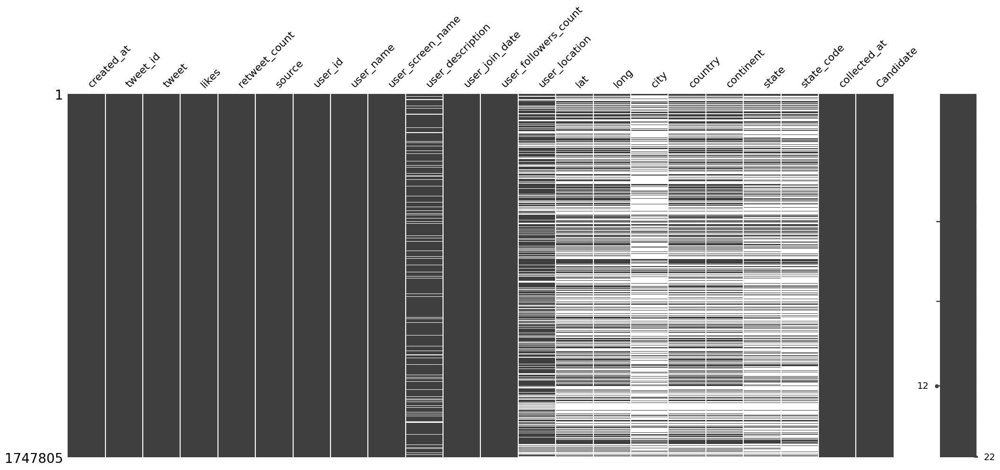

In [94]:
import missingno as msno
msno.matrix(df)

## source name

as the number of missing values are very less we can fill it with the mode of the column, for that lets first see the unique values, their counts and then take their mode

In [95]:
sources = df['source'].tolist()
counts= Counter(sources)
most_common_source = counts.most_common(6)
print(" # number of unique sources: ", len(counts))
print("# count of top 10 words: ", counts.most_common(20))
df['source'].fillna(counts.most_common(1)[0][0], inplace = True)

 # number of unique sources:  1037
# count of top 10 words:  [('Twitter Web App', 561380), ('Twitter for iPhone', 518843), ('Twitter for Android', 488212), ('Twitter for iPad', 61362), ('TweetDeck', 29988), ('Instagram', 11503), ('Hootsuite Inc.', 9326), ('Buffer', 4818), ('Twitter Media Studio', 2849), ('WordPress.com', 2624), ('IFTTT', 2593), ('dlvr.it', 2540), ('Tweetbot for iΟS', 1777), ('TweetCaster for Android', 1733), (nan, 1589), ('RSS Post Syndication', 1325), ('Periscope', 1209), ('SocialFlow', 1190), ('FS Poster', 1170), ('Twitter for Mac', 1121)]


In [96]:
del sources

## user name

The missing values in the user_screen name column are filled with the mode of that column. To find the mode, we calculate the number of unique values in the column, and take their mode.

In [97]:
users = df[[ 'user_id', 'user_name', 'user_screen_name' ]]
print("Number of unique Ids",len(users.user_id.unique()))
print("Number of unique Name", len(users.user_name.unique()))
print("Number of unique screen NAme",len(users.user_screen_name.unique()))
print(users.shape)
users.drop_duplicates(inplace=True)
print(users.shape)
## as unique user_names are less this means that the same name belongs to more then one user_id
## as unique userscreen_name are more then user_id , a id can have more then one user_ screen name
## user screen_name more reliable

Number of unique Ids 483212
Number of unique Name 450661
Number of unique screen NAme 484099
(1747805, 3)
(490373, 3)


In [98]:
user_scr= users[['user_id', 'user_screen_name']].drop_duplicates()
print(user_scr.shape)
user_scr.drop_duplicates(['user_id'], inplace=True)
user_scr.rename(columns = {'user_screen_name':'user_screen_name_1'}, inplace = True)
print(user_scr.shape)

(484106, 2)
(483212, 2)


In [99]:
newdf = df.merge(user_scr, how='left', on='user_id')
newdf.drop(columns=['user_screen_name'], inplace =True)
newdf.rename(columns = {'user_screen_name_1':'user_screen_name'}, inplace = True)
del df
df = newdf
del newdf
del users
del user_scr

In [100]:
len(df.user_screen_name.unique())

483207

In [101]:
users_null=df[df['user_name'].isna()][['user_name','user_id']]
print(" number of null values in user name",users_null.shape)
users_null.drop_duplicates(inplace=True)
print(" number of null values in user name after dropping duplicates ",users_null.shape)

users_name_ass = df[df['user_id'].isin(users_null['user_id'].tolist())][['user_id','user_name']]
del users_null
users_name_ass.drop_duplicates(inplace=True)
users_name_ass.dropna(inplace=True)
users_name_ass=users_name_ass.drop_duplicates(['user_id'])
users_name_ass

 number of null values in user name (34, 2)
 number of null values in user name after dropping duplicates  (17, 2)


,user_id,user_name
230589,7.930159e+17,August Landmesser 🌳 #DjabWurrungTrees
514560,1.300555e+18,plainsight_2020
554515,1.505861e+09,Matt Newland


In [102]:
users_name_ass.rename(columns = {'user_name':'user_name_1'}, inplace = True)
  

In [103]:
newdf = df.merge(users_name_ass, how='left', on='user_id')

In [104]:
newdf['user_name'].isna().sum()

34

In [105]:
newdf['user_name']=  np.where(newdf['user_name'].isna(), newdf['user_name_1'] , newdf['user_name'])
newdf['user_name'].isna().sum()

17

In [106]:
newdf['user_name'] = np.where(newdf['user_name'].isna(), newdf['user_screen_name'] , newdf['user_name'])
newdf['user_name'].isna().sum()

0

There are 34 null in user name after finding out unique only 17 user names are missing


In [107]:
del df 
del users_name_ass
df= newdf
del newdf
df.drop(columns=['user_name_1'], inplace =True)

In [108]:
## make all the names beloging to single id same 
usr=df[['user_name','user_id']]
print(" number of user id  values in user name after dropping duplicates ",usr.shape)
usr.drop_duplicates('user_id',inplace=True)
print(" number of user id values in user name after dropping duplicates ",usr.shape)
usr.rename(columns = {'user_name':'user_name_1'}, inplace = True)
newdf = df.merge(usr, how='left', on='user_id')

 number of user id  values in user name after dropping duplicates  (1747805, 2)
 number of user id values in user name after dropping duplicates  (483212, 2)


In [109]:
del df 
del usr
df= newdf
del newdf

##Country  And Contient

In [110]:
df['country'].replace({'United States':'United States of America'}, inplace =True)
usr_loc=df[df['country'].isna()][['country', 'continent','user_screen_name']]
print(" number of null values in country",usr_loc.shape)
usr_loc.drop_duplicates(inplace=True)
print(" number of null values in country after dropping duplicates ",usr_loc.shape)
usr_loc_grp = df[df['user_screen_name'].isin(usr_loc['user_screen_name'].tolist())][['user_screen_name','country','continent']]
usr_loc_grp.drop_duplicates(inplace=True)
usr_loc_grp.dropna(inplace=True)
usr_loc_grp=usr_loc_grp.drop_duplicates(['user_screen_name'])
usr_loc_grp

 number of null values in country (951278, 3)
 number of null values in country after dropping duplicates  (287828, 3)


,user_screen_name,country,continent
239,ChristianVoters,United States of America,North America
961,FireandRain23,United States of America,North America
1014,NickSones,United States of America,North America
1772,RottenRepublica,United States of America,North America
1923,PalestineChron,United States of America,North America
...,...,...,...
1733030,xxnavygirl,United States of America,North America
1736956,rodolfocaden4,United States of America,North America
1737387,MareOttenberg,United States of America,North America
1743550,meea2020,United States of America,North America


In [111]:
usr_loc_grp.rename(columns = {'country':'country_1', 'continent':'continent_1'}, inplace = True)
newdf = df.merge(usr_loc_grp, how='left', on='user_screen_name')
newdf['country'].isna().sum()/len(newdf)

0.5442700987810425

In [112]:
newdf['continent'].isna().sum()/len(newdf)

0.544250073663824

In [113]:
newdf['country']=  np.where(newdf['country'].isna(), newdf['country_1'] , newdf['country'])
newdf['continent']=  np.where(newdf['continent'].isna(), newdf['continent_1'] , newdf['continent'])
newdf['country'].isna().sum()/len(newdf)

0.5410500599323151

In [114]:
newdf['continent'].isna().sum()/len(newdf)

0.5410300348150966

In [115]:
newdf['country'].fillna('Geo Data N/A', inplace =True)
newdf['continent'].fillna('Geo Data N/A', inplace =True)

In [116]:
del df
del usr_loc_grp
del usr_loc
df = newdf
del newdf
df.drop(columns=['country_1', 'continent_1'], inplace =True)

In [117]:
df['continent'].isna().sum()/len(df)

0.0

## State

In [118]:
state=df[df['state'].isna()][['state','user_screen_name']]
print(" number of null values in State",state.shape)
state.drop_duplicates(inplace=True)
print(" number of null values in State after dropping duplicates ",state.shape)
state_grp = df[df['user_screen_name'].isin(state['user_screen_name'].tolist())][['user_screen_name','state']]
state_grp.drop_duplicates(inplace=True)
state_grp.dropna(inplace=True)
state_grp=state_grp.drop_duplicates(['user_screen_name'])
print('states available for user',state_grp.shape)
state_grp.rename(columns = {'state':'state_1'}, inplace = True)
newdf = df.merge(state_grp, how='left', on='user_screen_name')
print(newdf['state'].isna().sum()/len(newdf))

newdf['state']=  np.where(newdf['state'].isna(), newdf['state_1'] , newdf['state'])
print("number of null after Transformation", newdf['state'].isna().sum()/len(newdf))

 number of null values in State (1166990, 2)
 number of null values in State after dropping duplicates  (338303, 2)
states available for user (604, 2)
0.6676889012218182
number of null after Transformation 0.6647618012306865


In [119]:
del state_grp
del state

In [120]:
stat_by_cont= newdf[['state','country']].dropna()
print(stat_by_cont.shape) 
stat_by_cont
most_common_state_in_con=stat_by_cont.groupby(['country'])['state'].apply(pd.Series.mode).reset_index()
most_common_state_in_con.drop(columns=['level_1'], inplace = True)
most_common_state_in_con.rename(columns = {'state':'state_1'}, inplace = True)
newdf = df.merge(most_common_state_in_con, how='left', on='country')
newdf['state']=  np.where(newdf['state'].isna(), newdf['state_1'] , newdf['state'])
print(newdf['state'].isna().sum()/len(newdf))
newdf['state'].fillna('Geo Data N/A', inplace =True)

(585931, 2)
0.543347822532372


In [121]:
del most_common_state_in_con
del stat_by_cont

In [122]:
del df
df = newdf
del newdf
df.drop(columns=['state_1', 'user_name_1'], inplace =True)

##Satus Code

In [123]:
state_cd=df[df['state_code'].isna()][['state_code','user_screen_name']]
print(" number of null values in state_code",state_cd.shape)
state_cd.drop_duplicates(inplace=True)
print(" number of null values in state_code after dropping duplicates ",state_cd.shape)
state_cd_grp = df[df['user_screen_name'].isin(state_cd['user_screen_name'].tolist())][['user_screen_name','state_code']]
state_cd_grp.drop_duplicates(inplace=True)
state_cd_grp.dropna(inplace=True)
state_cd_grp=state_cd_grp.drop_duplicates(['user_screen_name'])
print('states available for user',state_cd_grp.shape)
state_cd_grp.rename(columns = {'state_code':'state_code_1'}, inplace = True)
newdf = df.merge(state_cd_grp, how='left', on='user_screen_name')
print(newdf['state_code'].isna().sum()/len(newdf))

newdf['state_code']=  np.where(newdf['state_code'].isna(), newdf['state_code_1'] , newdf['state_code'])
print("number of null after Transformation", newdf['state_code'].isna().sum()/len(newdf))

 number of null values in state_code (1204083, 2)
 number of null values in state_code after dropping duplicates  (348712, 2)
states available for user (577, 2)
0.688393985772266
number of null after Transformation 0.6855314018085676


In [124]:
statcd_by_state= newdf[['state','state_code']].dropna()
print(statcd_by_state.shape) 

most_common_statecd_in_state=statcd_by_state.groupby(['state'])['state_code'].apply(pd.Series.mode).reset_index()
most_common_statecd_in_state.drop(columns=['level_1'], inplace = True)
most_common_statecd_in_state.rename(columns = {'state_code':'state_code_1'}, inplace = True)
newdf = df.merge(most_common_statecd_in_state, how='left', on='state')
newdf['state_code']=  np.where(newdf['state_code'].isna(), newdf['state_code_1'] , newdf['state_code'])
print(newdf['state_code'].isna().sum()/len(newdf))
newdf['state_code'].fillna('Geo Data N/A', inplace =True)

(550043, 2)
0.5765125509700357


In [125]:
del statcd_by_state
del most_common_statecd_in_state
del state_cd
del state_cd_grp

In [126]:
del df
df = newdf
del newdf
df.drop(columns=['state_code_1'], inplace =True)

## City

In [127]:
city_df=df[df['city'].isna()][['city','user_screen_name']]
print(" number of null values in State",city_df.shape)
city_df.drop_duplicates(inplace=True)
print(" number of null values in city after dropping duplicates ",city_df.shape)
city_df_grp = df[df['user_screen_name'].isin(city_df['user_screen_name'].tolist())][['user_screen_name','city']]
city_df_grp.drop_duplicates(inplace=True)
city_df_grp.dropna(inplace=True)
city_df_grp=city_df_grp.drop_duplicates(['user_screen_name'])
print('city available for user',city_df_grp.shape)
city_df_grp.rename(columns = {'city':'city_1'}, inplace = True)
newdf = df.merge(city_df_grp, how='left', on='user_screen_name')
print(newdf['city'].isna().sum()/len(newdf))

newdf['city']=  np.where(newdf['city'].isna(), newdf['city_1'] , newdf['city'])
print("number of null after user based Transformation", newdf['city'].isna().sum()/len(newdf))

 number of null values in State (1337496, 2)
 number of null values in city after dropping duplicates  (375155, 2)
city available for user (435, 2)
0.763299862177594
number of null after user based Transformation 0.7612379476731412


In [128]:
city_by_cont= newdf[['city','country']].dropna()
print(city_by_cont.shape) 
most_common_city_in_con=city_by_cont.groupby(['country'])['city'].apply(pd.Series.mode).reset_index()
most_common_city_in_con.drop(columns=['level_1'], inplace = True)
most_common_city_in_con.rename(columns = {'city':'city_1'}, inplace = True)
newdf = df.merge(most_common_city_in_con, how='left', on='country')
newdf['city']=  np.where(newdf['city'].isna(), newdf['city_1'] , newdf['city'])
print(newdf['city'].isna().sum()/len(newdf))
newdf['city'].fillna('Geo Data N/A', inplace =True)

(418372, 2)
0.5406008793244671


In [129]:
del city_by_cont
del most_common_city_in_con
del city_df
del city_df_grp

In [130]:
del df
df = newdf
del newdf
df.drop(columns=['city_1'], inplace =True)

## User description
 we won't be majorly using User description for our anaylsis, one of the important aspact is to see unavailable twitter accounts after making tweets, it will let us know number of twitter accounts that are disabled after making tweets. 

In [131]:
usr_des=df[df['user_description'].isna()][['user_description','user_id']]
print(" number of null values in user_description ",usr_des.shape)
usr_des.drop_duplicates(inplace=True)
print(" number of null values in user_description after dropping duplicates ",usr_des.shape)
usr_des_grp = df[df['user_id'].isin(usr_des['user_id'].tolist())][['user_id','user_description']]
usr_des_grp.drop_duplicates(inplace=True)
usr_des_grp.dropna(inplace=True)
usr_des_grp=usr_des_grp.drop_duplicates(['user_id'])
usr_des_grp

 number of null values in user_description  (183479, 2)
 number of null values in user_description after dropping duplicates  (64895, 2)


,user_id,user_description
560,1.241714e+18,As long I understand my pocket money isn't for...
1056,1.310018e+18,America the Beautiful... Let's Keep it that Wa...
1777,9.181861e+17,Wear a mask & apply distance - Don't be used a...
8358,2.698702e+07,the latest about the U.S. presidential election
9830,1.257812e+18,“Former @FoxNews correspondent in Berlin.”
...,...,...
1741692,2.052764e+08,Non cagatemi il cazzo e andremo d'accordo. A Z...
1742093,1.024642e+09,"Elect a clown, expect a circus. 🤡"
1747373,1.254969e+18,Cuando te vengan con chismes...pon en práctica...
1749663,1.308932e+18,"Political, Traveller, Photography."


In [132]:
usr_des_grp.rename(columns = {'user_description':'user_description_1'}, inplace = True)
newdf = df.merge(usr_des_grp, how='left', on='user_id')
print("null before 1st dis ", newdf['user_description'].isna().sum())
newdf['user_description']=  np.where(newdf['user_description'].isna(), newdf['user_description_1'] , newdf['user_description'])
print(" null before 2 nd dis ", newdf['user_description'].isna().sum())

null before 1st dis  183479
 null before 2 nd dis  180742


In [133]:
newdf['user_description']=  np.where(newdf['user_description'].isna(), newdf['user_description_1'] , newdf['user_description'])
newdf['user_description'].isna().sum()

180742

In [134]:
newdf['user_description'].fillna('unknown', inplace= True)

In [135]:
del df 
del usr_des
del usr_des_grp
df= newdf
del newdf

In [136]:
df.drop(columns=['user_description_1'], inplace =True)

In [137]:
df['user_location'].fillna('unknown', inplace= True)

## data after filling missing values

<Axes: >

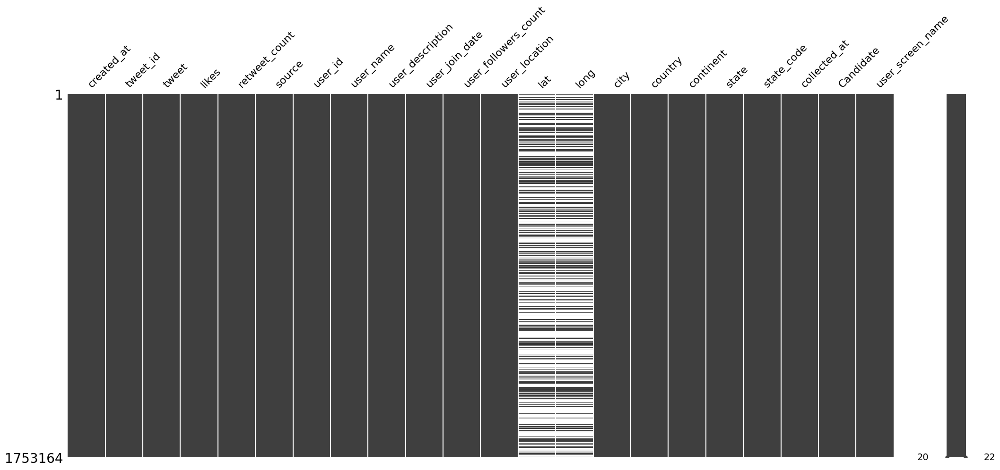

In [138]:
import missingno as msno
msno.matrix(df)

In [139]:
df.columns

Index(['created_at', 'tweet_id', 'tweet', 'likes', 'retweet_count', 'source',
       'user_id', 'user_name', 'user_description', 'user_join_date',
       'user_followers_count', 'user_location', 'lat', 'long', 'city',
       'country', 'continent', 'state', 'state_code', 'collected_at',
       'Candidate', 'user_screen_name'],
      dtype='object')

In [140]:
prof = ProfileReport(df)

#Transformations

## ADD Column

In [141]:
def get_day(timestamp):
    day = timestamp.split(' ')[0]
    return day

In [142]:
df['splited_days'] =df['created_at'].apply(get_day)

In [143]:
df['is_inactive']=np.where(df['user_description'].str.contains('account is temporarily unavailable'), 'In-Active', 'Active')


In [144]:

def find_all_at(text):
    return re.findall(r"@(\w+)",text)

def find_all_hashtag(text):
    return re.findall(r"#(\w+)",text)

df["at"] = df["tweet"].apply(find_all_at)
df["hash_tags"] = df["tweet"].apply(find_all_hashtag)

## changing data types

In [145]:
df[['created_at']].dtypes

created_at    object
dtype: object

In [146]:
df['created_at']= pd.to_datetime(df['created_at'])
df[['created_at']].dtypes

created_at    datetime64[ns]
dtype: object

#Drop Column

In [147]:
df.columns

Index(['created_at', 'tweet_id', 'tweet', 'likes', 'retweet_count', 'source',
       'user_id', 'user_name', 'user_description', 'user_join_date',
       'user_followers_count', 'user_location', 'lat', 'long', 'city',
       'country', 'continent', 'state', 'state_code', 'collected_at',
       'Candidate', 'user_screen_name', 'splited_days', 'is_inactive', 'at',
       'hash_tags'],
      dtype='object')

In [148]:
df.drop(columns=['user_name', 'user_id','user_description', 'user_join_date', 'collected_at'], inplace=True)

##Sentiement based Classification

In [149]:
df2=df[['tweet_id','user_screen_name', 'lat', 'long','Candidate', 'country','state' ,'continent','city',"hash_tags","at", 'likes', 'retweet_count', 'source','user_followers_count', 'tweet','created_at','splited_days']]

In [150]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

### Cleaning tweets

In [151]:
# given a pandas data frame, it will lower all the string in a given source column 
# and save it to target column

#given a list of regex find if it is in a string in the given column and replace it with separator
def remove_regex_from_tweets(df, col, regex_list, seprater=""):
    for x in regex_list:
        df[col] = [itm for itm in df[col].str.replace(x, seprater, regex=True)]
    return df[col] 


arr =['u', 'hi', 'arp', 'pre', 'thi']
stop = set(np.concatenate((stopwords.words('english'), stopwords.words('spanish'), arr)))


def get_tokenized(value):
  token= value.split()
  tokenizen_arr=[]
  for word in token:
      if word not in stop:
        word = lemmatizer.lemmatize(word)
        tokenizen_arr.append(word)
  return tokenizen_arr


def preprocessing(df):
    """
    Perform preprocessing of the tweets

    Args:
        data : list of tweets
    
    Returns: data_list: preprocessed list of tweets
    """
    ## converting it to  data frame for ease
    
    ## rejex to remove unwanted characters
    replace_token =  [r'@']
    regex_to_remove = ['(https?:[//|\\\\]+[\\w\\d:#@%/;$~_?\\+-=\\\\\\.&]*)', '#','\n|\t', '\[.*?\]', '\n', '\w*\d\w*']
    regex_to_remove_punctaion = [r'[^\w\s]', '[%s]']

    ## target_col name 
    target_col = 'clean_tweet'
    # given a pandas data frame, it will lower all the string in a given source column 
# and save it to target column

    ## Convert the tweets to lower case text
    df[target_col] = df['tweet'].str.lower()
    df[target_col] = remove_regex_from_tweets(df, target_col,  replace_token, seprater= "")


    ## Remove all # symbols, Remove all html tags
    df[target_col]= remove_regex_from_tweets(df, target_col, regex_to_remove, seprater=" ")

    ##Remove all punctuations
    df[target_col] = remove_regex_from_tweets(df, target_col, regex_to_remove_punctaion, seprater=" ")
    df['tokens'] = df[target_col].apply(lambda x: get_tokenized(x))    

  
    return df


tweets = preprocessing(df2)
del df2

In [152]:
df.columns

Index(['created_at', 'tweet_id', 'tweet', 'likes', 'retweet_count', 'source',
       'user_followers_count', 'user_location', 'lat', 'long', 'city',
       'country', 'continent', 'state', 'state_code', 'Candidate',
       'user_screen_name', 'splited_days', 'is_inactive', 'at', 'hash_tags'],
      dtype='object')

### classify tweets

In [153]:
sid = SentimentIntensityAnalyzer()

In [154]:
tweets.drop_duplicates(['clean_tweet'], inplace = True, keep= False)

In [155]:
tweets['sentiment'] = tweets['clean_tweet'].apply(lambda x: sid.polarity_scores(x))                                                                                                                           

In [156]:
def assignSentiment(sentiment):
  if sentiment['compound'] >= 0.05:
    return "Positive"
  elif sentiment['compound'] <= -0.05:
    return "Negative"
  else:
    return "Neutral"

In [157]:
tweets['sentiment_overall'] = tweets['sentiment'].apply(lambda x: assignSentiment(x))

In [158]:
tweets.drop(columns=['sentiment'], inplace =True)

# Analysis on tweet candidate


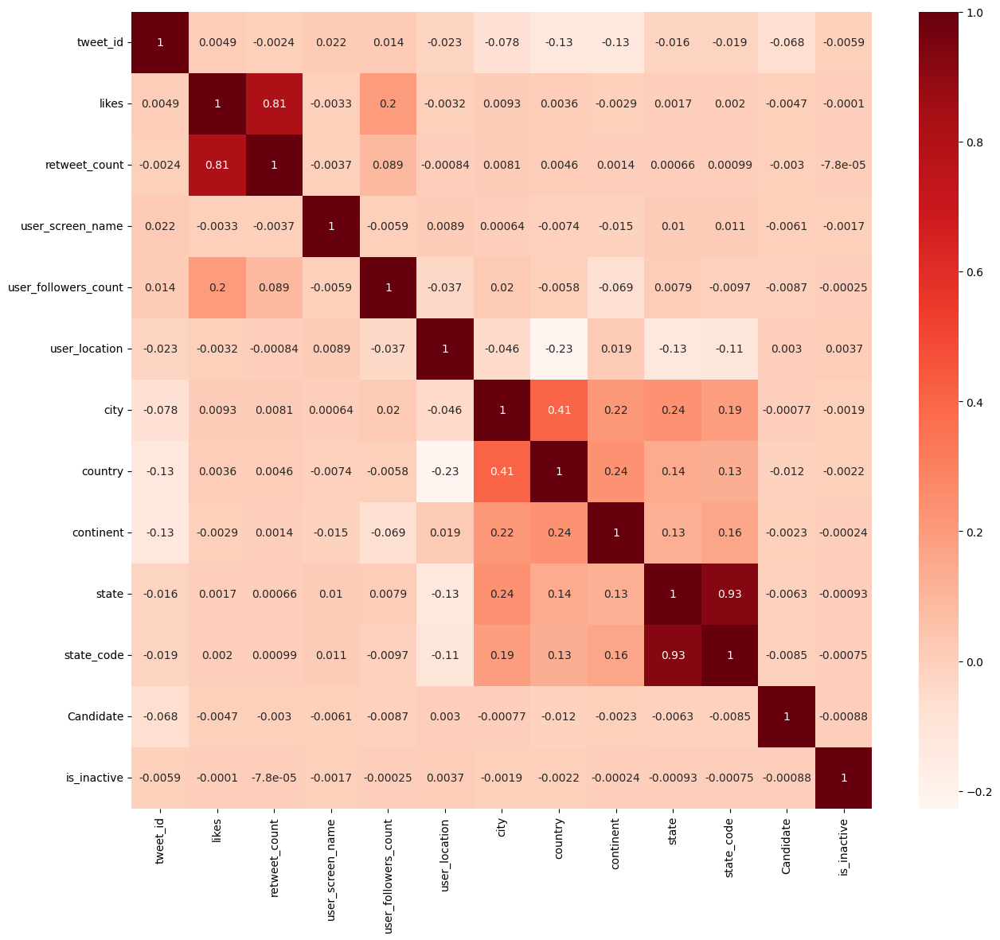

In [ ]:
# create a backup for df and drop the columns that are irrelevant in your opinion
df3=df[[ 'tweet_id','likes', 'retweet_count', 'source', 'user_screen_name', 'user_followers_count', 'user_location', 
       'city', 'country', 'continent', 'state', 'state_code',
      'Candidate', 'is_inactive', 'at','hash_tags']]
cat_col=['user_screen_name', 'user_location' , 'city', 'country', 'continent', 'state', 'state_code', 'Candidate', 'is_inactive']

# convert all categorical attributes to numerical attributes

for x in cat_col:
  df3[x]=df3[x].astype('category')
  df3[x] = df3[x].cat.codes

# compute correlation
cor = df3.corr()

# visualize using heatmap
plt.figure(figsize=(15,13))
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

del df3

In [ ]:
print(df['tweet'][0])

#Elecciones2020 | En #Florida: #JoeBiden dice que #DonaldTrump solo se preocupa por él mismo. El demócrata fue anfitrión de encuentros de electores en #PembrokePines y #Miramar. Clic AQUÍ ⬇️⬇️⬇️
⠀
🌐https://t.co/qhIWpIUXsT
_
#ElSolLatino #yobrilloconelsol https://t.co/6FlCBWf1Mi


In [ ]:

group_by_candiate= df[['tweet_id','Candidate']].groupby('Candidate').count()
group_by_candiate

,tweet_id
Candidate,
BIDEN,779185
TRUMP,973979


In [ ]:
candites = group_by_candiate.index
candites

Index(['BIDEN', 'TRUMP'], dtype='object', name='Candidate')

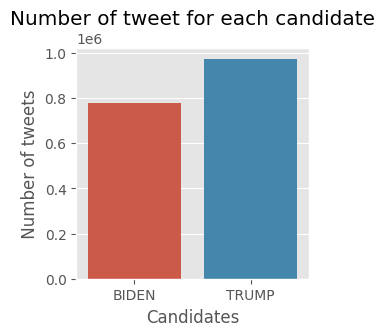

In [ ]:
# create a barplot plotting the average area of properties in each province
plt.figure(figsize=(3,3))
sns.barplot(data=group_by_candiate, x=candites, y='tweet_id')
plt.title('Number of tweet for each candidate')
plt.xlabel("Candidates")
plt.ylabel(" Number of tweets ")
plt.show()

###TimeLine Anaylsis

In [ ]:
## create timeline on dates
timeline = df.resample('D', on='created_at')["Candidate"].value_counts().unstack(1)
timeline.reset_index(inplace=True)
timeline = timeline.melt("created_at", var_name='Candidate',  value_name='vals')
timeline

,created_at,Candidate,vals
0,2020-10-15,BIDEN,15010
1,2020-10-16,BIDEN,17993
2,2020-10-17,BIDEN,11511
3,2020-10-18,BIDEN,10419
4,2020-10-19,BIDEN,10822
5,2020-10-20,BIDEN,11907
6,2020-10-21,BIDEN,13491
7,2020-10-22,BIDEN,16196
8,2020-10-23,BIDEN,46007
9,2020-10-24,BIDEN,13154


[Text(0.5, 1.0, 'Timeline Anyalsis of Tweets for candidates based on Days')]

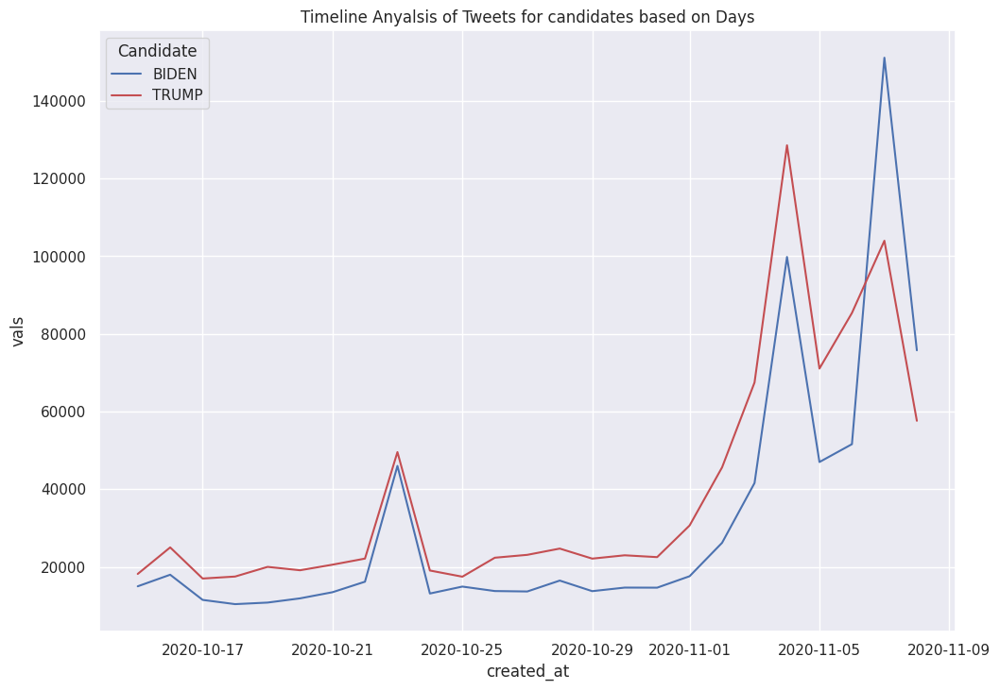

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.lineplot(x="created_at", y="vals", hue="Candidate", data=timeline, palette=["b", "r"]).set(title='Timeline Anyalsis of Tweets for candidates based on Days')

In [ ]:
timeline_month = df.resample('M', on='created_at')["Candidate"].value_counts().unstack(1)
timeline_month.reset_index(inplace=True)
timeline_month = timeline_month.melt("created_at", var_name='Candidate',  value_name='vals')
timeline_month

,created_at,Candidate,vals
0,2020-10-31,BIDEN,268514
1,2020-11-30,BIDEN,510671
2,2020-10-31,TRUMP,383629
3,2020-11-30,TRUMP,590350


[Text(0.5, 1.0, 'Timeline Anyalsis of Tweets for candidates based on Months')]

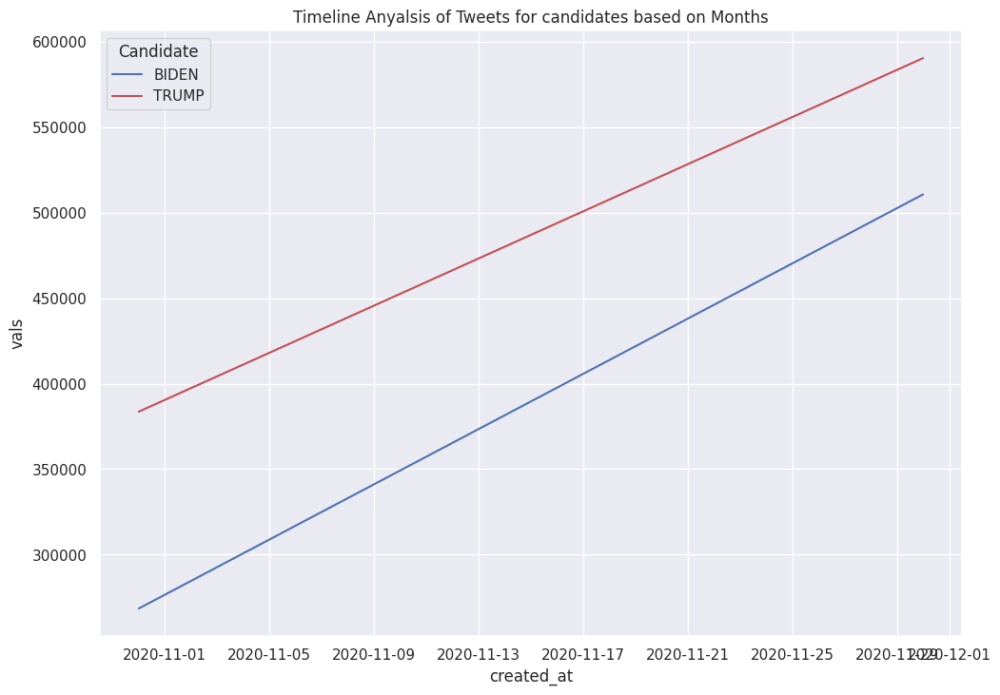

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.lineplot(x="created_at", y="vals", hue="Candidate", data=timeline_month, palette=["b", "r"]).set(title='Timeline Anyalsis of Tweets for candidates based on Months')

### Candiadate anyalsis by Sentiment 

In [ ]:
sentiment_count_df = tweets.groupby(['sentiment_overall', 'Candidate'])['tweet'].count().reset_index()
sentiment_count_df

,sentiment_overall,Candidate,tweet
0,Negative,BIDEN,100250
1,Negative,TRUMP,200659
2,Neutral,BIDEN,217737
3,Neutral,TRUMP,270672
4,Positive,BIDEN,188298
5,Positive,TRUMP,213490


Text(60.44062500000001, 0.5, 'Count of tweets')

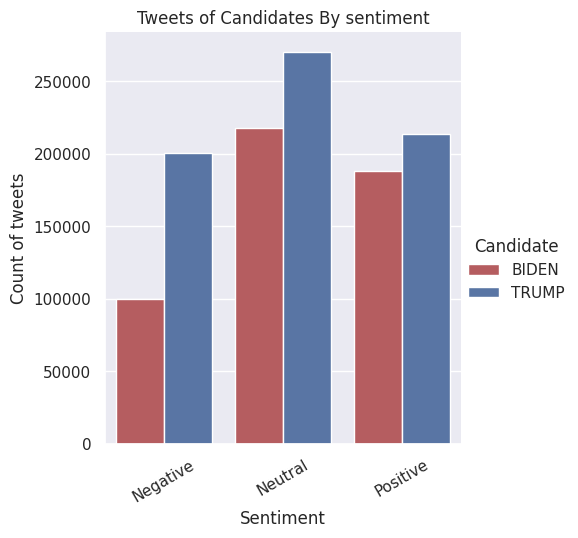

In [ ]:
sns.set(rc={'figure.figsize':(5,5)})
ax=sns.catplot(x="sentiment_overall", y="tweet", hue="Candidate", kind="bar", 
               palette=['r', 'b'], data=sentiment_count_df).set(title='Tweets of Candidates By sentiment')
ax.set_xticklabels(rotation=30)
plt.xlabel("Sentiment")
plt.ylabel("Count of tweets")

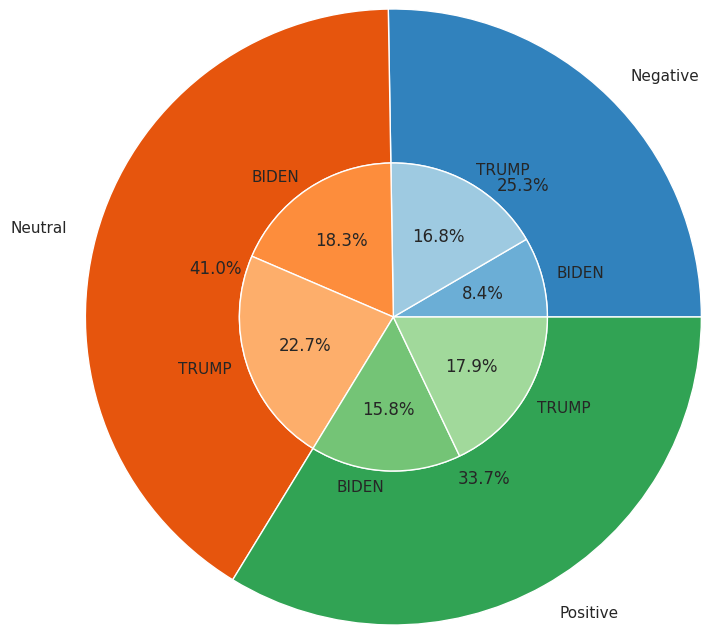

In [ ]:
rt= tweets.groupby([ 'sentiment_overall','Candidate'])['clean_tweet'].count().reset_index()
rt2 = rt.groupby([  'sentiment_overall'])['clean_tweet'].sum().reset_index()
fig, ax = plt.subplots()

size=1
cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(3)*4)
inner_colors = cmap(np.array([1, 2, 5, 6, 9, 10]))

ax.pie(rt.groupby([  'sentiment_overall'], sort=False)['clean_tweet'].sum(), radius=2, colors=outer_colors, 
labels=rt[  'sentiment_overall'].drop_duplicates(), autopct='%1.1f%%',
       wedgeprops=dict(width=size, edgecolor='w'))

ax.pie(rt['clean_tweet'], radius=size, colors=inner_colors, labels=rt['Candidate'], autopct='%1.1f%%',
       wedgeprops=dict(width=size, edgecolor='w'))

plt.show()

In [ ]:
del sentiment_count_df

In [ ]:
time_line=tweets.groupby(['sentiment_overall', 'splited_days', 'Candidate'])['clean_tweet'].count().reset_index()
time_line['candidate_sentiment'] = time_line["sentiment_overall"].astype(str) +"-"+ time_line["Candidate"].astype(str)
time_line['candidate_sentiment'].unique()

array(['Negative-BIDEN', 'Negative-TRUMP', 'Neutral-BIDEN',
       'Neutral-TRUMP', 'Positive-BIDEN', 'Positive-TRUMP'], dtype=object)

In [ ]:
fig = px.line(time_line,  x='splited_days',  y='clean_tweet',  color='candidate_sentiment',
              title="Time Based Analysis of Candidate by Sentiment",
               labels={
                     "day": "Time",
                     "clean_tweet": "Number of Tweets",
                     "candidate_sentiment": "candidate_sentiment"
    })
fig.update_layout(font=dict(family="Courier New, monospace", size=12))

fig.show()

In [ ]:
del time_line

### Source anyalis

In [ ]:
arr=[]
for x in most_common_source:
  arr.append(x[0])
arr

['Twitter Web App',
 'Twitter for iPhone',
 'Twitter for Android',
 'Twitter for iPad',
 'TweetDeck',
 'Instagram']

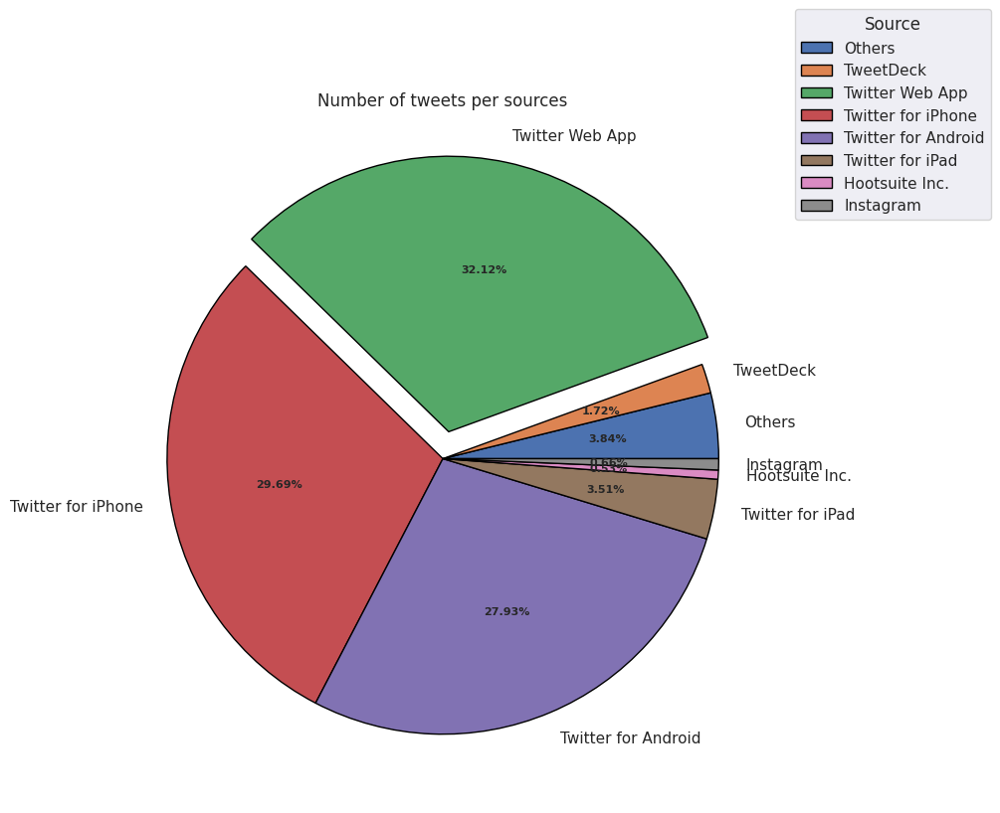

In [ ]:


sr=['Others']
sr_count=[0]

for x in counts:
  if counts[x] >5000:
    sr.append(x)
    sr_count.append(counts[x])
  else:
    sr_count[0]+=counts[x]
  

wp = { 'linewidth' : 1, 'edgecolor' : "black" }
explode = (0.0, 0.0, 0.1,0.0, 0.0, 0.0, 0.0, 0.0)
 
fig, ax= plt.subplots(figsize =(9, 9))
wedges, texts, autotexts = ax.pie(sr_count, labels = sr, autopct='%1.2f%%', wedgeprops = wp, explode= explode)

ax.legend(wedges, sr,
          title ="Source",
          loc ="center left",
          bbox_to_anchor =(1, 0.5, 0.5, 1))
 
plt.setp(autotexts, size = 8, weight ="bold")
ax.set_title("Number of tweets per sources")
plt.show()

In [ ]:
df2 = df[df['source'].isin(arr)]
source = df2[['tweet_id','Candidate', 'source']].groupby(['source', 'Candidate']).count().sort_values(by=["tweet_id"], ascending=False)["tweet_id"].reset_index()
source

,source,Candidate,tweet_id
0,Twitter Web App,TRUMP,322689
1,Twitter for iPhone,TRUMP,275086
2,Twitter for Android,TRUMP,270231
3,Twitter for iPhone,BIDEN,245780
4,Twitter Web App,BIDEN,241581
5,Twitter for Android,BIDEN,219512
6,Twitter for iPad,TRUMP,35382
7,Twitter for iPad,BIDEN,26073
8,TweetDeck,TRUMP,17504
9,TweetDeck,BIDEN,12517


In [ ]:
import textwrap
def wrap_labels_x(ax, width, break_long_words=False):
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        labels.append(textwrap.fill(text, width=width,
                      break_long_words=break_long_words))
    ax.set_xticklabels(labels, rotation=0)

def wrap_labels_y(ax, width, break_long_words=False):
    labels = []
    for label in ax.get_yticklabels():
        text = label.get_text()
        labels.append(textwrap.fill(text, width=width,
                      break_long_words=break_long_words))
    ax.set_yticklabels(labels, rotation=0)

Text(46.159565882240855, 0.5, 'Count of tweets')

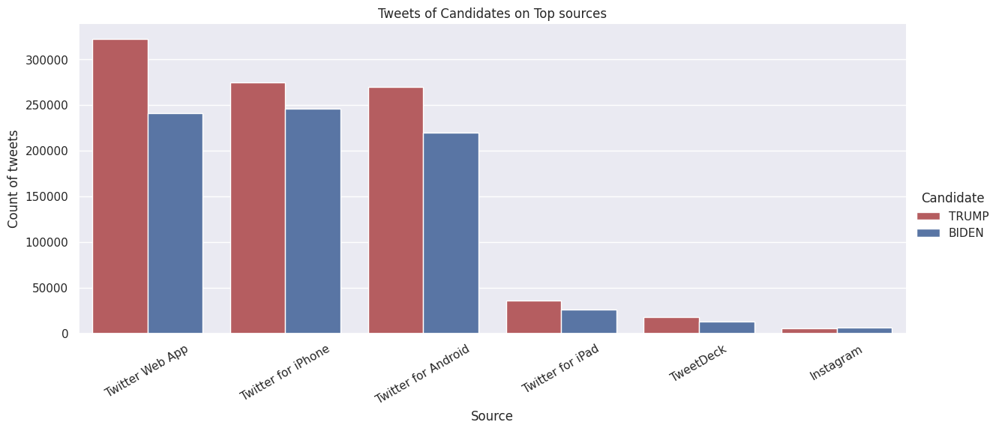

In [ ]:
sns.set(rc={'figure.figsize':(15,10)})
ax=sns.catplot(x="source", y="tweet_id", hue="Candidate", kind="bar", 
               aspect=20.5/8.27 ,palette=['r', 'b'], data=source).set(title='Tweets of Candidates on Top sources')
ax.set_xticklabels(rotation=30)
plt.xlabel("Source")
plt.ylabel("Count of tweets")

sentimennt anylasis by source

In [ ]:
##overall
sentiment_source_df = tweets[tweets['source'].isin(arr)].groupby(['sentiment_overall','source']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
sentiment_source_df

,sentiment_overall,source,clean_tweet
0,Neutral,Twitter for iPhone,153468
1,Neutral,Twitter for Android,150602
2,Neutral,Twitter Web App,139571
3,Positive,Twitter for iPhone,134187
4,Positive,Twitter Web App,128499
5,Positive,Twitter for Android,106623
6,Negative,Twitter Web App,106000
7,Negative,Twitter for iPhone,90731
8,Negative,Twitter for Android,77180
9,Neutral,Twitter for iPad,16597


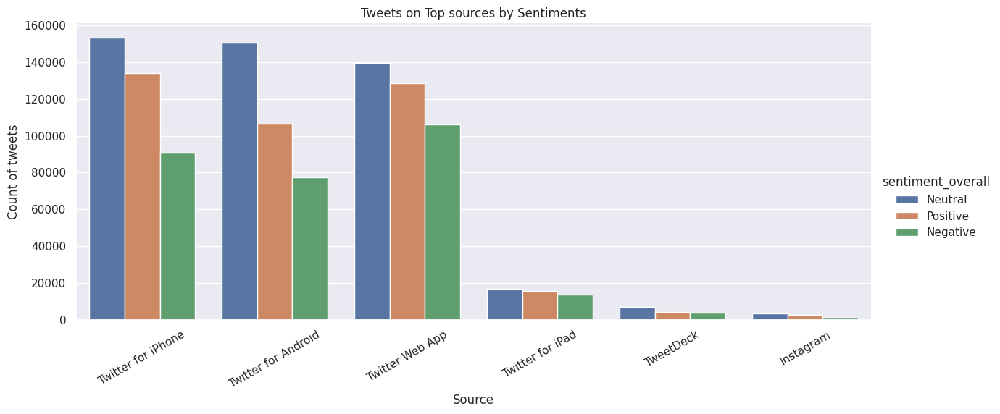

In [ ]:
sns.set(rc={'figure.figsize':(15,10)})
ax=sns.catplot(x="source", y="clean_tweet", hue="sentiment_overall", kind="bar", 
               aspect=20.5/8.27 , data=sentiment_source_df).set(title='Tweets on Top sources by Sentiments')
ax.set_xticklabels(rotation=30)
plt.xlabel("Source")
plt.ylabel("Count of tweets")
del sentiment_source_df

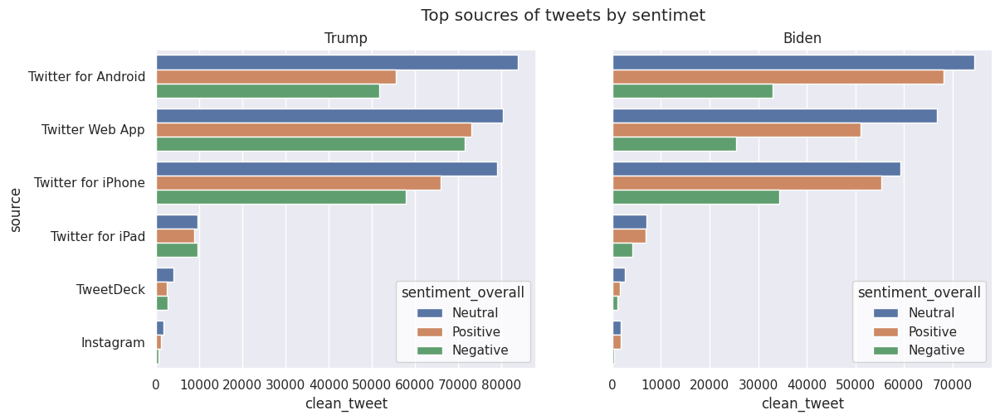

In [ ]:


sentiment_source_df = tweets[tweets['source'].isin(arr)].groupby(['sentiment_overall','Candidate','source']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
sentiment_source_df_trump =sentiment_source_df[(sentiment_source_df['Candidate']=='TRUMP' )]
sentiment_source_df_bed =sentiment_source_df[(sentiment_source_df['Candidate']!='TRUMP' )]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13,5 ))


sns.set_style("whitegrid")
plt.suptitle(' Top soucres of tweets by sentimet')


sns.barplot(y="source", x="clean_tweet", hue="sentiment_overall", data=sentiment_source_df_trump, ax = ax1)
ax1.set_title('Trump')

sns.barplot(y="source", x="clean_tweet", hue="sentiment_overall", data=sentiment_source_df_bed , ax = ax2)
ax2.set_title('Biden')
ax2.get_yaxis().set_visible(False)


fig.show()


# Tweet analysis for in active and active users

In [ ]:
group_by_active= df[['tweet_id','is_inactive']].groupby('is_inactive').count()
group_by_active

,tweet_id
is_inactive,
Active,1753143
In-Active,21


In [ ]:
active = group_by_active.index
active

Index(['Active', 'In-Active'], dtype='object', name='is_inactive')

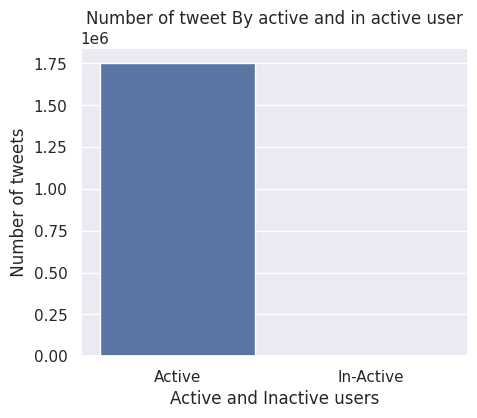

In [ ]:
# create a barplot plotting the active users
sns.set(rc={'figure.figsize':(5, 4)})
sns.barplot(data=group_by_active, x=active, y='tweet_id')
plt.title('Number of tweet By active and in active user')
plt.xlabel("Active and Inactive users")
plt.ylabel(" Number of tweets ")
plt.show()

In [ ]:
inactive_user= df.drop_duplicates(['user_screen_name'])
group_by_active_users= inactive_user[['user_screen_name','is_inactive']].groupby('is_inactive').count()
del inactive_user
group_by_active_users

,user_screen_name
is_inactive,
Active,483203
In-Active,4


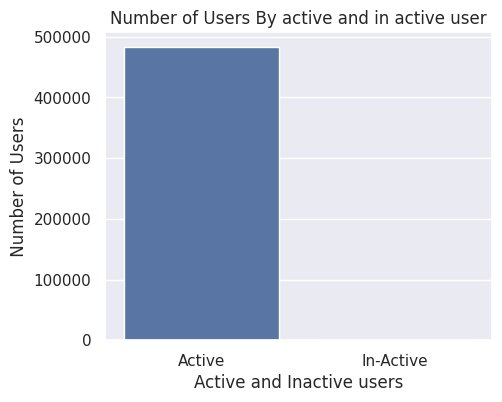

In [ ]:
sns.set(rc={'figure.figsize':(5, 4)})
active = group_by_active_users.index
sns.barplot(data=group_by_active_users, x=active, y='user_screen_name')
plt.title('Number of Users By active and in active user')
plt.xlabel("Active and Inactive users")
plt.ylabel(" Number of Users ")
plt.show()

## number of followers of inactive users, likes and retweets count

In [ ]:
df['is_inactive'] = np.where(df['is_inactive']== 'Active', 0,1)

In [ ]:
inactive=df[df['is_inactive']==1][[ 'tweet_id', 'user_screen_name', 'likes', 'retweet_count', 'user_followers_count']]

In [ ]:
follower= inactive[['user_screen_name','user_followers_count']]
follower.drop_duplicates( ['user_screen_name'],inplace=True)
follower

,user_screen_name,user_followers_count
11862,wasserelch,134.0
47966,NewlandCM,60.0
98657,NaZagamiKills,0.0
554541,DIAKOKING1,0.0
575034,2020Plainsight,59.0


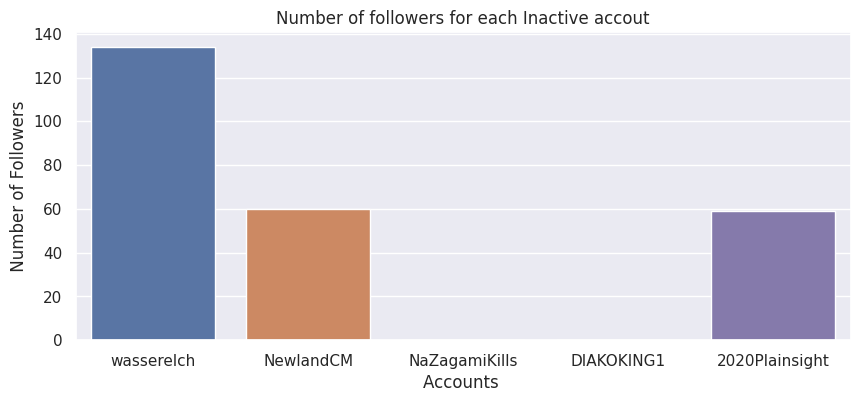

In [ ]:
sns.set(rc={'figure.figsize':(10, 4)})
sns.barplot(data=follower, x='user_screen_name', y='user_followers_count')
plt.title('Number of followers for each Inactive accout')
plt.xlabel("Accounts ")
plt.ylabel(" Number of Followers ")
plt.show()

In [ ]:
likes= inactive[['tweet_id', 'likes', 'retweet_count']]
likes.drop_duplicates( ['tweet_id'],inplace=True)
likes['tweet_id']=likes['tweet_id'].astype('category')
likes['tweet_id'] = likes['tweet_id'].cat.codes
likes

,tweet_id,likes,retweet_count
11862,0,0.0,0.0
47966,1,0.0,0.0
47982,2,0.0,0.0
47991,3,0.0,0.0
48002,4,1.0,0.0
48013,5,0.0,0.0
48021,6,1.0,1.0
48234,7,0.0,1.0
63584,8,2.0,4.0
69275,9,1.0,0.0


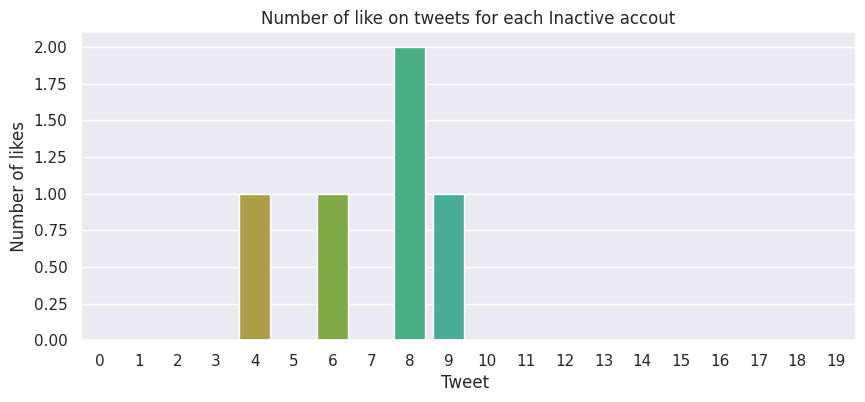

In [ ]:
sns.set(rc={'figure.figsize':(10, 4)})
sns.barplot(data=likes, x='tweet_id', y='likes')
plt.title('Number of like on tweets for each Inactive accout')
plt.xlabel("Tweet ")
plt.ylabel(" Number of likes ")
plt.show()

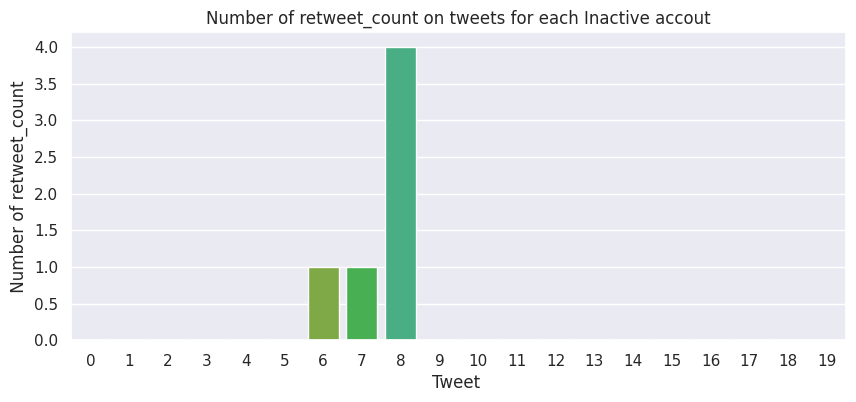

In [ ]:
sns.set(rc={'figure.figsize':(10, 4)})
sns.barplot(data=likes, x='tweet_id', y='retweet_count')
plt.title('Number of retweet_count on tweets for each Inactive accout')
plt.xlabel("Tweet ")
plt.ylabel(" Number of retweet_count ")
plt.show()

In [ ]:
del likes
del follower
del inactive

## Anylasis by words, Hashtags and '@'

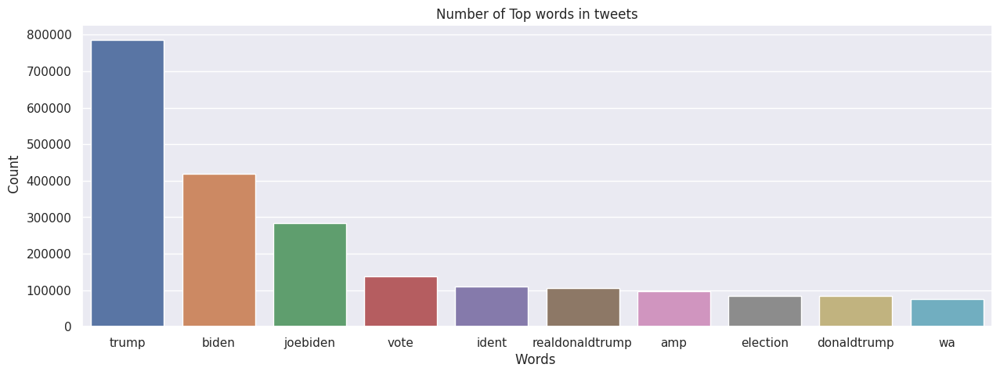

Text(47.245056859756076, 0.5, 'Count of Words in  tweets')

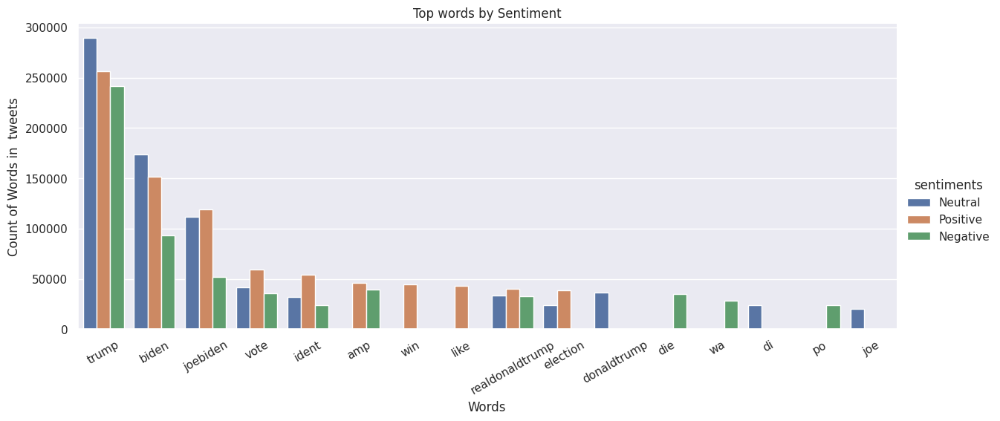

In [ ]:
#tweets['tokens']= tweets['clean_tweet'].str.split().values.tolist()
all_token=[]
all_token.extend(word for i in tweets['tokens'] for word in i)

all_tkn_cnt = Counter(all_token)
all_most_com = all_tkn_cnt.most_common()


all_x, all_y = [], []
for word, count in all_most_com[:10]:
    if word not in stop:
        all_x.append(word)
        all_y.append(count)

## all words
sns.set(rc={'figure.figsize':(15, 5)})
sns.barplot(x = all_x, y = all_y)
plt.title('Number of Top words in tweets')
plt.xlabel("Words ")
plt.ylabel(" Count")
plt.show()

## top words  by sentiment

toc_x, toc_y, em_o = [], [], []
toc_sent=[]
for x in tweets['sentiment_overall'].unique():
  toc_sent=[]
  toc= tweets[tweets['sentiment_overall']==x]['tokens']
  toc_sent.extend(word for i in toc for word in i)
  toc_tkn_cnt = Counter(toc_sent)
  toc_most_com = toc_tkn_cnt.most_common()
  for word, count in toc_most_com[:10]:
    if word not in stop:
        toc_x.append(word)
        toc_y.append(count)
        em_o.append(x)

pd1 =pd.DataFrame()
pd1['words'] = toc_x
pd1['counts'] = toc_y
pd1['sentiments']=em_o
pd1.sort_values(by=['counts'],  ascending=False, inplace=True)


sns.set(rc={'figure.figsize':(15,10)})
ax=sns.catplot(x="words", y="counts", hue="sentiments", kind="bar", 
               aspect=20.5/8.27 , data=pd1).set(title='Top words by Sentiment')
ax.set_xticklabels(rotation=30)
plt.xlabel("Words")
plt.ylabel("Count of Words in  tweets")

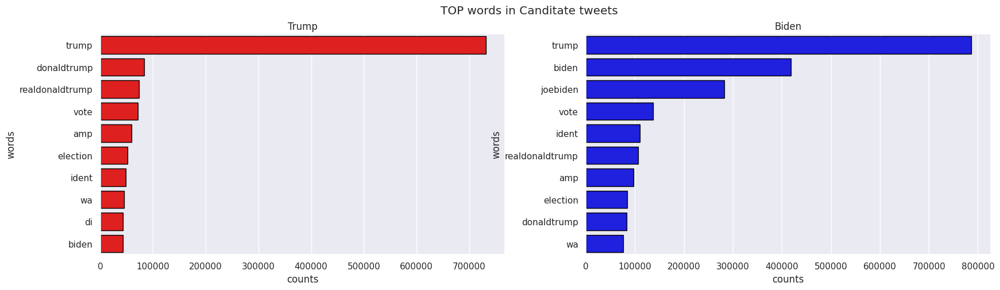

In [ ]:
tokenByCand,tokenByCandTk, tokenByCand_X, tokenByCand_y=[],[],[],[]
cand=[]
for x in tweets['Candidate'].unique():
  tokenByCand=[]
  tokenByCand= tweets[tweets['Candidate']==x]['tokens']
  tokenByCandTk.extend(word for i in tokenByCand for word in i)
  bed_tkn_cnt = Counter(tokenByCandTk)
  bed_most_com = bed_tkn_cnt.most_common()
  for word, count in bed_most_com[:10]:
    if word not in stop:
        tokenByCand_X.append(word)
        tokenByCand_y.append(count)
        cand.append(x)

pd2 = pd.DataFrame()

pd2['words'] = tokenByCand_X
pd2['counts'] = tokenByCand_y
pd2['Candidate']=cand
pd2.sort_values(by=['counts'],  ascending=False, inplace=True)


trm = pd2[pd2['Candidate']=='TRUMP']
bnd = pd2[pd2['Candidate']!='TRUMP']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5 ))
sns.set_style("whitegrid")
plt.suptitle('TOP words in Canditate tweets ')


sns.set_style("whitegrid")
plt.suptitle('TOP words in Canditate tweets ')


sns.barplot(x = trm['counts'], y = trm['words'], edgecolor = 'black', color = 'red', ax = ax1)
ax1.set_title('Trump')

sns.barplot(x = bnd['counts'], y = bnd['words'],   edgecolor = 'black', color = 'blue', ax = ax2)
ax2.set_title('Biden')


fig.show()

del cand
del pd2
del trm 
del bnd
del tokenByCand
del tokenByCandTk
del tokenByCand_X
del tokenByCand_y




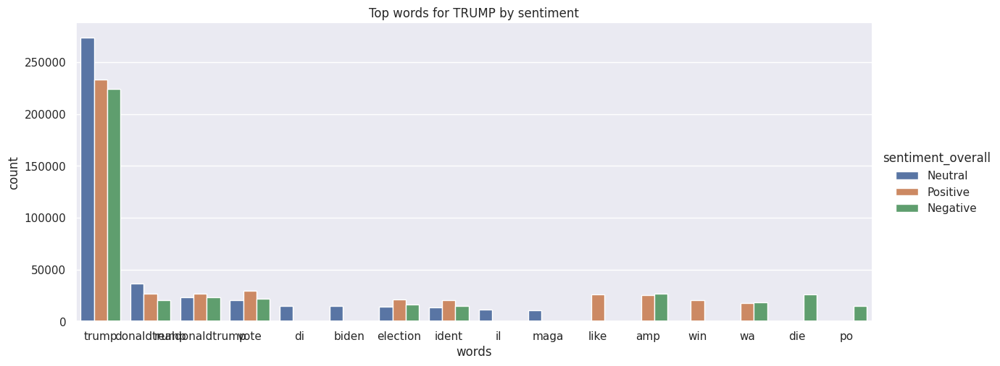

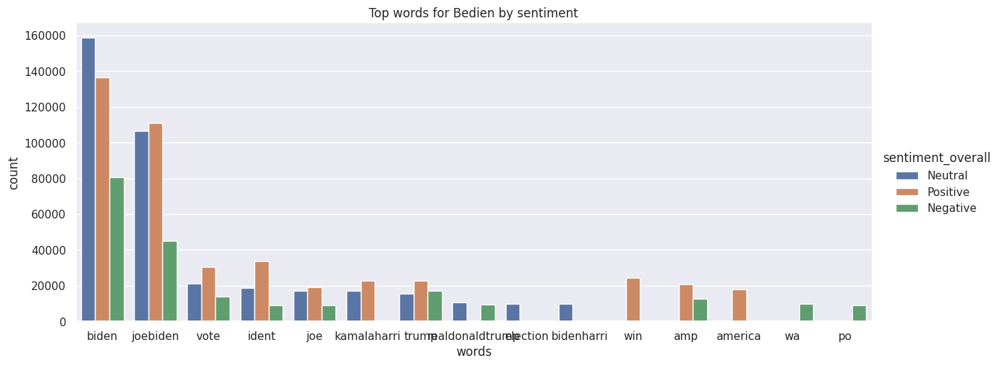

In [ ]:
tokenByCandSen,tokenByCandTkSen, tokenByCandSen_X, tokenByCandSen_y=[],[],[],[]
cand=[]
sent=[]
for x in tweets['Candidate'].unique():
  for y in tweets['sentiment_overall'].unique():
    tokenByCandTkSen=[]
    tokenByCandSen= tweets[(tweets['Candidate']==x) & (tweets['sentiment_overall']==y) ]['tokens']
    tokenByCandTkSen.extend(word for i in tokenByCandSen for word in i)
    bed_tkn_cnt = Counter(tokenByCandTkSen)
    bed_most_com = bed_tkn_cnt.most_common()
    for word, count in bed_most_com[:10]:
      if word not in stop:
        tokenByCandSen_X.append(word)
        tokenByCandSen_y.append(count)
        cand.append(x)
        sent.append(y)

pd1= pd.DataFrame(list(zip(tokenByCandSen_X, tokenByCandSen_y, cand, sent)),
               columns =['words', 'count','Candidate','sentiment_overall'])


sns.set(rc={'figure.figsize':(15, 10)})
plot = sns.catplot(data=pd1[pd1['Candidate']=='TRUMP'], x="words",  y="count",hue="sentiment_overall", kind='bar', aspect=20.5/8.27 ).set(title="Top words for TRUMP by sentiment")
fig.show()


sns.set(rc={'figure.figsize':(15, 10)})
plot = sns.catplot(data=pd1[pd1['Candidate']!='TRUMP'], x="words",  y="count",hue="sentiment_overall", kind='bar', aspect=20.5/8.27 ).set(title="Top words for Bedien by sentiment")
fig.show()

del cand
del pd1
del tokenByCandSen
del tokenByCandTkSen
del tokenByCandSen_X
del tokenByCandSen_y

# Hashtags

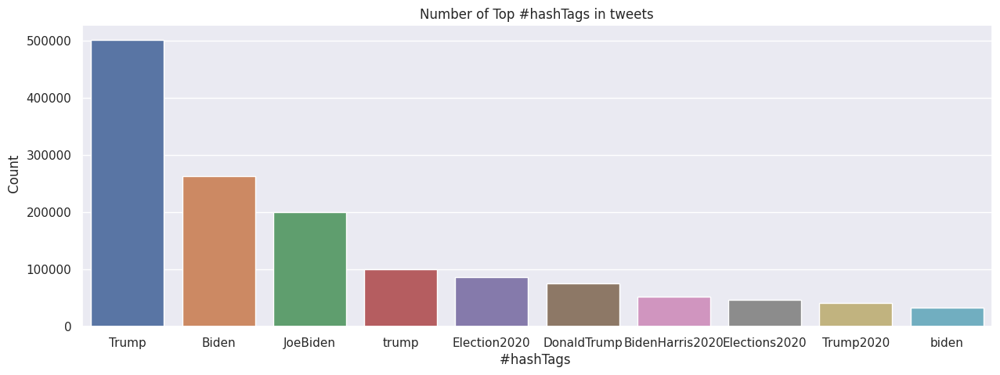

Text(47.2325762195122, 0.5, 'Count of  #hashtags in  tweets')

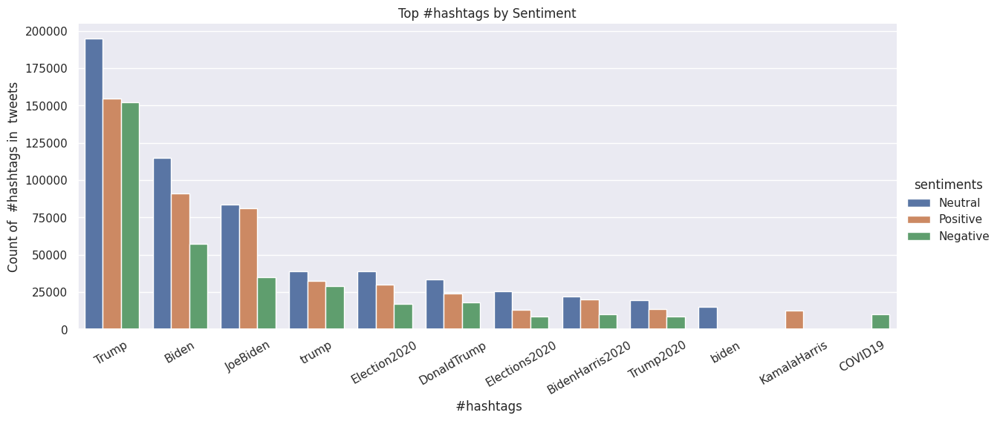

In [ ]:
all_token=[]
all_token.extend(word for i in tweets['hash_tags'] for word in i)

all_tkn_cnt = Counter(all_token)
all_most_com = all_tkn_cnt.most_common(10)


all_x, all_y = [], []
for word, count in all_most_com:
        all_x.append(word)
        all_y.append(count)

## all words
sns.set(rc={'figure.figsize':(15, 5)})
sns.barplot(x = all_x, y = all_y)
plt.title('Number of Top #hashTags in tweets')
plt.xlabel("#hashTags ")
plt.ylabel(" Count")
plt.show()

## top words  by sentiment

toc_x, toc_y, em_o = [], [], []
toc_sent=[]
for x in tweets['sentiment_overall'].unique():
  toc_sent=[]
  toc= tweets[tweets['sentiment_overall']==x]['hash_tags']
  toc_sent.extend(word for i in toc for word in i)
  toc_tkn_cnt = Counter(toc_sent)
  toc_most_com = toc_tkn_cnt.most_common(10)
  for word, count in toc_most_com:
        toc_x.append(word)
        toc_y.append(count)
        em_o.append(x)

pd1 =pd.DataFrame()
pd1['words'] = toc_x
pd1['counts'] = toc_y
pd1['sentiments']=em_o
pd1.sort_values(by=['counts'],  ascending=False, inplace=True)


sns.set(rc={'figure.figsize':(15,10)})
ax=sns.catplot(x="words", y="counts", hue="sentiments", kind="bar", 
               aspect=20.5/8.27 , data=pd1).set(title='Top #hashtags by Sentiment')
ax.set_xticklabels(rotation=30)
plt.xlabel(" #hashtags")
plt.ylabel("Count of  #hashtags in  tweets")

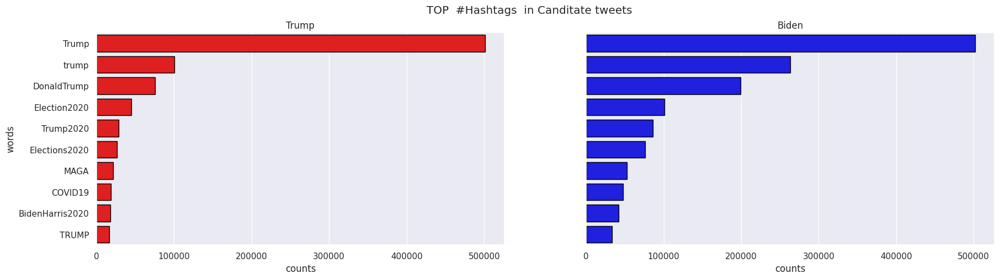

In [ ]:
tokenByCand,tokenByCandTk, tokenByCand_X, tokenByCand_y=[],[],[],[]
cand=[]
for x in tweets['Candidate'].unique():
  tokenByCand=[]
  tokenByCand= tweets[tweets['Candidate']==x]['hash_tags']
  tokenByCandTk.extend(word for i in tokenByCand for word in i)
  bed_tkn_cnt = Counter(tokenByCandTk)
  bed_most_com = bed_tkn_cnt.most_common(10)
  for word, count in bed_most_com:
        tokenByCand_X.append(word)
        tokenByCand_y.append(count)
        cand.append(x)

pd2 = pd.DataFrame()

pd2['words'] = tokenByCand_X
pd2['counts'] = tokenByCand_y
pd2['Candidate']=cand
pd2.sort_values(by=['counts'],  ascending=False, inplace=True)


trm = pd2[pd2['Candidate']=='TRUMP']
bnd = pd2[pd2['Candidate']!='TRUMP']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(21,5 ))


sns.set_style("whitegrid")
plt.suptitle('TOP  #Hashtags  in Canditate tweets ')


sns.barplot(x = trm['counts'], y = trm['words'], edgecolor = 'black', color = 'red', ax = ax1)
ax1.set_title('Trump')

sns.barplot(x = bnd['counts'], y = bnd['words'],   edgecolor = 'black', color = 'blue', ax = ax2)
ax2.set_title('Biden')
ax2.get_yaxis().set_visible(False)


fig.show()

del cand
del pd2
del trm 
del bnd
del tokenByCand
del tokenByCandTk
del tokenByCand_X
del tokenByCand_y




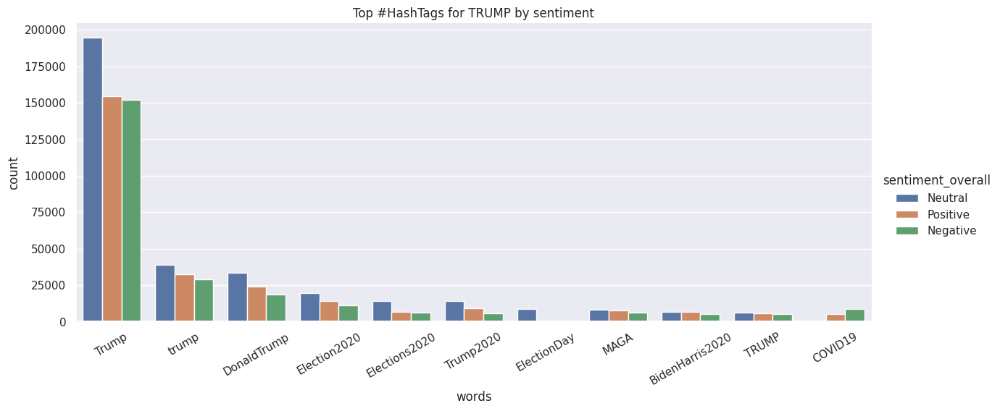

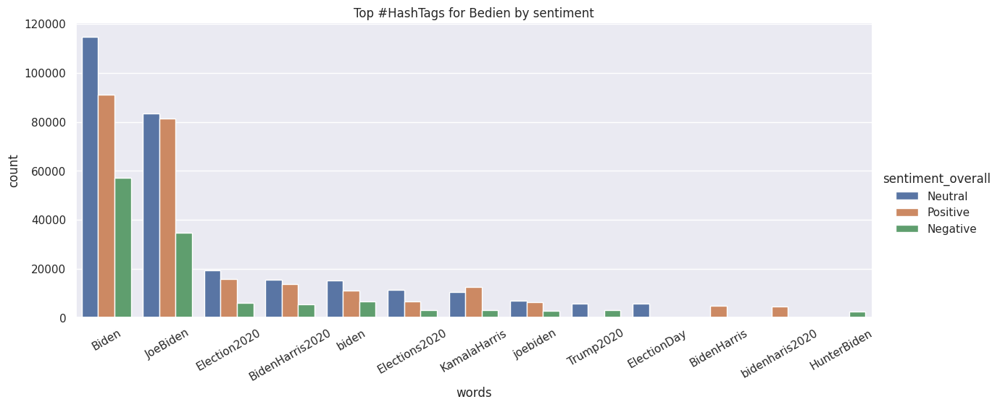

In [ ]:
## HASTAGs

tokenByCandSen,tokenByCandTkSen, tokenByCandSen_X, tokenByCandSen_y=[],[],[],[]
cand=[]
sent=[]
for x in tweets['Candidate'].unique():
  for y in tweets['sentiment_overall'].unique():
    tokenByCandTkSen=[]
    tokenByCandSen= tweets[(tweets['Candidate']==x) & (tweets['sentiment_overall']==y) ]['hash_tags']
    tokenByCandTkSen.extend(word for i in tokenByCandSen for word in i)
    bed_tkn_cnt = Counter(tokenByCandTkSen)
    bed_most_com = bed_tkn_cnt.most_common(10)
    for word, count in bed_most_com:
        tokenByCandSen_X.append(word)
        tokenByCandSen_y.append(count)
        cand.append(x)
        sent.append(y)

pd1= pd.DataFrame(list(zip(tokenByCandSen_X, tokenByCandSen_y, cand, sent)),
               columns =['words', 'count','Candidate','sentiment_overall'])


sns.set(rc={'figure.figsize':(15, 10)})
plot = sns.catplot(data=pd1[pd1['Candidate']=='TRUMP'], x="words",  y="count",hue="sentiment_overall", kind='bar', aspect=20.5/8.27 ).set(title="Top #HashTags for TRUMP by sentiment")
plot.set_xticklabels( rotation=30)
fig.show()


sns.set(rc={'figure.figsize':(15, 10)})
plot = sns.catplot(data=pd1[pd1['Candidate']!='TRUMP'], x="words",  y="count",hue="sentiment_overall", kind='bar', aspect=20.5/8.27 ).set(title="Top #HashTags for Bedien by sentiment")
plot.set_xticklabels( rotation=30)
fig.show()

del cand
del pd1
del tokenByCandSen
del tokenByCandTkSen
del tokenByCandSen_X
del tokenByCandSen_y

##@

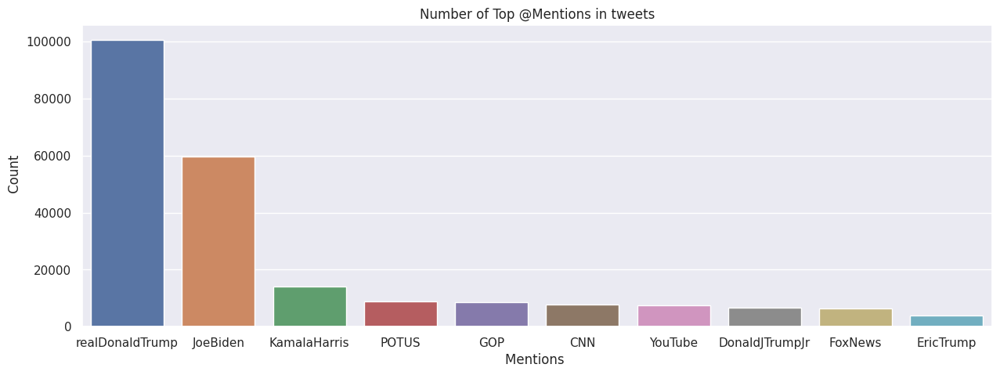

Text(46.284047560975594, 0.5, 'Count of  @Mentions in  tweets')

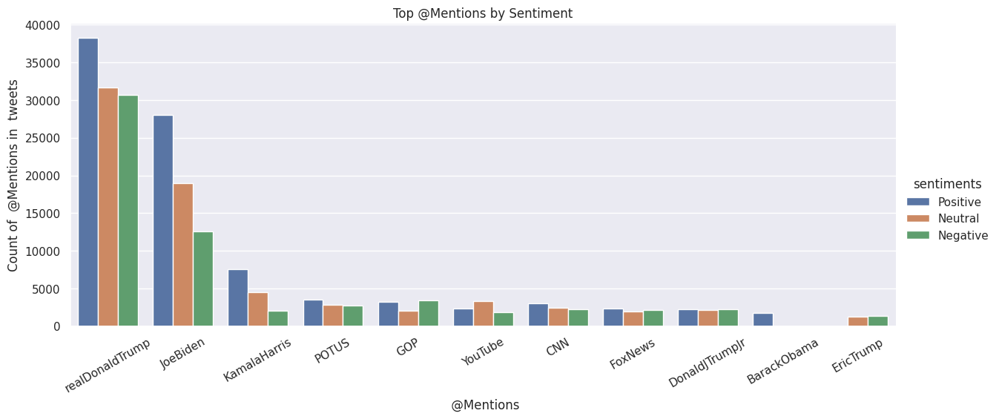

In [ ]:
all_token=[]
all_token.extend(word for i in tweets["at"] for word in i)

all_tkn_cnt = Counter(all_token)
all_most_com = all_tkn_cnt.most_common(10)


all_x, all_y = [], []
for word, count in all_most_com:
        all_x.append(word)
        all_y.append(count)

## all words
sns.set(rc={'figure.figsize':(15, 5)})
sns.barplot(x = all_x, y = all_y)
plt.title('Number of Top @Mentions in tweets')
plt.xlabel("Mentions ")
plt.ylabel(" Count")
plt.show()

## top words  by sentiment

toc_x, toc_y, em_o = [], [], []
toc_sent=[]
for x in tweets['sentiment_overall'].unique():
  toc_sent=[]
  toc= tweets[tweets['sentiment_overall']==x]["at"]
  toc_sent.extend(word for i in toc for word in i)
  toc_tkn_cnt = Counter(toc_sent)
  toc_most_com = toc_tkn_cnt.most_common(10)
  for word, count in toc_most_com:
        toc_x.append(word)
        toc_y.append(count)
        em_o.append(x)

pd1 =pd.DataFrame()
pd1['words'] = toc_x
pd1['counts'] = toc_y
pd1['sentiments']=em_o
pd1.sort_values(by=['counts'],  ascending=False, inplace=True)


sns.set(rc={'figure.figsize':(15,10)})
ax=sns.catplot(x="words", y="counts", hue="sentiments", kind="bar", 
               aspect=20.5/8.27 , data=pd1).set(title='Top @Mentions by Sentiment')
ax.set_xticklabels(rotation=30)
plt.xlabel(" @Mentions")
plt.ylabel("Count of  @Mentions in  tweets")

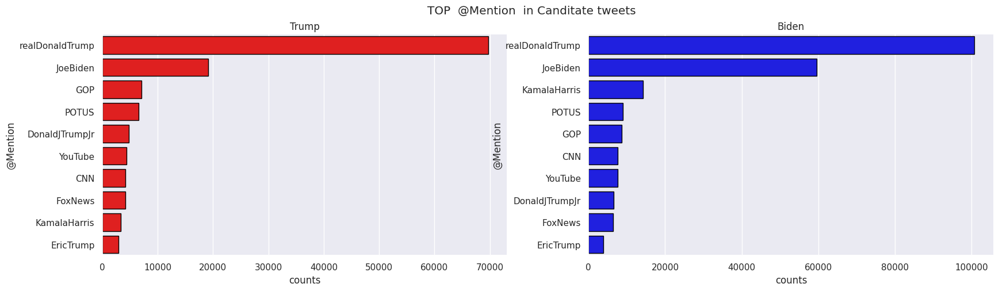

In [ ]:
tokenByCand,tokenByCandTk, tokenByCand_X, tokenByCand_y=[],[],[],[]
cand=[]
for x in tweets['Candidate'].unique():
  tokenByCand=[]
  tokenByCand= tweets[tweets['Candidate']==x]['at']
  tokenByCandTk.extend(word for i in tokenByCand for word in i)
  bed_tkn_cnt = Counter(tokenByCandTk)
  bed_most_com = bed_tkn_cnt.most_common(10)
  for word, count in bed_most_com:
        tokenByCand_X.append(word)
        tokenByCand_y.append(count)
        cand.append(x)

pd2 = pd.DataFrame()

pd2['@Mention'] = tokenByCand_X
pd2['counts'] = tokenByCand_y
pd2['Candidate']=cand
pd2.sort_values(by=['counts'],  ascending=False, inplace=True)


trm = pd2[pd2['Candidate']=='TRUMP']
bnd = pd2[pd2['Candidate']!='TRUMP']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5 ))


sns.set_style("whitegrid")
plt.suptitle('TOP  @Mention  in Canditate tweets ')


sns.barplot(x = trm['counts'], y = trm['@Mention'], edgecolor = 'black', color = 'red', ax = ax1)
ax1.set_title('Trump')

sns.barplot(x = bnd['counts'], y = bnd['@Mention'],   edgecolor = 'black', color = 'blue', ax = ax2)
ax2.set_title('Biden')


fig.show()

del cand
del pd2
del trm 
del bnd
del tokenByCand
del tokenByCandTk
del tokenByCand_X
del tokenByCand_y




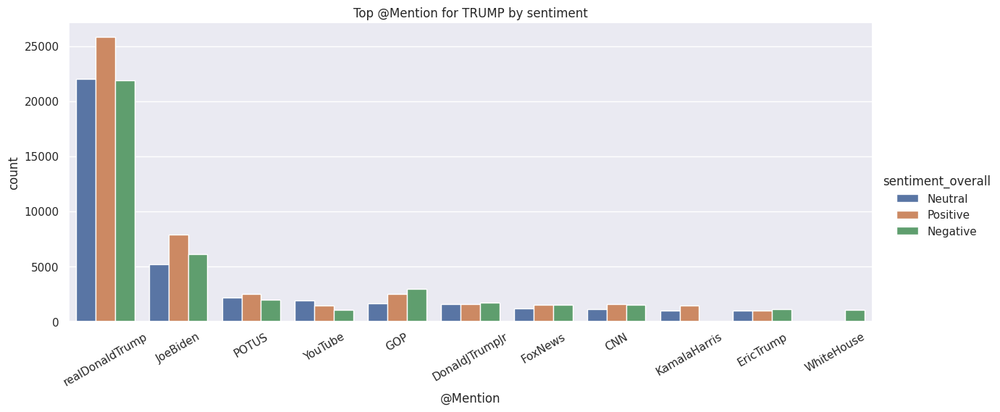

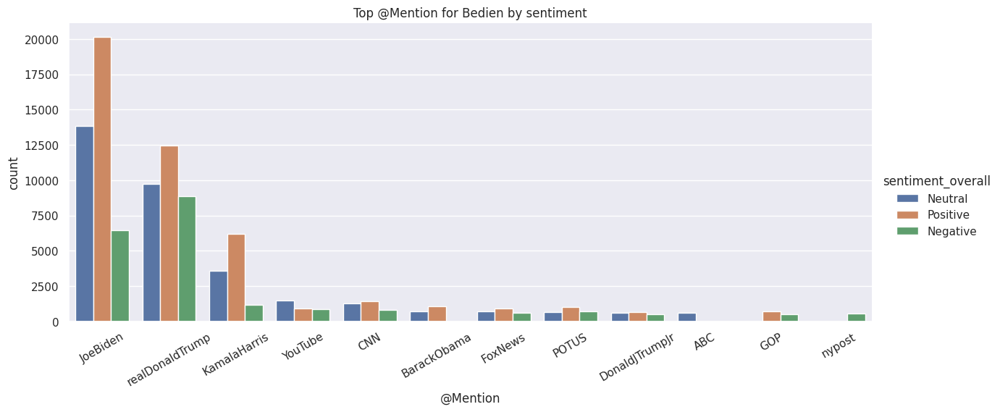

In [ ]:
## @

tokenByCandSen,tokenByCandTkSen, tokenByCandSen_X, tokenByCandSen_y=[],[],[],[]
cand=[]
sent=[]
for x in tweets['Candidate'].unique():
  for y in tweets['sentiment_overall'].unique():
    tokenByCandTkSen=[]
    tokenByCandSen= tweets[(tweets['Candidate']==x) & (tweets['sentiment_overall']==y) ]['at']
    tokenByCandTkSen.extend(word for i in tokenByCandSen for word in i)
    bed_tkn_cnt = Counter(tokenByCandTkSen)
    bed_most_com = bed_tkn_cnt.most_common(10)
    for word, count in bed_most_com:
        tokenByCandSen_X.append(word)
        tokenByCandSen_y.append(count)
        cand.append(x)
        sent.append(y)

pd1= pd.DataFrame(list(zip(tokenByCandSen_X, tokenByCandSen_y, cand, sent)),
               columns =['@Mention', 'count','Candidate','sentiment_overall'])


sns.set(rc={'figure.figsize':(15, 10)})
plot = sns.catplot(data=pd1[pd1['Candidate']=='TRUMP'], x="@Mention",  y="count",hue="sentiment_overall", kind='bar', aspect=20.5/8.27 ).set(title="Top @Mention for TRUMP by sentiment")
plot.set_xticklabels( rotation=30)
fig.show()


sns.set(rc={'figure.figsize':(15, 10)})
plot = sns.catplot(data=pd1[pd1['Candidate']!='TRUMP'], x="@Mention",  y="count",hue="sentiment_overall", kind='bar', aspect=20.5/8.27 ).set(title="Top @Mention for Bedien by sentiment")
plot.set_xticklabels( rotation=30)
fig.show()

del cand
del pd1
del tokenByCandSen
del tokenByCandTkSen
del tokenByCandSen_X
del tokenByCandSen_y

###Word cloud

In [ ]:
def show_wordcloud(data, title = None, color = 'white'):
    wordcloud = WordCloud(background_color=color,
                         stopwords=stop,
                         max_words=10000,
                         scale=3,
                         width = 4000, 
                         height = 2000,
                         collocations=False,
                         random_state=1)
    
    wordcloud = wordcloud.generate(str(data))
    
    plt.figure(1, figsize=(16, 8))
    plt.title(title, size = 15)
    plt.axis('off')
    plt.imshow(wordcloud)
    plt.show()
    return wordcloud

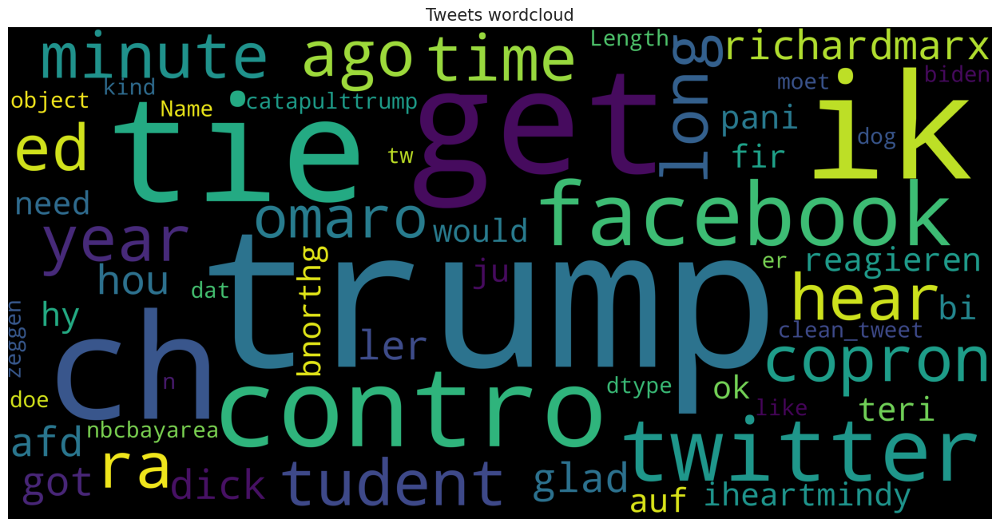

In [ ]:
show_wordcloud(tweets['clean_tweet'].dropna(), title = 'Tweets wordcloud', color = 'black')

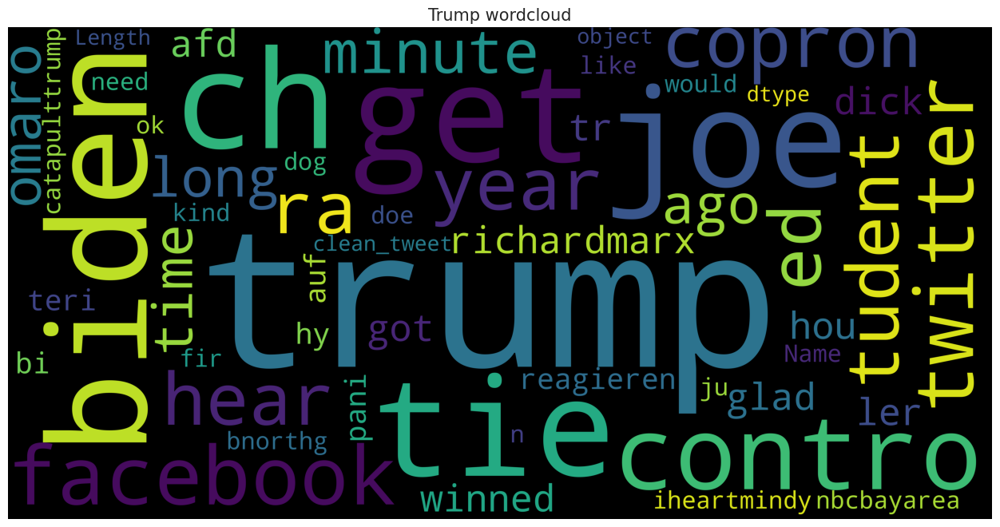

In [ ]:
wordcloud_trmp=show_wordcloud(tweets[tweets['Candidate']=='TRUMP']['clean_tweet'].dropna(), title = 'Trump wordcloud', color = 'black')

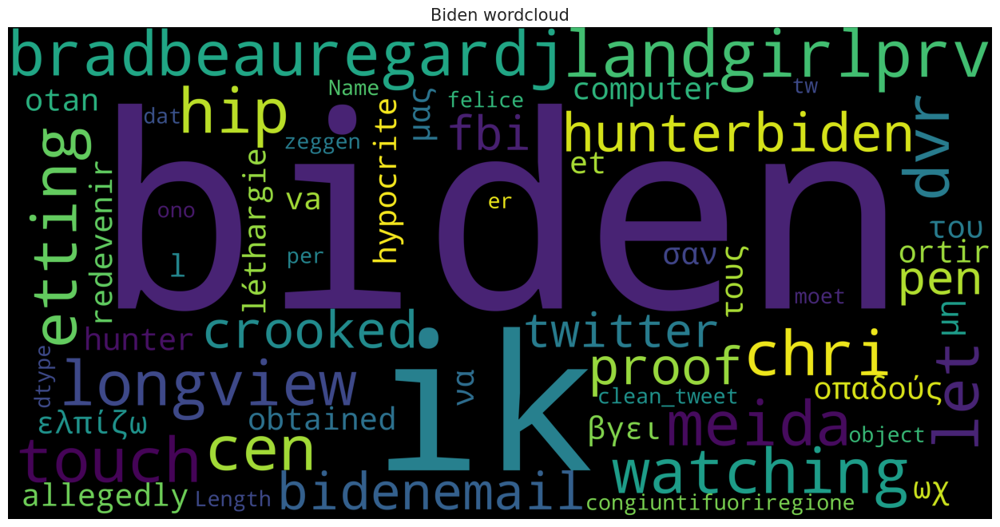

In [ ]:
wordcloud_bedn=show_wordcloud(tweets[tweets['Candidate']!='TRUMP']['clean_tweet'].dropna(), title = 'Biden wordcloud', color = 'black')

# Likes and retweets

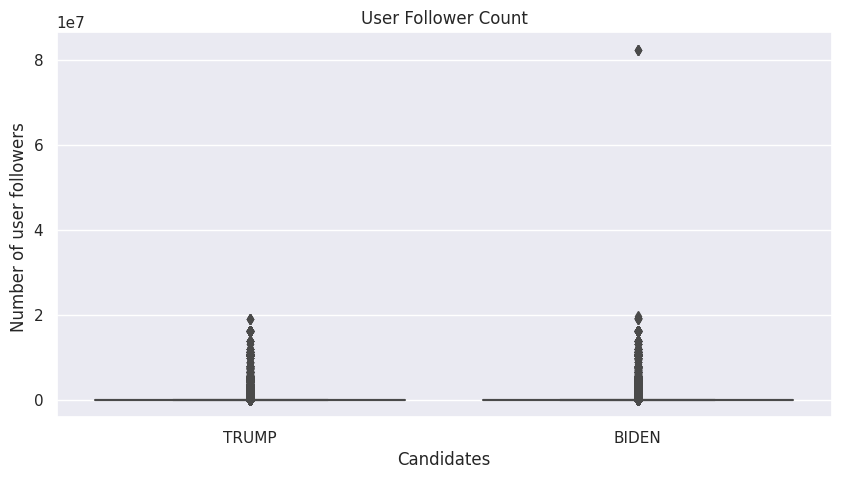

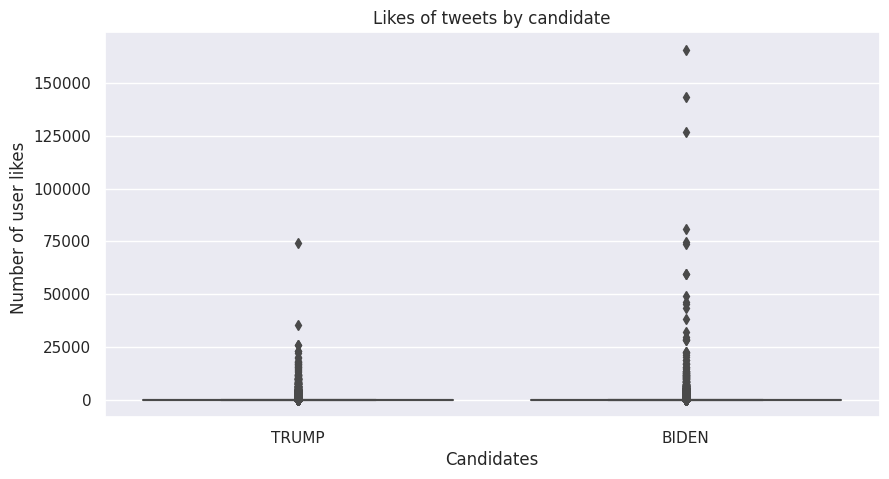

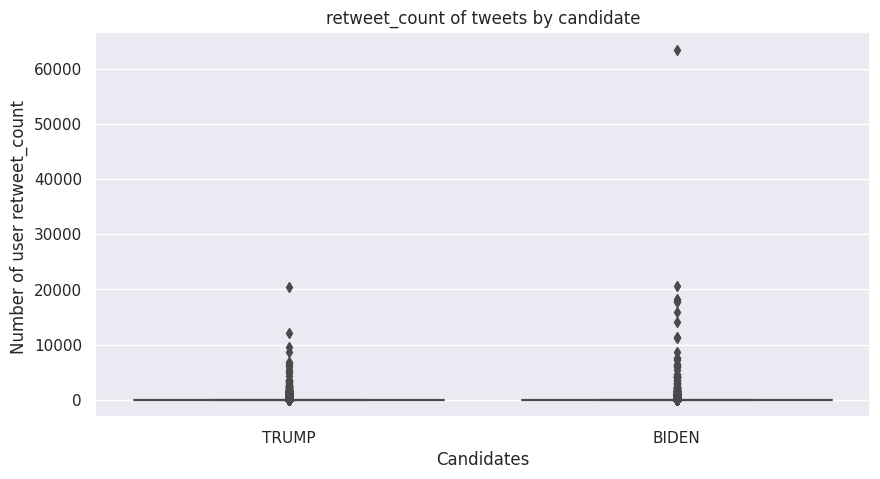

In [ ]:

counts_of_followes=df[[ 'user_screen_name', 'user_followers_count', 'Candidate']]
fig = plt.figure(figsize = (10, 5))
sns.set(style="darkgrid")
sns.boxplot(x = 'Candidate', y = 'user_followers_count', data = counts_of_followes, palette="Blues")
plt.legend
plt.title('User Follower Count')
plt.xlabel("Candidates")
plt.ylabel("Number of user followers ")
plt.show()


counts_of_likes_and_retweet=df[['tweet', 'likes', 'retweet_count','Candidate']]
kl = counts_of_likes_and_retweet.groupby(['tweet', 'Candidate']).sum().reset_index()


fig = plt.figure(figsize = (10, 5))
sns.set(style="darkgrid")
sns.boxplot(x = 'Candidate', y = 'likes', data = kl, palette="Blues")
plt.legend
plt.title('Likes of tweets by candidate')
plt.xlabel("Candidates")
plt.ylabel("Number of user likes ")
plt.show()

fig = plt.figure(figsize = (10, 5))
sns.set(style="darkgrid")
sns.boxplot(x = 'Candidate', y = 'retweet_count', data = kl, palette="Blues")
plt.legend
plt.title('retweet_count of tweets by candidate')
plt.xlabel("Candidates")
plt.ylabel("Number of user retweet_count ")
plt.show()


The scattor plots shows that there are some outliers so we are removing them for evelutions

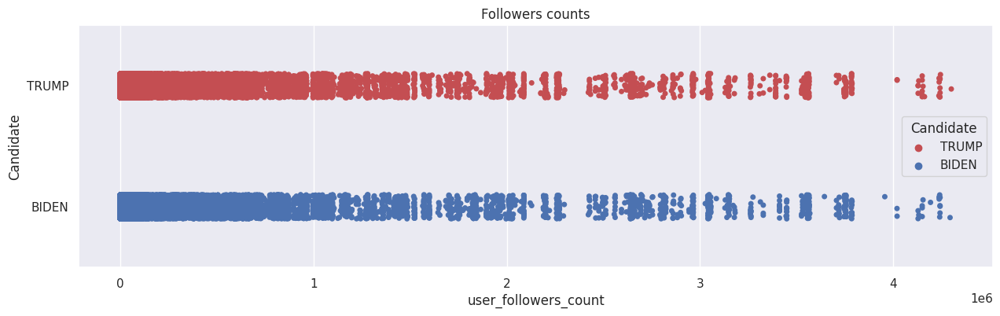

In [ ]:
user_followers= counts_of_followes[counts_of_followes['user_followers_count']<counts_of_followes['user_followers_count'].quantile(.999)]
user_followers.drop_duplicates(inplace =True)

sns.set(rc={'figure.figsize':(15, 4)})
plot = sns.stripplot(data=user_followers, x="user_followers_count",  y="Candidate",palette=["r", "b"], hue="Candidate")
plot.set_title("Followers counts")

del user_followers

In [ ]:
user_likes= kl[kl['likes']<kl['likes'].quantile(.999)]
## remove outlier

Text(0.5, 1.0, ' Likes per tweet')

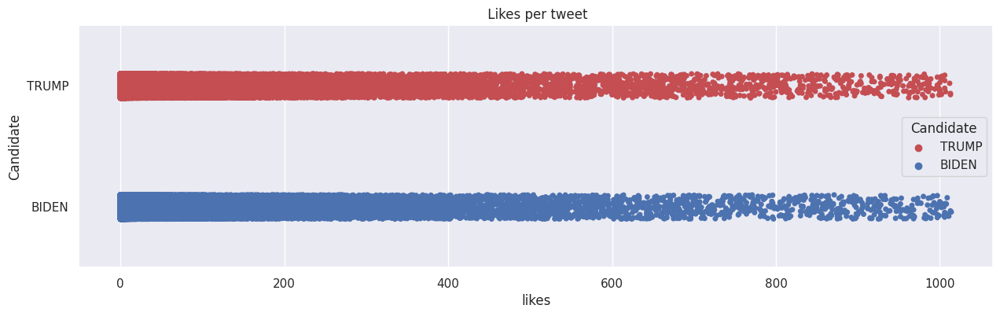

In [ ]:
sns.set(rc={'figure.figsize':(15, 4)})
plot = sns.stripplot(data=user_likes, x="likes",  y="Candidate",palette=["r", "b"], hue="Candidate")
plot.set_title(" Likes per tweet")

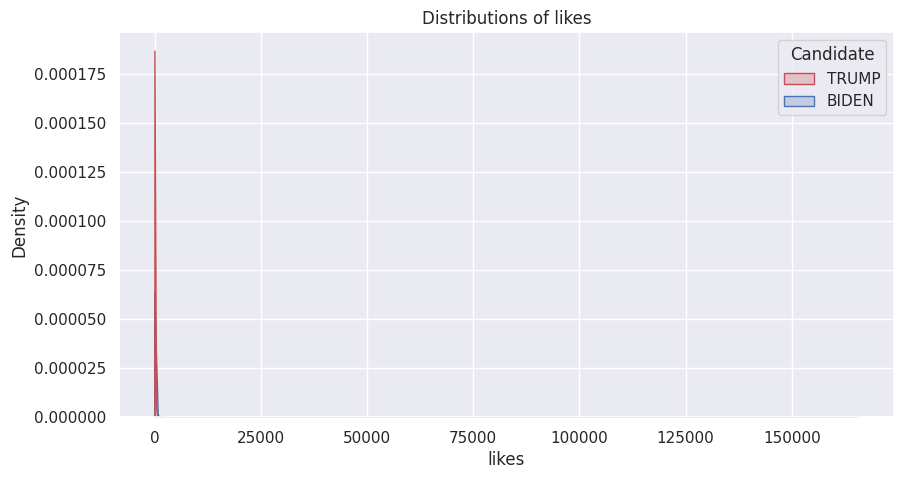

In [ ]:

plt.figure(figsize=(10, 5))
sns.kdeplot(data=kl ,hue="Candidate",  x="likes",palette=["r", "b"], shade = True)
plt.title('Distributions of likes')
plt.show()

In [ ]:
tweets_recount= kl[kl['retweet_count']<kl['retweet_count'].quantile(.999)]

Text(0.5, 1.0, ' Likes per tweet')

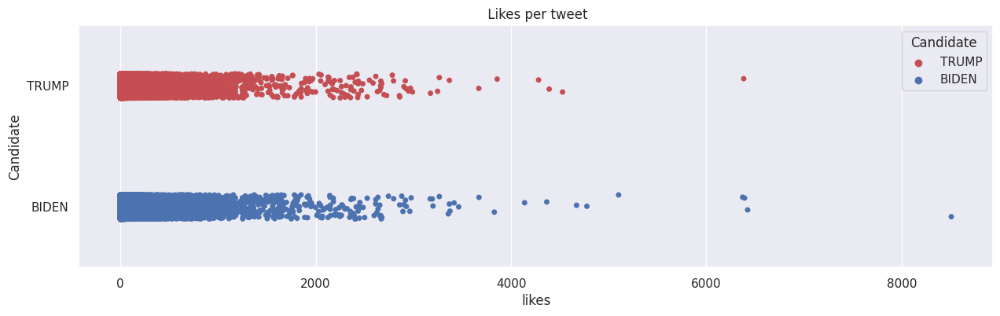

In [ ]:
sns.set(rc={'figure.figsize':(15, 4)})
plot = sns.stripplot(data=tweets_recount, x="likes",  y="Candidate",palette=["r", "b"], hue="Candidate")
plot.set_title(" Likes per tweet")

In [ ]:
likes= df[['tweet_id', 'likes', 'retweet_count']]
likes.drop_duplicates( ['tweet_id'],inplace=True)
likes

,tweet_id,likes,retweet_count
0,1.316529e+18,0.0,0.0
2,1.316529e+18,26.0,9.0
3,1.316529e+18,2.0,1.0
4,1.316529e+18,0.0,0.0
5,1.316529e+18,4.0,3.0
...,...,...,...
1753159,1.325589e+18,0.0,0.0
1753160,1.325589e+18,105.0,28.0
1753161,1.325589e+18,1.0,1.0
1753162,1.325589e+18,0.0,0.0


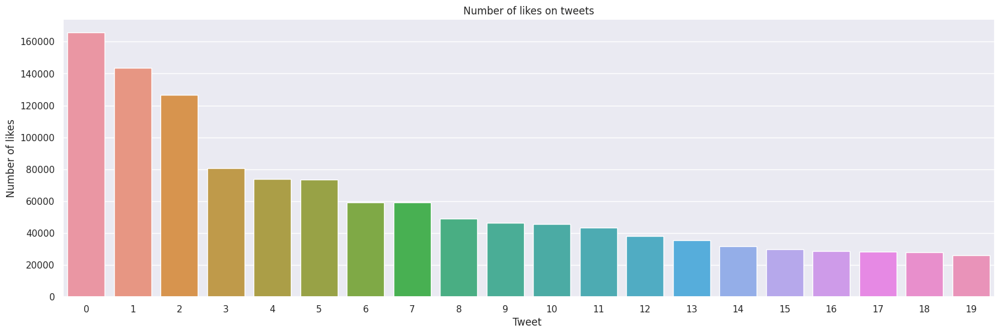

In [ ]:

like_pl=likes.sort_values(['likes'], ascending=False).head(20)
like_pl['tweet']= list(range(0,20))
like_pl['tweet_id']=like_pl['tweet_id'].astype('category')
like_pl['tweet_id'] = like_pl['tweet_id'].cat.codes
sns.set(rc={'figure.figsize':(20, 6)})
sns.barplot(data=like_pl, x='tweet', y='likes')
plt.title('Number of likes on tweets')
plt.xlabel("Tweet ")
plt.ylabel(" Number of likes ")
plt.show()

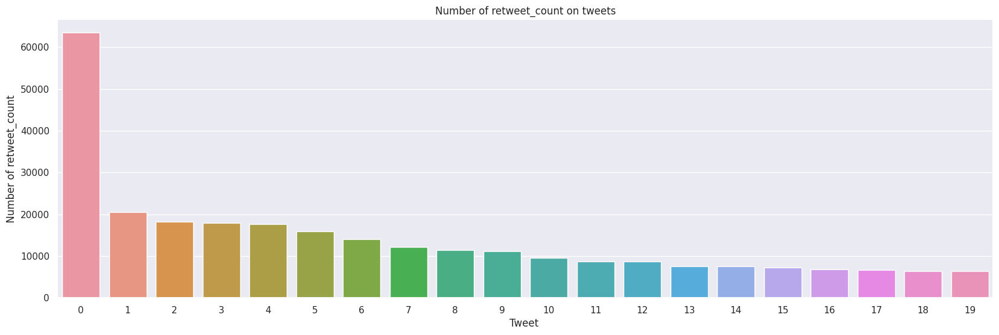

In [ ]:
retweet_pl=likes.sort_values(['retweet_count'], ascending=False).head(20)
retweet_pl['tweet']= list(range(0,20))
retweet_pl['tweet_id']=retweet_pl['tweet_id'].astype('category')
retweet_pl['tweet_id'] = retweet_pl['tweet_id'].cat.codes
sns.set(rc={'figure.figsize':(20, 6)})
sns.barplot(data=retweet_pl, x='tweet', y='retweet_count')
plt.title('Number of retweet_count on tweets')
plt.xlabel("Tweet ")
plt.ylabel(" Number of retweet_count ")
plt.show()

In [ ]:
candiate_user_sum=tweets[['likes', 'retweet_count','user_screen_name', 'user_followers_count', 'Candidate']]
candiate_user_sum = candiate_user_sum.groupby(['user_screen_name',  'Candidate']).agg({'likes': [ 'sum'], 
                                                                                'retweet_count' : [ 'sum'],
                                                                                'user_followers_count':['max'],
                                                                                'user_screen_name':['count']
                                                                                }).reset_index()
candiate_user_sum_sent=tweets[['likes', 'retweet_count','user_screen_name', 'user_followers_count', 'Candidate', "sentiment_overall"]]
candiate_user_sum_sent = candiate_user_sum_sent.groupby(['user_screen_name',"sentiment_overall" , 'Candidate']).agg({'likes': [ 'sum'], 
                                                                                'retweet_count' : [ 'sum'],
                                                                                'user_followers_count':['max'],
                                                                                'user_screen_name':['count']
                                                                                }).reset_index()
candiate_user_sum_sent.columns =[  'user_screen_name',"sentiment_overall",'Candidate',  'likes', 'retweet_count',
                            'user_followers_count', 'user_screen_name_count']  
candiate_user_sum.columns =[  'user_screen_name','Candidate',  'likes', 'retweet_count',
                            'user_followers_count', 'user_screen_name_count']                                                                                
candiate_user_sum_sent

,user_screen_name,sentiment_overall,Candidate,likes,retweet_count,user_followers_count,user_screen_name_count
0,0000000ef,Negative,BIDEN,0.0,0.0,0.0,1
1,00001Kat,Neutral,TRUMP,0.0,0.0,3176.0,1
2,0000StingRay,Neutral,BIDEN,0.0,0.0,451.0,1
3,00010001b,Neutral,TRUMP,0.0,0.0,41.0,1
4,00010001b,Positive,TRUMP,0.0,0.0,41.0,1
...,...,...,...,...,...,...,...
602114,zzzz_accordd,Negative,BIDEN,0.0,0.0,355.0,1
602115,zzzz_accordd,Neutral,BIDEN,0.0,0.0,356.0,1
602116,zzzz_accordd,Neutral,TRUMP,1.0,0.0,356.0,1
602117,zzzzooop,Neutral,BIDEN,0.0,0.0,17.0,1


In [ ]:
candiate_user_sum_sent.head()

,user_screen_name,sentiment_overall,Candidate,likes,retweet_count,user_followers_count,user_screen_name_count
0,0000000ef,Negative,BIDEN,0.0,0.0,0.0,1
1,00001Kat,Neutral,TRUMP,0.0,0.0,3176.0,1
2,0000StingRay,Neutral,BIDEN,0.0,0.0,451.0,1
3,00010001b,Neutral,TRUMP,0.0,0.0,41.0,1
4,00010001b,Positive,TRUMP,0.0,0.0,41.0,1


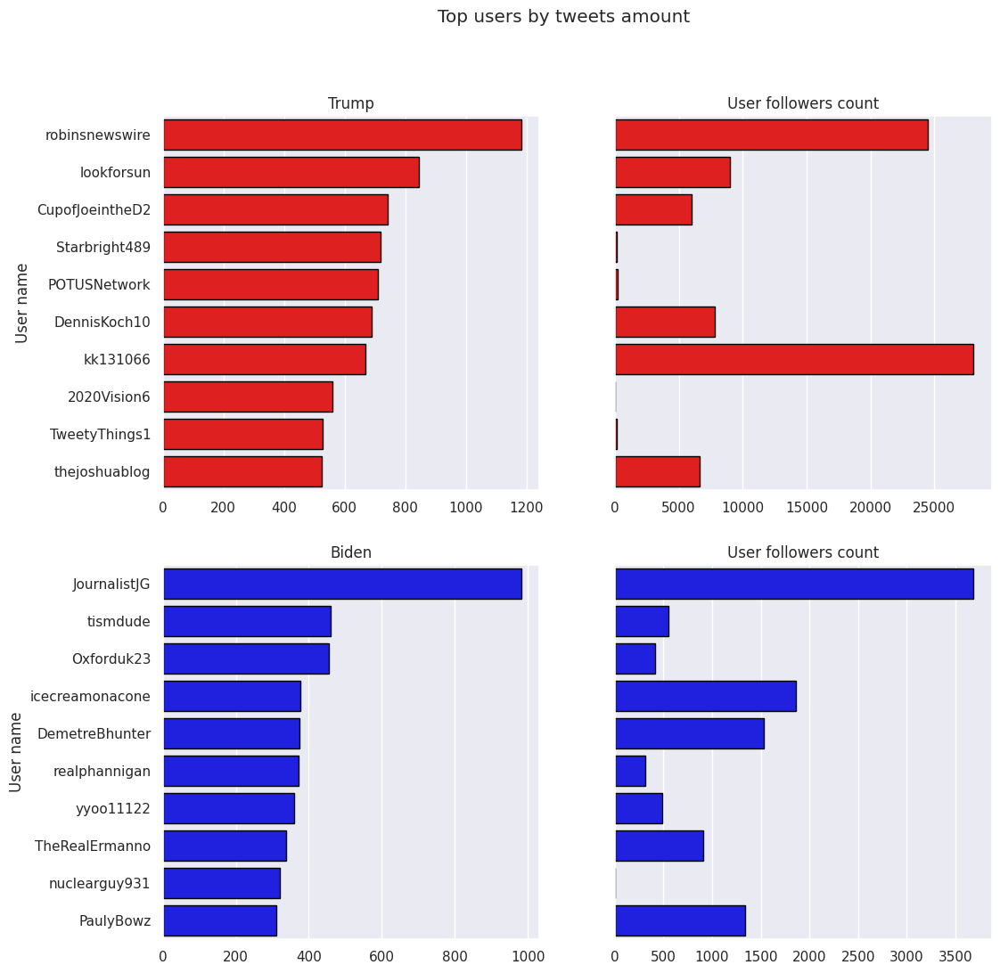

In [ ]:
# User followers count
trump = candiate_user_sum[candiate_user_sum['Candidate']=='TRUMP'].sort_values(['user_screen_name_count'], ascending=False).head(10)
biden = candiate_user_sum[candiate_user_sum['Candidate']!='TRUMP'].sort_values(['user_screen_name_count'], ascending=False).head(10)

top_users_by_tweet_of_trump = trump[['user_screen_name', 'user_screen_name_count']]
top_users_by_tweet_of_beiden = biden[['user_screen_name', 'user_screen_name_count']]

sns.set(rc={'figure.figsize':(12, 12)})
# Top users by tweets amount
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))
fig.suptitle("Top users by tweets amount")

sns.barplot(data =trump, x = 'user_screen_name_count', y = 'user_screen_name',  color = 'red', edgecolor = 'black', ax = ax1)
ax1.set_xlabel('')
ax1.set_ylabel('User name')
ax1.set_title('Trump')
wrap_labels_y(ax1, 20)

sns.barplot(data=biden,  x = 'user_screen_name_count', y = 'user_screen_name',
            color = 'blue', edgecolor = 'black', ax = ax3)
ax3.set_xlabel('')
ax3.set_ylabel('User name')
ax3.set_title('Biden')
wrap_labels_y(ax3, 20)

sns.barplot(data =trump, x = 'user_followers_count', y = 'user_screen_name',
            color = 'red', edgecolor = 'black', ax = ax2)
ax2.get_yaxis().set_visible(False)
ax2.set_xlabel('')
ax2.set_title('User followers count')


sns.barplot(data=biden,  x = 'user_followers_count', y = 'user_screen_name',
            color = 'blue', edgecolor = 'black', ax = ax4)
ax4.get_yaxis().set_visible(False)
ax4.set_xlabel('')
ax4.set_title('User followers count')

fig.show()

In [ ]:
top_users_by_tweet_of_trump

,user_screen_name,user_screen_name_count
423828,robinsnewswire,1183
376515,lookforsun,844
56246,CupofJoeintheD2,742
227567,Starbright489,718
185408,POTUSNetwork,709
65007,DennisKoch10,689
367628,kk131066,667
2206,2020Vision6,558
248001,TweetyThings1,528
449828,thejoshuablog,524


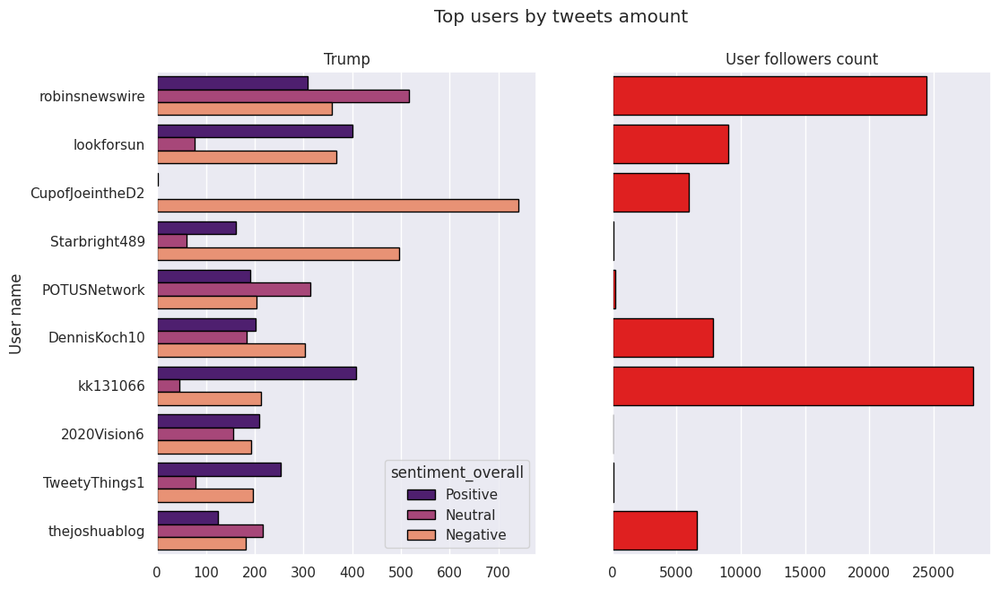

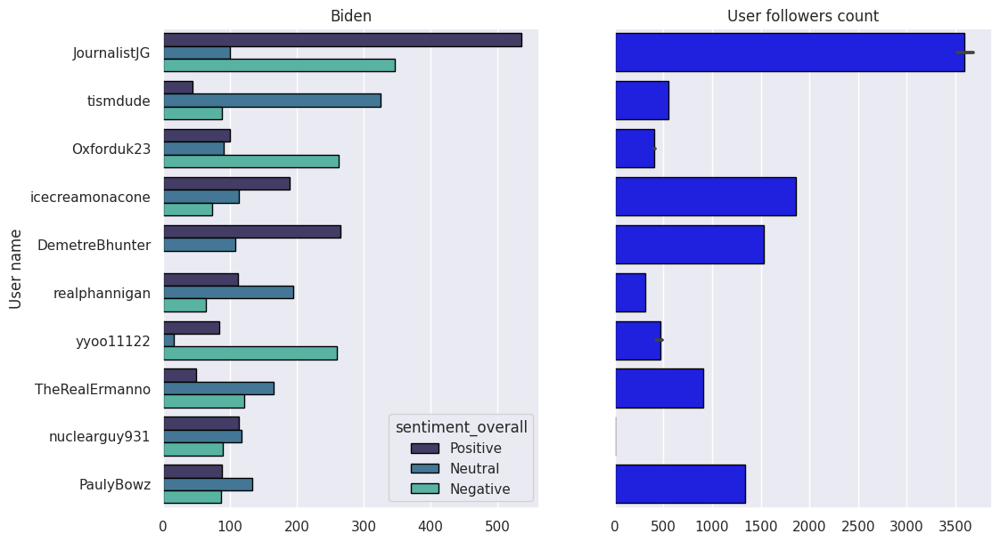

In [ ]:
# User followers count
trump_sent = candiate_user_sum_sent[(candiate_user_sum_sent['Candidate']=='TRUMP') & (candiate_user_sum_sent.user_screen_name.isin(top_users_by_tweet_of_trump['user_screen_name']))].sort_values(['user_screen_name_count'], ascending=False)
biden_sent = candiate_user_sum_sent[(candiate_user_sum_sent['Candidate']!='TRUMP') & (candiate_user_sum_sent.user_screen_name.isin(top_users_by_tweet_of_beiden['user_screen_name']))].sort_values(['user_screen_name_count'], ascending=False)

top_users_by_tweet_of_trump.rename(columns = {'user_screen_name_count':'user_screen_name_count_1'}, inplace = True)
top_users_by_tweet_of_beiden.rename(columns = {'user_screen_name_count':'user_screen_name_count_1'}, inplace = True)
trump_sent = trump_sent.merge(top_users_by_tweet_of_trump, how='left', on='user_screen_name')
biden_sent = biden_sent.merge(top_users_by_tweet_of_beiden, how='left', on='user_screen_name')

trump_sent = trump_sent.sort_values(['user_screen_name_count_1'], ascending=False)
biden_sent = biden_sent.sort_values(['user_screen_name_count_1'], ascending=False)
# Top users by tweets amount
fig, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(12, 7))
fig.suptitle("Top users by tweets amount")
#trump_sent.set_index('sentiment_overall').plot(kind='bar',  x = 'user_screen_name_count', y = 'user_screen_name',stacked=True,stacked=True,ax = ax1)
sns.barplot(data =trump_sent, x = 'user_screen_name_count', y = 'user_screen_name', hue='sentiment_overall' , palette="magma", edgecolor = 'black', ax = ax1)
ax1.set_xlabel('')
ax1.set_ylabel('User name')
ax1.set_title('Trump')
wrap_labels_y(ax1, 20)


sns.barplot(data =trump_sent, x = 'user_followers_count', y = 'user_screen_name',
            color = 'red', edgecolor = 'black', ax = ax2)
ax2.get_yaxis().set_visible(False)
ax2.set_xlabel('')
ax2.set_title('User followers count')

fig.show()
fig, ((ax3, ax4)) = plt.subplots(1, 2, figsize=(12, 7))

sns.barplot(data=biden_sent,  x = 'user_screen_name_count', y = 'user_screen_name', hue='sentiment_overall',
          palette="mako" ,edgecolor = 'black', ax = ax3)
ax3.set_xlabel('')
ax3.set_ylabel('User name')
ax3.set_title('Biden')
wrap_labels_y(ax3, 20)



sns.barplot(data=biden_sent,  x = 'user_followers_count', y = 'user_screen_name',
            color = 'blue', edgecolor = 'black', ax = ax4)
ax4.get_yaxis().set_visible(False)
ax4.set_xlabel('')
ax4.set_title('User followers count')

fig.show()

In [ ]:
del trump
del biden
del trump_sent
del biden_sent

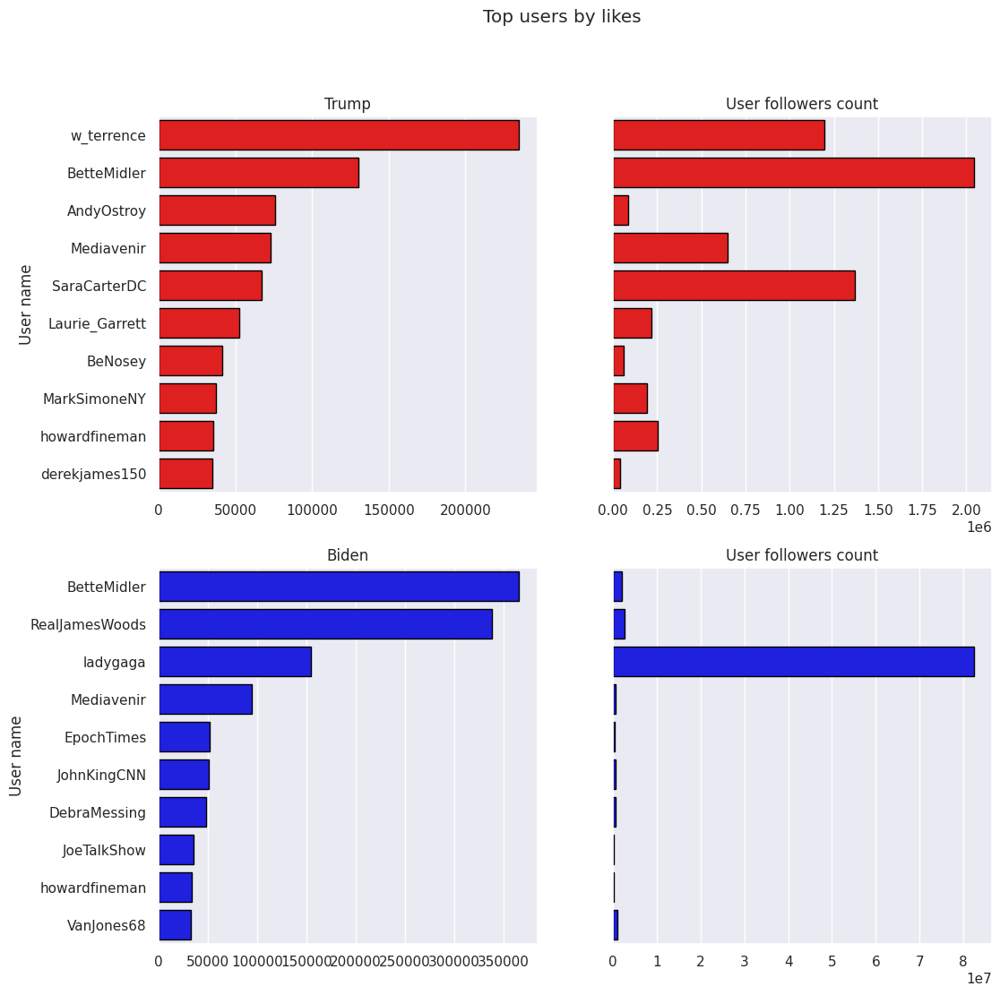

In [ ]:
# User followers count
trump = candiate_user_sum[candiate_user_sum['Candidate']=='TRUMP'].sort_values(['likes'], ascending=False).head(10)
biden = candiate_user_sum[candiate_user_sum['Candidate']!='TRUMP'].sort_values(['likes'], ascending=False).head(10)

top_users_by_tweet_of_trump = trump[['user_screen_name', 'likes']]
top_users_by_tweet_of_beiden = biden[['user_screen_name', 'likes']]


# Top users by likes
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))
fig.suptitle("Top users by likes")

sns.barplot(data =trump, x = 'likes', y = 'user_screen_name',  color = 'red', edgecolor = 'black', ax = ax1)
ax1.set_xlabel('')
ax1.set_ylabel('User name')
ax1.set_title('Trump')
wrap_labels_y(ax1, 20)

sns.barplot(data=biden,  x = 'likes', y = 'user_screen_name',
            color = 'blue', edgecolor = 'black', ax = ax3)
ax3.set_xlabel('')
ax3.set_ylabel('User name')
ax3.set_title('Biden')
wrap_labels_y(ax3, 20)

sns.barplot(data =trump, x = 'user_followers_count', y = 'user_screen_name',
            color = 'red', edgecolor = 'black', ax = ax2)
ax2.get_yaxis().set_visible(False)
ax2.set_xlabel('')
ax2.set_title('User followers count')


sns.barplot(data=biden,  x = 'user_followers_count', y = 'user_screen_name',
            color = 'blue', edgecolor = 'black', ax = ax4)
ax4.get_yaxis().set_visible(False)
ax4.set_xlabel('')
ax4.set_title('User followers count')

fig.show()

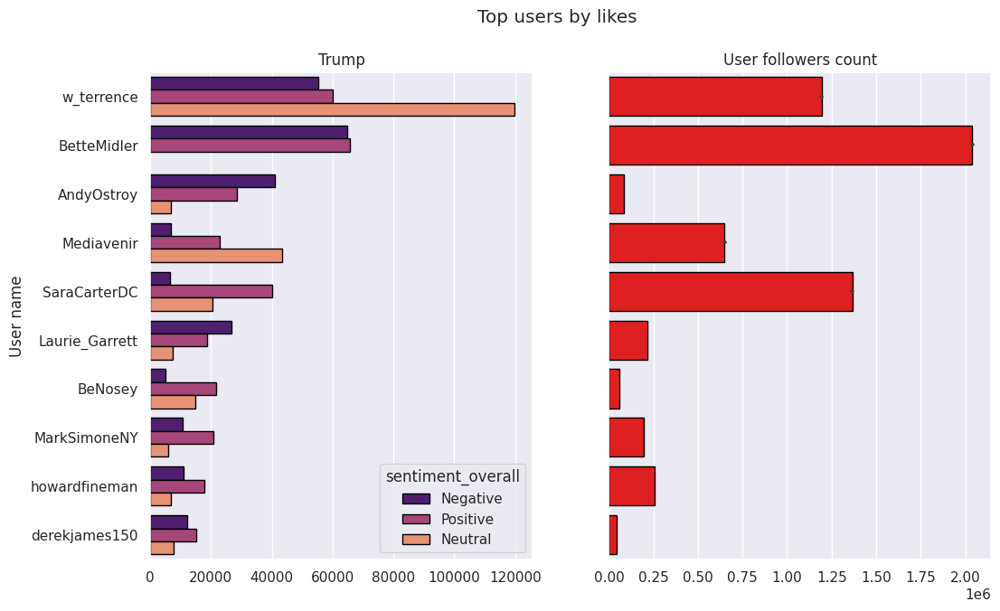

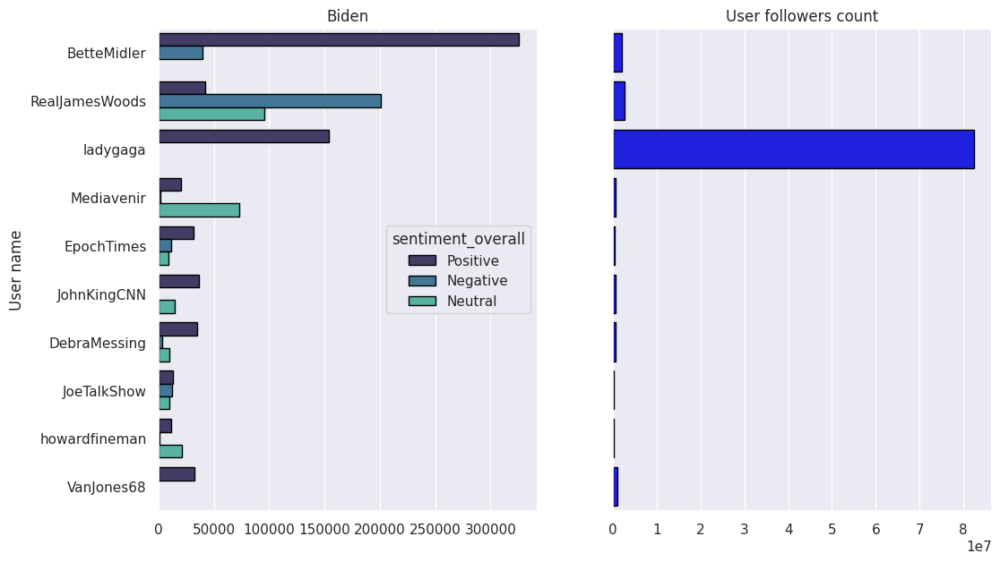

In [ ]:

# User followers count
trump_sent = candiate_user_sum_sent[(candiate_user_sum_sent['Candidate']=='TRUMP') & (candiate_user_sum_sent.user_screen_name.isin(top_users_by_tweet_of_trump['user_screen_name']))].sort_values(['user_screen_name_count'], ascending=False)
biden_sent = candiate_user_sum_sent[(candiate_user_sum_sent['Candidate']!='TRUMP') & (candiate_user_sum_sent.user_screen_name.isin(top_users_by_tweet_of_beiden['user_screen_name']))].sort_values(['user_screen_name_count'], ascending=False)

top_users_by_tweet_of_trump.rename(columns = {'likes':'likes_1'}, inplace = True)
top_users_by_tweet_of_beiden.rename(columns = {'likes':'likes_1'}, inplace = True)
trump_sent = trump_sent.merge(top_users_by_tweet_of_trump, how='left', on='user_screen_name')
biden_sent = biden_sent.merge(top_users_by_tweet_of_beiden, how='left', on='user_screen_name')


trump_sent = trump_sent.sort_values(['likes_1'], ascending=False)
biden_sent = biden_sent.sort_values(['likes_1'], ascending=False)


# Top users by tweets amount
fig, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(12, 7))
fig.suptitle("Top users by likes")
#trump_sent.set_index('sentiment_overall').plot(kind='bar',  x = 'user_screen_name_count', y = 'user_screen_name',stacked=True,stacked=True,ax = ax1)
sns.barplot(data =trump_sent, x = 'likes', y = 'user_screen_name', hue='sentiment_overall' , palette="magma", edgecolor = 'black', ax = ax1)
ax1.set_xlabel('')
ax1.set_ylabel('User name')
ax1.set_title('Trump')
wrap_labels_y(ax1, 20)


sns.barplot(data =trump_sent, x = 'user_followers_count', y = 'user_screen_name',
            color = 'red', edgecolor = 'black', ax = ax2)
ax2.get_yaxis().set_visible(False)
ax2.set_xlabel('')
ax2.set_title('User followers count')

fig.show()
fig, ((ax3, ax4)) = plt.subplots(1, 2, figsize=(12, 7))

sns.barplot(data=biden_sent,  x = 'likes', y = 'user_screen_name', hue='sentiment_overall',
          palette="mako" ,edgecolor = 'black', ax = ax3)
ax3.set_xlabel('')
ax3.set_ylabel('User name')
ax3.set_title('Biden')
wrap_labels_y(ax3, 20)



sns.barplot(data=biden_sent,  x = 'user_followers_count', y = 'user_screen_name',
            color = 'blue', edgecolor = 'black', ax = ax4)
ax4.get_yaxis().set_visible(False)
ax4.set_xlabel('')
ax4.set_title('User followers count')

fig.show()

In [ ]:
del trump
del biden
del trump_sent
del biden_sent

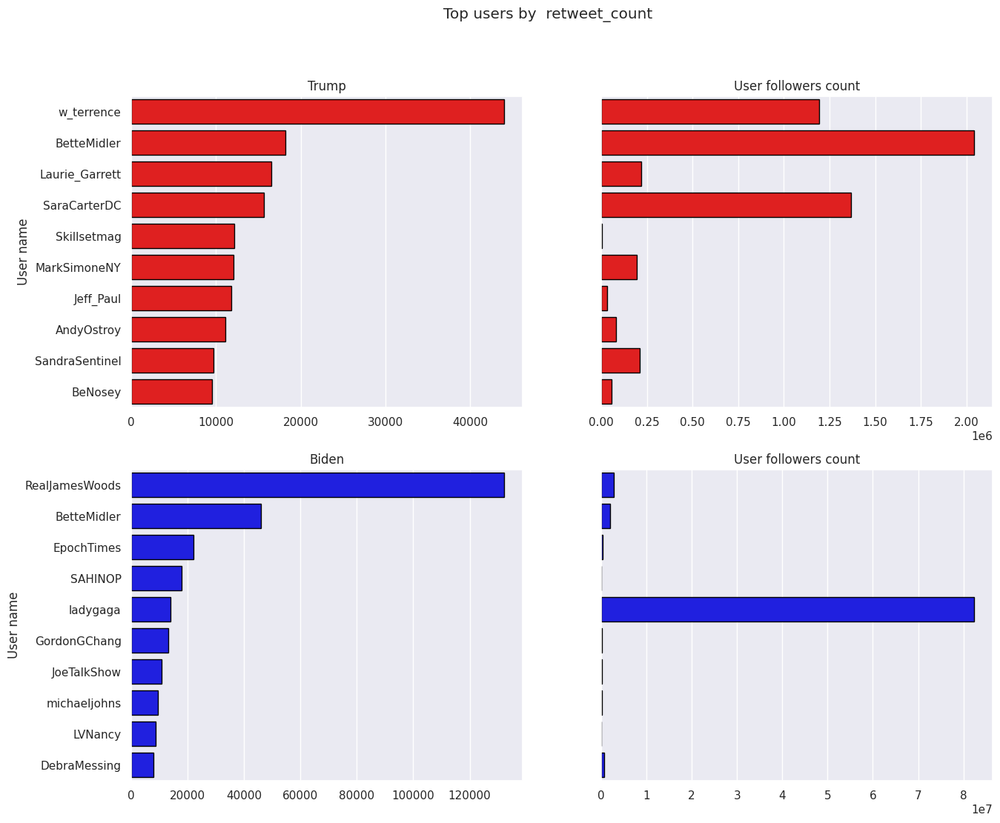

In [ ]:
# User followers count
trump = candiate_user_sum[candiate_user_sum['Candidate']=='TRUMP'].sort_values([ 'retweet_count'], ascending=False).head(10)
biden = candiate_user_sum[candiate_user_sum['Candidate']!='TRUMP'].sort_values([ 'retweet_count'], ascending=False).head(10)

top_users_by_tweet_of_trump = trump[['user_screen_name', 'retweet_count']]
top_users_by_tweet_of_beiden = biden[['user_screen_name', 'retweet_count']]


# Top users by  'retweet_count'
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle("Top users by  retweet_count")

sns.barplot(data =trump, x =  'retweet_count', y = 'user_screen_name',  color = 'red', edgecolor = 'black', ax = ax1)
ax1.set_xlabel('')
ax1.set_ylabel('User name')
ax1.set_title('Trump')
wrap_labels_y(ax1, 20)
wrap_labels_x(ax1, 10)

sns.barplot(data=biden,  x =  'retweet_count', y = 'user_screen_name', color = 'blue', edgecolor = 'black', ax = ax3)
ax3.set_xlabel('')
ax3.set_ylabel('User name')
ax3.set_title('Biden')
wrap_labels_y(ax3, 20)
wrap_labels_x(ax3, 10)

sns.barplot(data =trump, x = 'user_followers_count', y = 'user_screen_name',  color = 'red', edgecolor = 'black', ax = ax2)
ax2.get_yaxis().set_visible(False)
ax2.set_xlabel('')
ax2.set_title('User followers count')


sns.barplot(data=biden,  x = 'user_followers_count', y = 'user_screen_name',  color = 'blue', edgecolor = 'black', ax = ax4)
ax4.get_yaxis().set_visible(False)
ax4.set_xlabel('')

ax4.set_title('User followers count')

fig.show()

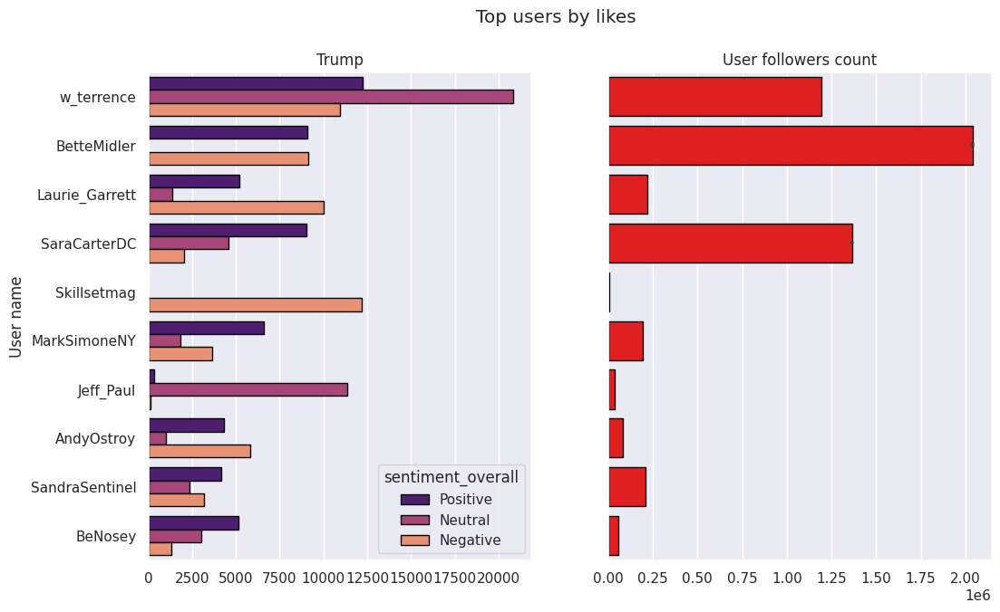

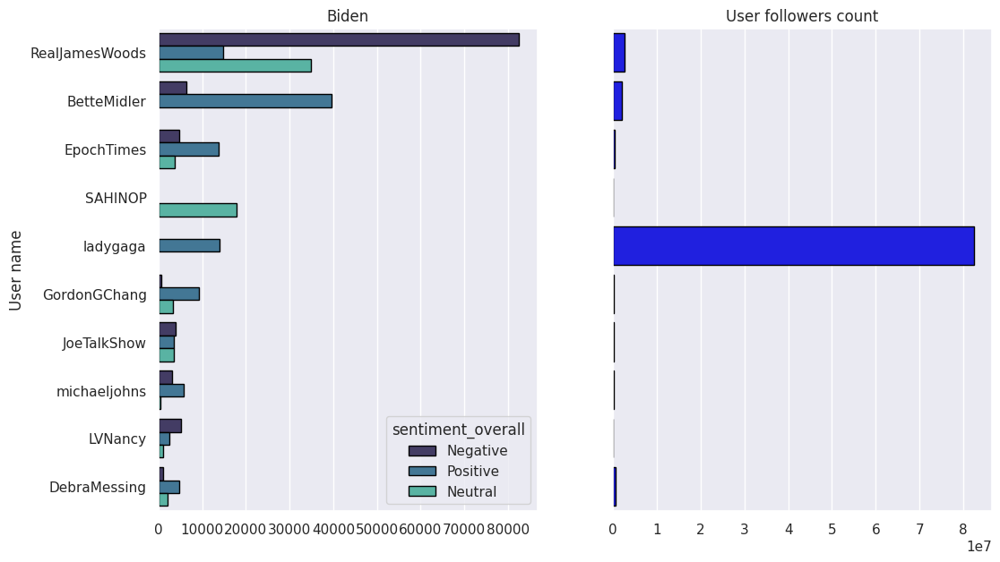

In [ ]:
# User followers count
trump_sent = candiate_user_sum_sent[(candiate_user_sum_sent['Candidate']=='TRUMP') & (candiate_user_sum_sent.user_screen_name.isin(top_users_by_tweet_of_trump['user_screen_name']))]
biden_sent = candiate_user_sum_sent[(candiate_user_sum_sent['Candidate']!='TRUMP') & (candiate_user_sum_sent.user_screen_name.isin(top_users_by_tweet_of_beiden['user_screen_name']))]

top_users_by_tweet_of_trump.rename(columns = {'retweet_count':'retweet_count_1'}, inplace = True)
top_users_by_tweet_of_beiden.rename(columns = {'retweet_count':'retweet_count_1'}, inplace = True)
trump_sent = trump_sent.merge(top_users_by_tweet_of_trump, how='left', on='user_screen_name')
biden_sent = biden_sent.merge(top_users_by_tweet_of_beiden, how='left', on='user_screen_name')


trump_sent = trump_sent.sort_values(['retweet_count_1'], ascending=False)
biden_sent = biden_sent.sort_values(['retweet_count_1'], ascending=False)

# Top users by  retweet countstweets amount
fig, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(12, 7))
fig.suptitle("Top users by likes")

sns.barplot(data =trump_sent, x =  'retweet_count', y = 'user_screen_name', hue='sentiment_overall' , palette="magma", edgecolor = 'black', ax = ax1)
ax1.set_xlabel('')
ax1.set_ylabel('User name')
ax1.set_title('Trump')
wrap_labels_y(ax1, 20)
wrap_labels_x(ax1, 10)


sns.barplot(data =trump_sent, x = 'user_followers_count', y = 'user_screen_name',
            color = 'red', edgecolor = 'black', ax = ax2)
ax2.get_yaxis().set_visible(False)
ax2.set_xlabel('')
ax2.set_title('User followers count')

fig.show()
fig, ((ax3, ax4)) = plt.subplots(1, 2, figsize=(12, 7))


sns.barplot(data=biden_sent,  x =  'retweet_count', y = 'user_screen_name', hue='sentiment_overall' ,palette="mako", edgecolor = 'black', ax = ax3)
ax3.set_xlabel('')
ax3.set_ylabel('User name')
ax3.set_title('Biden')
wrap_labels_y(ax3, 20)
wrap_labels_x(ax3, 10)


sns.barplot(data=biden_sent,  x = 'user_followers_count', y = 'user_screen_name',
            color = 'blue', edgecolor = 'black', ax = ax4)
ax4.get_yaxis().set_visible(False)
ax4.set_xlabel('')
ax4.set_title('User followers count')

fig.show()

In [ ]:
del trump
del biden
del trump_sent
del biden_sent
del counts_of_followes

In [ ]:

del counts_of_likes_and_retweet
del kl
del user_likes
del tweets_recount
del likes
del like_pl
del candiate_user_sum

In [ ]:
del timeline
del timeline_month

# Location Wise Analysis of Tweets

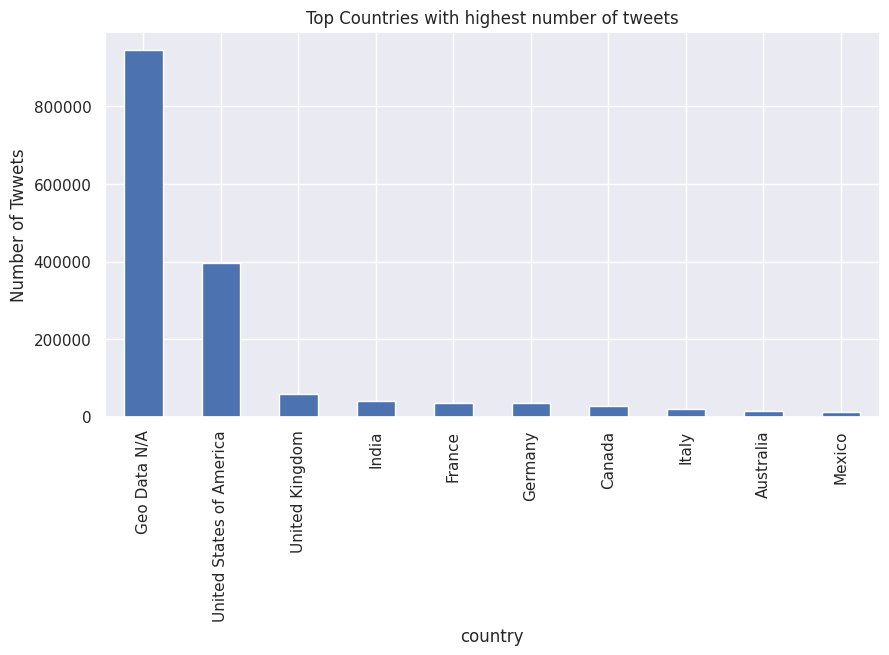

In [ ]:
plt.figure(figsize=(10,5))
df.groupby('country')['tweet'].count().sort_values(ascending=False).head(10).plot.bar()
plt.ylabel('Number of Twwets')
plt.title('Top Countries with highest number of tweets')
plt.show()

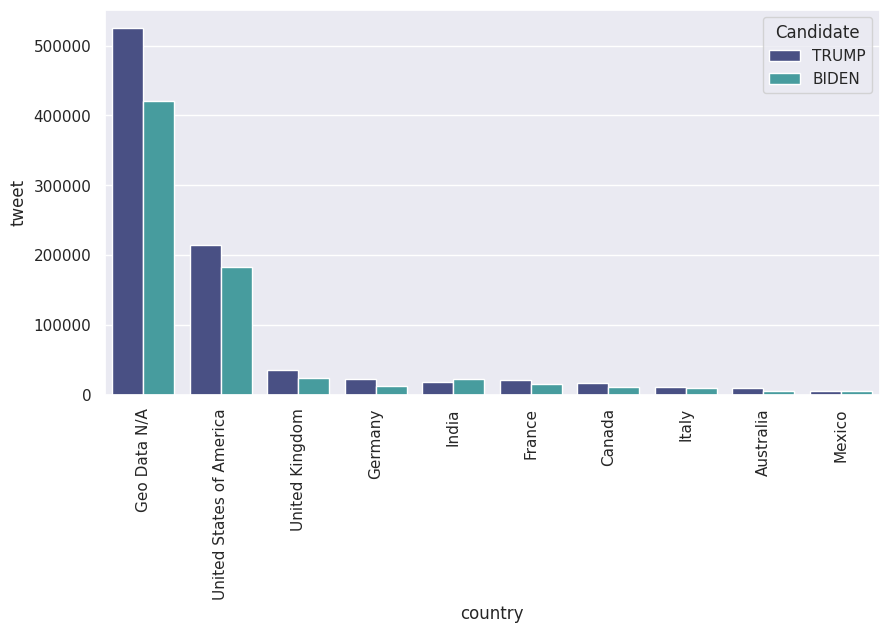

In [ ]:
countries = df.groupby('country')['tweet'].count().sort_values(ascending=False).head(10).index.tolist()
tweet_df = df.groupby(['country','Candidate'])['tweet'].count().sort_values(ascending=False).reset_index()

tweet_df = tweet_df[tweet_df['country'].isin(countries)]
plt.figure(figsize=(10,5))
ax = sns.barplot(data=tweet_df,x='country',y='tweet',hue='Candidate',palette="mako")
plt.xticks(rotation=90)
plt.show()

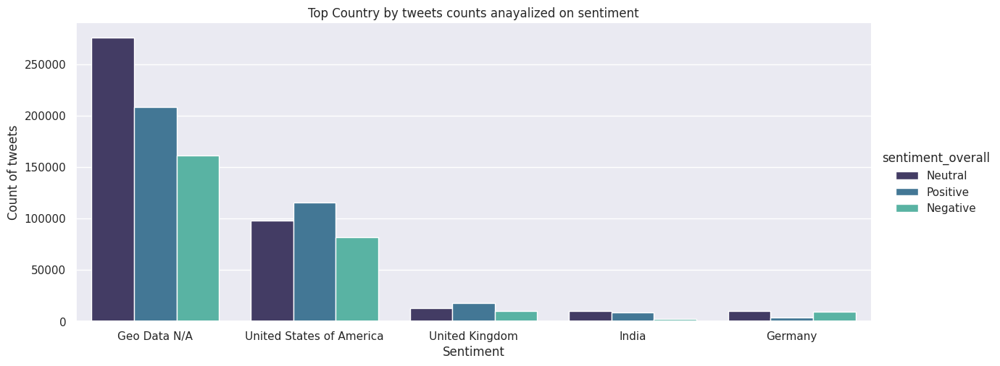

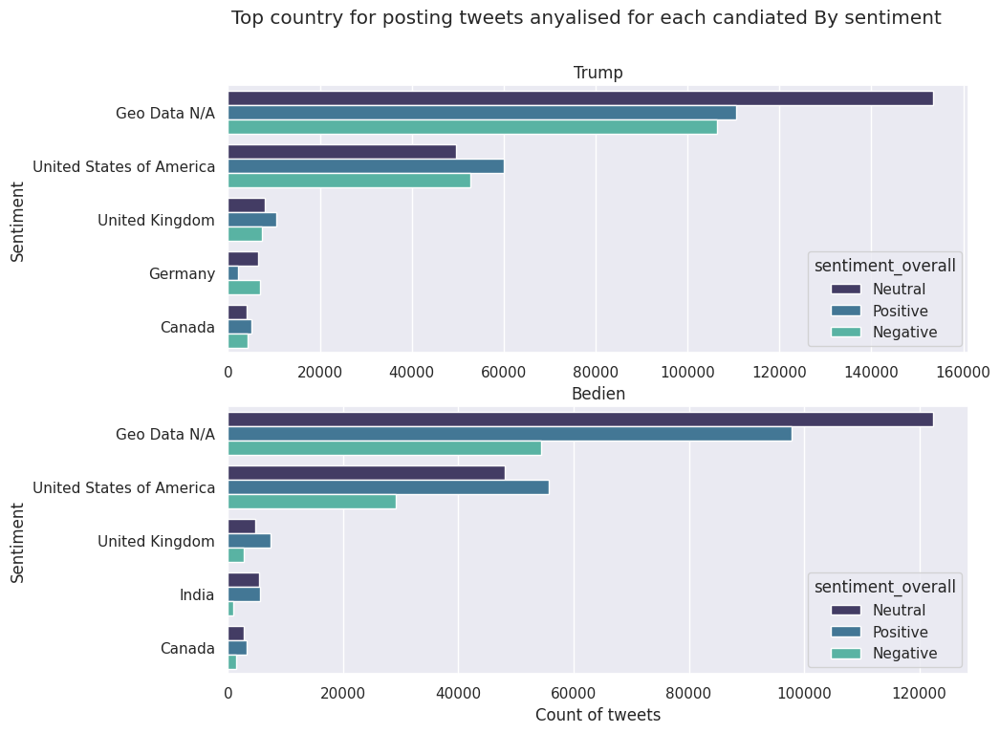

In [ ]:
## Top countries by santiment
sentiment_count_df = tweets.groupby(['country', 'Candidate']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
top_country_trump=sentiment_count_df[sentiment_count_df['Candidate']=='TRUMP']['country'].head(5)
top_country_beden=sentiment_count_df[sentiment_count_df['Candidate']!='TRUMP']['country'].head(5)

del sentiment_count_df

top_all =tweets.groupby(['country'])["clean_tweet"].count().sort_values(ascending=False).reset_index()
all_sentiment_count_df = tweets.groupby(['sentiment_overall','country']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
all_sentiment_count_df = all_sentiment_count_df[all_sentiment_count_df.country.isin(top_all['country'].head(5))]


sentiment_count_df = tweets.groupby(['sentiment_overall','country', 'Candidate']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
sentiment_count_df_trump =sentiment_count_df[(sentiment_count_df['Candidate']=='TRUMP' )&( sentiment_count_df.country.isin(top_country_trump)) ]
sentiment_count_df_bed =sentiment_count_df[(sentiment_count_df['Candidate']!='TRUMP' )&( sentiment_count_df.country.isin(top_country_beden)) ]

sns.set(rc={'figure.figsize':(15,10)})
ax=sns.catplot(x="country", y="clean_tweet", hue="sentiment_overall", kind="bar", aspect=20.5/8.27 ,palette="mako",
                data=all_sentiment_count_df).set(title='Top Country by tweets counts anayalized on sentiment')
plt.xlabel("Sentiment")
plt.ylabel("Count of tweets")
fig.show()


# candiadte wise sentiment
fig, ((ax1, ax2)) = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle("Top country for posting tweets anyalised for each candiated By sentiment")

sns.barplot(y="country", x="clean_tweet", hue="sentiment_overall" ,data=sentiment_count_df_trump ,palette="mako", ax = ax1)
ax1.set_xlabel('')

wrap_labels_x(ax1, 10)
ax1.set_ylabel('Sentiment')
ax1.set_title('Trump')


sns.barplot(y="country", x="clean_tweet", hue="sentiment_overall" ,data=sentiment_count_df_bed ,palette="mako",  ax = ax2)
ax2.set_ylabel('Sentiment')

wrap_labels_x(ax2, 10)
ax2.set_xlabel('Count of tweets')
ax2.set_title('Bedien')
fig.show()

## setmiment polt fro each country by candidate

del top_all
del top_country_trump
del top_country_beden
del sentiment_count_df_trump
del sentiment_count_df_bed
del sentiment_count_df


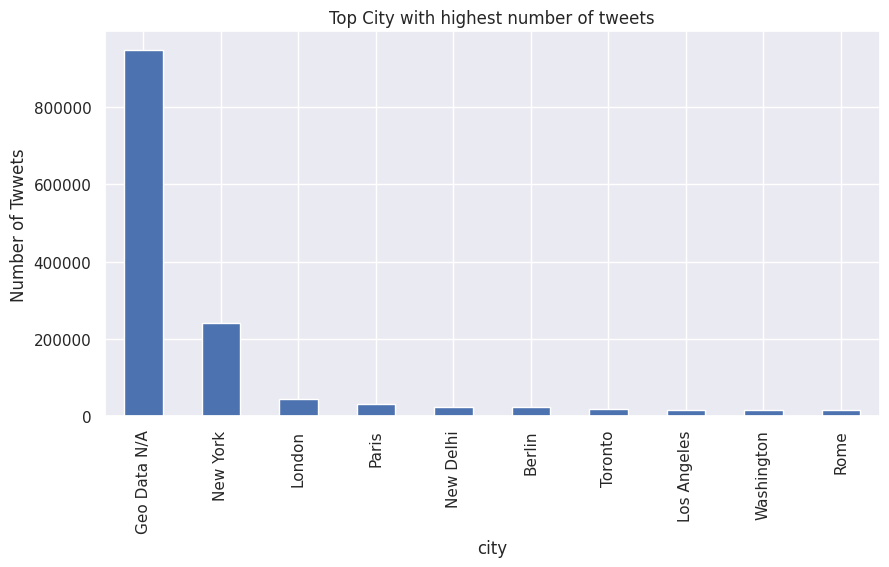

In [ ]:
plt.figure(figsize=(10,5))
df.groupby('city')['tweet'].count().sort_values(ascending=False).head(10).plot.bar()
plt.ylabel('Number of Twwets')
plt.title('Top City with highest number of tweets')
plt.show()

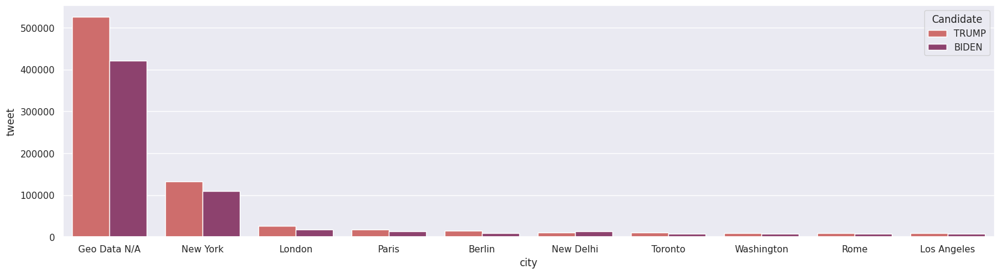

In [ ]:
#city wise analysis
cities = df.groupby('city')['tweet'].count().sort_values(ascending=False).head(10).index.tolist()

city_df = df.groupby(['city','Candidate'])['tweet'].count().sort_values(ascending=False).reset_index()

city_df = city_df[city_df['city'].isin(cities)]

plt.figure(figsize=(20,5))

sns.barplot(data=city_df,x='city',y='tweet',hue='Candidate', palette="flare")

plt.show()


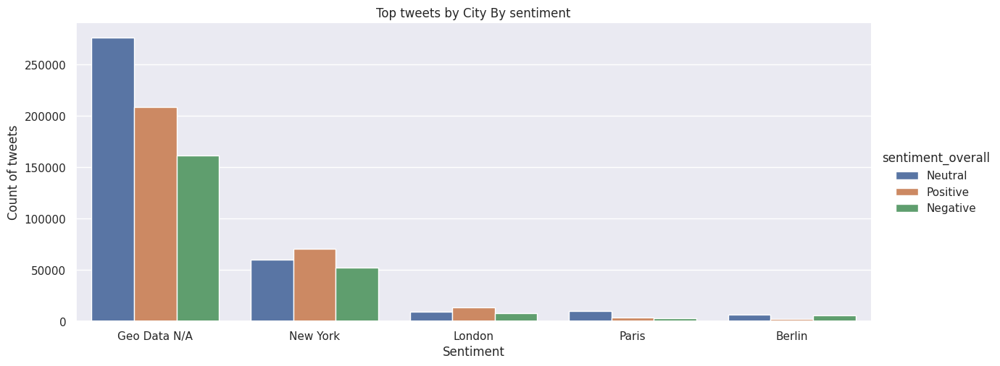

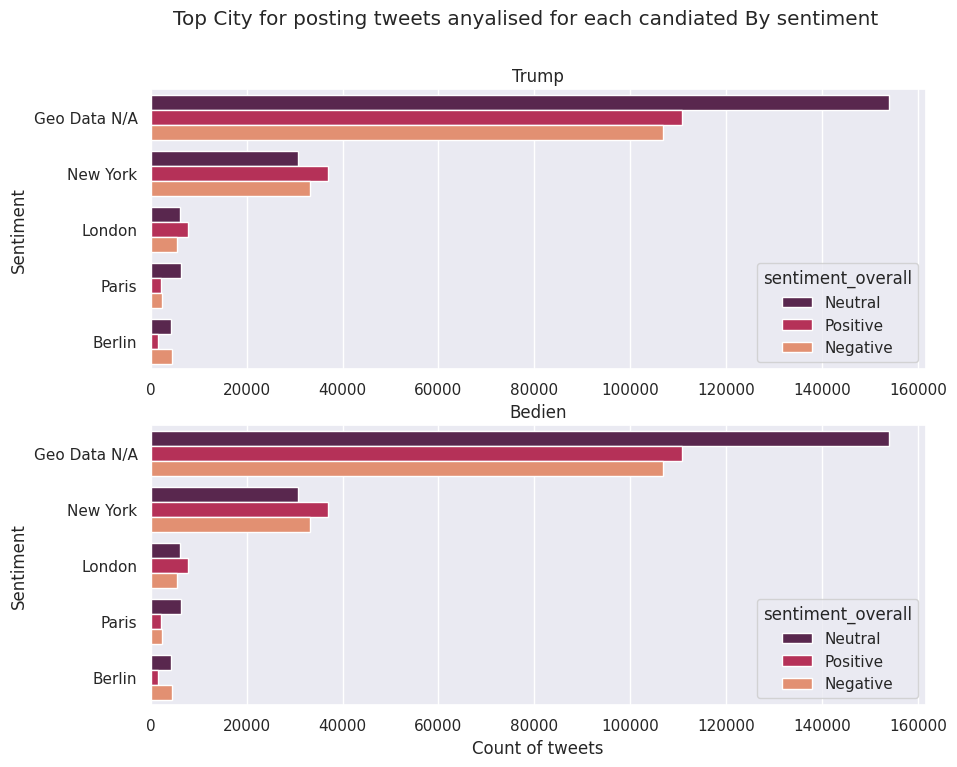

In [ ]:
## Top cities by santiment
sentiment_city_df = tweets.groupby(['city', 'Candidate']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
top_city_trump=sentiment_city_df[sentiment_city_df['Candidate']=='TRUMP']['city'].head(5)
top_city_beden=sentiment_city_df[sentiment_city_df['Candidate']!='TRUMP']['city'].head(5)

del sentiment_city_df

top_all =tweets.groupby(['city'])["clean_tweet"].count().sort_values(ascending=False).reset_index()
all_sentiment_city_df = tweets.groupby(['sentiment_overall','city']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
all_sentiment_city_df = all_sentiment_city_df[all_sentiment_city_df.city.isin(top_all['city'].head(5))]


sentiment_city_df = tweets.groupby(['sentiment_overall','city', 'Candidate']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
sentiment_city_df_trump =sentiment_city_df[(sentiment_city_df['Candidate']=='TRUMP' )&( sentiment_city_df.city.isin(top_city_trump)) ]
sentiment_city_df_bed =sentiment_city_df[(sentiment_city_df['Candidate']!='TRUMP' )&( sentiment_city_df.city.isin(top_city_beden)) ]

sns.set(rc={'figure.figsize':(15,10)})

ax=sns.catplot(x="city", y="clean_tweet", hue="sentiment_overall", kind="bar", aspect=20.5/8.27 ,
                data=all_sentiment_city_df).set(title='Top tweets by City By sentiment')
plt.xlabel("Sentiment")
plt.ylabel("Count of tweets")
fig.show()

# candiadte wise sentiment
fig, ((ax1, ax2)) = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle("Top City for posting tweets anyalised for each candiated By sentiment")

sns.barplot(y="city", x="clean_tweet", hue="sentiment_overall" ,data=sentiment_city_df_trump ,palette="rocket", ax = ax1)
ax1.set_xlabel('')

wrap_labels_x(ax1, 10)
ax1.set_ylabel('Sentiment')
ax1.set_title('Trump')


sns.barplot(y="city", x="clean_tweet", hue="sentiment_overall" ,data=sentiment_city_df_trump ,palette="rocket",  ax = ax2)
ax2.set_ylabel('Sentiment')

wrap_labels_x(ax2, 10)
ax2.set_xlabel('Count of tweets')
ax2.set_title('Bedien')
fig.show()

## setmiment polt fro each country by candidate

del top_all
del top_city_trump
del top_city_beden
del sentiment_city_df_trump
del sentiment_city_df_bed
del sentiment_city_df


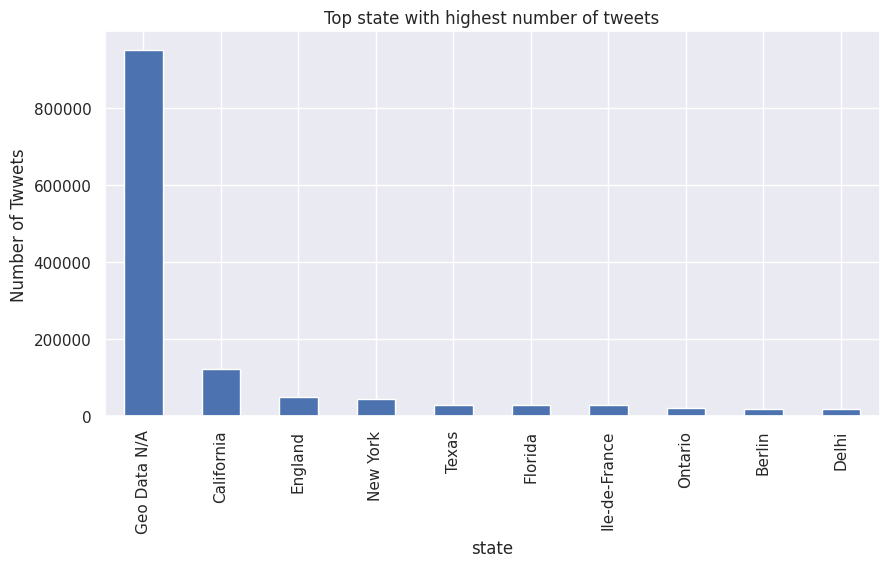

In [ ]:
plt.figure(figsize=(10,5))
df.groupby('state')['tweet'].count().sort_values(ascending=False).head(10).plot.bar()
plt.ylabel('Number of Twwets')
plt.title('Top state with highest number of tweets')
plt.show()

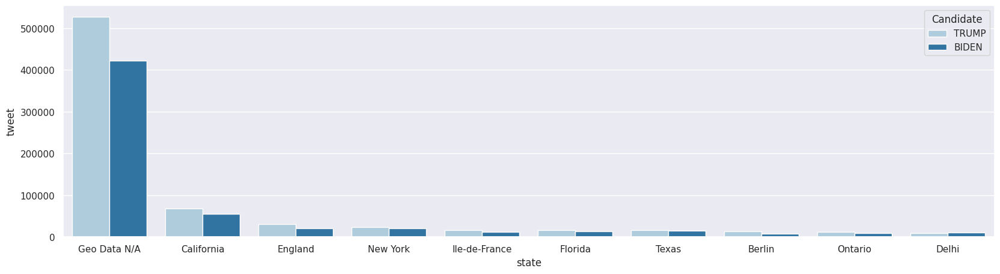

In [ ]:
states = df.groupby('state')['tweet'].count().sort_values(ascending=False).head(10).index.tolist()

state_df = df.groupby(['state','Candidate'])['tweet'].count().sort_values(ascending=False).reset_index()

state_df = state_df[state_df['state'].isin(states)]

plt.figure(figsize=(20,5))
sns.set_style("darkgrid")
sns.barplot(data=state_df,x='state',y='tweet',hue='Candidate' ,palette="Paired")
plt.show()

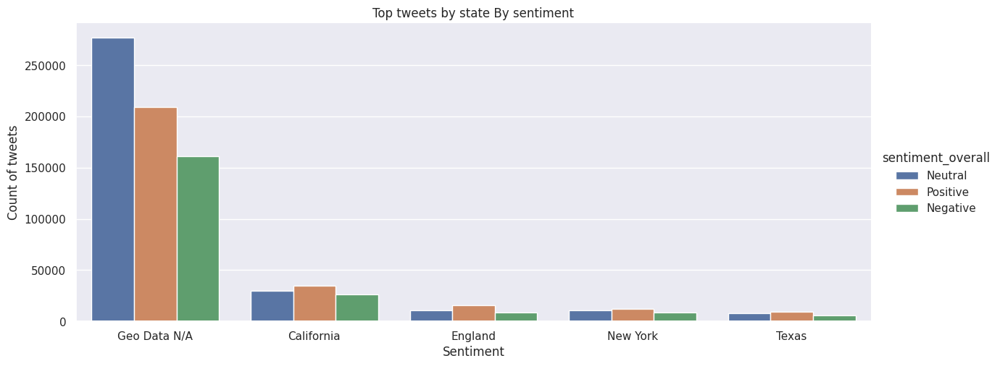

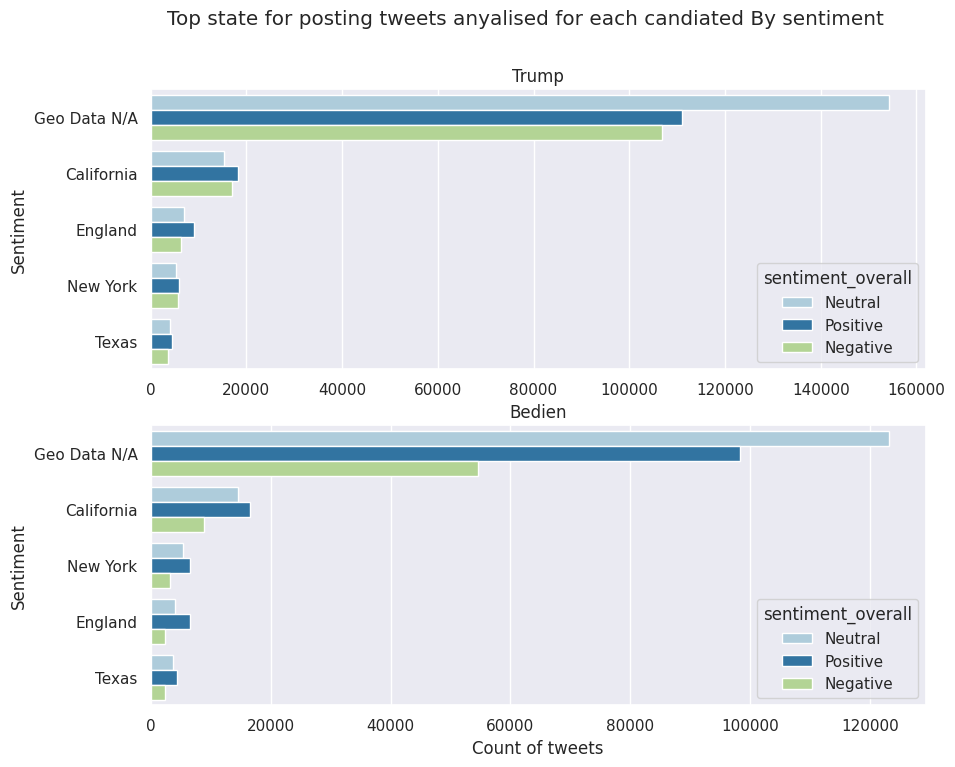

In [ ]:
## Top satates by santiment
sentiment_state_df = tweets.groupby(['state', 'Candidate']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
top_state_trump=sentiment_state_df[sentiment_state_df['Candidate']=='TRUMP']['state'].head(5)
top_state_beden=sentiment_state_df[sentiment_state_df['Candidate']!='TRUMP']['state'].head(5)

del sentiment_state_df

top_all =tweets.groupby(['state'])["clean_tweet"].count().sort_values(ascending=False).reset_index()
all_sentiment_state_df = tweets.groupby(['sentiment_overall','state']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
all_sentiment_state_df = all_sentiment_state_df[all_sentiment_state_df.state.isin(top_all['state'].head(5))]


sentiment_state_df = tweets.groupby(['sentiment_overall','state', 'Candidate']).count().sort_values(by=["clean_tweet"], ascending=False)["clean_tweet"].reset_index()
sentiment_state_df_trump =sentiment_state_df[(sentiment_state_df['Candidate']=='TRUMP' )&( sentiment_state_df.state.isin(top_state_trump)) ]
sentiment_state_df_bed =sentiment_state_df[(sentiment_state_df['Candidate']!='TRUMP' )&( sentiment_state_df.state.isin(top_state_beden)) ]

sns.set(rc={'figure.figsize':(15,10)})

ax=sns.catplot(x="state", y="clean_tweet", hue="sentiment_overall", kind="bar", aspect=20.5/8.27 ,
                data=all_sentiment_state_df).set(title='Top tweets by state By sentiment')
plt.xlabel("Sentiment")
plt.ylabel("Count of tweets")
plt.show()


# candiadte wise sentiment
fig, ((ax1, ax2)) = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle("Top state for posting tweets anyalised for each candiated By sentiment")

sns.barplot(y="state", x="clean_tweet", hue="sentiment_overall" ,data=sentiment_state_df_trump ,palette="Paired", ax = ax1)
ax1.set_xlabel('')

wrap_labels_x(ax1, 10)
ax1.set_ylabel('Sentiment')
ax1.set_title('Trump')


sns.barplot(y="state", x="clean_tweet", hue="sentiment_overall" ,data=sentiment_state_df_bed ,palette="Paired",  ax = ax2)
ax2.set_ylabel('Sentiment')

wrap_labels_x(ax2, 10)
ax2.set_xlabel('Count of tweets')
ax2.set_title('Bedien')
fig.show()

del top_all
del top_state_trump
del top_state_beden
del sentiment_state_df_trump
del sentiment_state_df_bed
del sentiment_state_df


# Using Maps to Visualize tweet counts and likes



In [ ]:
#geoplot of tweets
groups = df.groupby('Candidate')
trump = groups.get_group('TRUMP')
biden = groups.get_group('BIDEN')

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 41.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 80.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 64.2 MB/s eta 0:00:00


In [ ]:
from shapely.geometry import Point
import geopandas as gpd

tmp_tr = trump[['lat', 'long']].dropna()
tmp_bi = biden[['lat', 'long']].dropna()

geometry_tr = [Point(xy) for xy in zip(tmp_tr['long'], tmp_tr['lat'])]
geometry_bi = [Point(xy) for xy in zip(tmp_bi['long'], tmp_bi['lat'])]

geo_df_tr = gpd.GeoDataFrame(geometry = geometry_tr)
geo_df_bi = gpd.GeoDataFrame(geometry = geometry_bi)

wmap = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

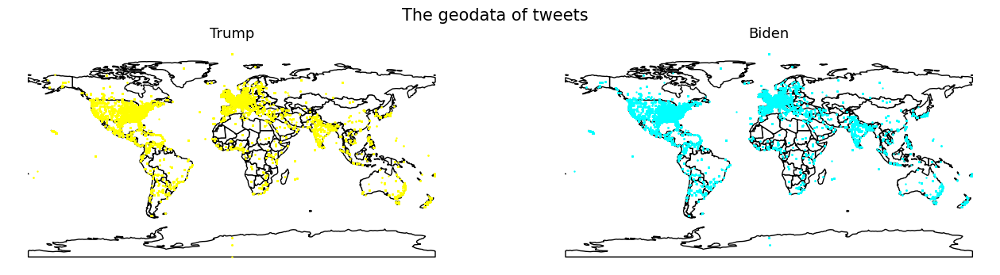

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), facecolor = 'white')
plt.text(x = -325, y = 120, s = "The geodata of tweets", fontsize = 15)

wmap.plot(ax = ax1, edgecolors='black', color = 'white')
geo_df_tr.plot(ax = ax1, markersize = 0.5, color = 'yellow')
ax1.set_title('Trump', size = 13)
ax1.axis('off')

wmap.plot(ax = ax2, edgecolors='black', color = 'white')
geo_df_bi.plot(ax = ax2, markersize = 0.5, color = 'cyan')
ax2.set_title('Biden', size = 13)
ax2.axis('off')

fig.show()

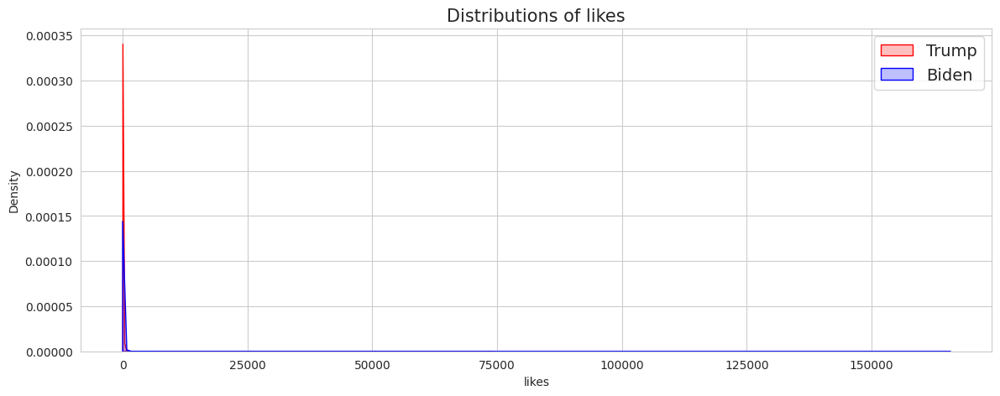

In [ ]:
import seaborn as sns
sns.set_style("whitegrid")
plt.figure(figsize=(14, 5))

sns.kdeplot(trump['likes'], label = 'Trump', shade = True, color = 'red')
sns.kdeplot(biden['likes'], label = 'Biden', shade = True, color = 'blue')
plt.title('Distributions of likes', size = 15)
plt.legend(prop={'size': 14})
plt.show()

In [ ]:
tweets['clean_tweet'][0]

Deliverable 2: Clustering and Frequent Pattern Mining [40%]:
Perform cluster analyses on the data, primarily on location and source. Other
clustering could be done based on the time etc. You can also find other attributes of your choice
for performing clustering. Find frequent patterns in the dataset and explain your findings. Your
report for this deliverable must justify your choice of clustering algorithm.
NOTE: You are free to implement your own algorithm or use any library to perform selected
tasks.

#Clustering

1) custering by source-country-emotion

2) custering by country/source-date-emotion

3)clustering by likes and days .

4) text clustering by PCA
5( hastags likes

In [159]:
## importing library
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer

In [160]:
def get_popular_tags(lis, common_words):
  arr=[]
  for word in lis:
    if word in common_words:
      arr.append(word)
  return arr


In [161]:
def get_freq(word, resultDictionary):
  return resultDictionary[word]

In [162]:
src = tweets.groupby('source').count().sort_values(by=["tweet_id"], ascending=False)["tweet_id"].reset_index()
scr_map = dict(zip(src.source,src.tweet_id))
coun = tweets.groupby('country').count().sort_values(by=["tweet_id"], ascending=False)["tweet_id"].reset_index()
coun_map = dict(zip(coun.country,coun.tweet_id))

days = tweets.groupby('splited_days').count().sort_values(by=["tweet_id"], ascending=False)["tweet_id"].reset_index()
days_map = dict(zip(days.splited_days,days.tweet_id))
del src
del coun
del days
tweets['days_count'] =tweets['splited_days'].apply(lambda x: get_freq(x, days_map))   
tweets['source_count'] =tweets['source'].apply(lambda x: get_freq(x, scr_map))   
tweets['country_coun'] =tweets['country'].apply(lambda x: get_freq(x, coun_map))   

In [163]:
all_token_tk=[]
all_token_tk.extend(word for i in tweets['tokens'] for word in i)

all_tkn_cnt_tk = Counter(all_token_tk)
print(len(all_tkn_cnt_tk))
all_most_com_tk = all_tkn_cnt_tk.most_common(500)
resultDictionary_token = dict((x, y) for x, y in all_most_com_tk)
com_is_tk =  {x for x, count in all_most_com_tk}
all_most_com_tk

542887


[('trump', 786661),
 ('biden', 418390),
 ('joebiden', 282724),
 ('vote', 136839),
 ('ident', 110263),
 ('realdonaldtrump', 106061),
 ('amp', 97502),
 ('election', 84593),
 ('donaldtrump', 83426),
 ('wa', 75716),
 ('ju', 66594),
 ('di', 65243),
 ('america', 62594),
 ('like', 57124),
 ('people', 56200),
 ('joe', 56000),
 ('new', 54682),
 ('kamalaharri', 49420),
 ('win', 49352),
 ('american', 45473),
 ('get', 44766),
 ('trumpi', 43606),
 ('n', 41611),
 ('ed', 40092),
 ('tate', 39583),
 ('ing', 39245),
 ('one', 38678),
 ('time', 36947),
 ('er', 36537),
 ('know', 36441),
 ('ay', 36307),
 ('die', 35746),
 ('maga', 34851),
 ('doe', 34470),
 ('year', 33769),
 ('would', 33353),
 ('democrat', 33302),
 ('day', 33264),
 ('pa', 32625),
 ('il', 31576),
 ('per', 31197),
 ('need', 31128),
 ('want', 31014),
 ('bidenharri', 30643),
 ('h', 30433),
 ('go', 30021),
 ('donald', 29842),
 ('po', 29017),
 ('electionday', 28442),
 ('da', 28375),
 ('republican', 28258),
 ('going', 27887),
 ('right', 27832),
 ('m

In [164]:
all_token=[]
all_token.extend(word for i in tweets['hash_tags'] for word in i)

all_tkn_cnt = Counter(all_token)
all_most_com = all_tkn_cnt.most_common(200)
resultDictionary = dict((x, y) for x, y in all_most_com)
com_lis =  {x for x, count in all_most_com}
all_most_com

[('Trump', 501797),
 ('Biden', 263362),
 ('JoeBiden', 199538),
 ('trump', 100759),
 ('Election2020', 86070),
 ('DonaldTrump', 75838),
 ('BidenHarris2020', 52356),
 ('Elections2020', 47437),
 ('Trump2020', 41885),
 ('biden', 32965),
 ('ElectionDay', 27407),
 ('KamalaHarris', 27090),
 ('MAGA', 25711),
 ('COVID19', 23522),
 ('USA', 21484),
 ('BidenHarris', 18250),
 ('Biden2020', 17984),
 ('TRUMP', 16944),
 ('TrumpMeltdown', 16117),
 ('USElection2020', 16097),
 ('joebiden', 16036),
 ('VOTE', 16013),
 ('ElectionNight', 15643),
 ('ElectionResults2020', 15457),
 ('bidenharis2020', 15022),
 ('vote', 14887),
 ('America', 13858),
 ('Debates2020', 12396),
 ('Elecciones2020', 11990),
 ('Election2020results', 11846),
 ('USAElections2020', 11305),
 ('Vote', 11260),
 ('USAelection2020', 10692),
 ('MAGA2020', 10637),
 ('HunterBiden', 10423),
 ('GOP', 10380),
 ('TrumpIsLosing', 10207),
 ('Democrats', 9994),
 ('TrumpvsBiden', 9985),
 ('JoeBidenKamalaHarris2020', 9545),
 ('VoteHimOut', 9442),
 ('Pennsylv

In [166]:
tweets['popular_hastags'] =tweets['hash_tags'].apply(lambda x: get_popular_tags(x, com_lis))   

In [167]:
tweets['popular_tokens'] =tweets['tokens'].apply(lambda x: get_popular_tags(x, com_is_tk))  
tweets['hash_tags_len'] = [len(x) for x in tweets['popular_hastags']]

In [168]:
tweets['join_hastags'] = tweets['popular_hastags'].str.join(" ")
tweets['join_tok'] = tweets['popular_tokens'].str.join(" ")
tweets['token_tags_len'] = [len(x) for x in tweets['popular_tokens']]

In [169]:
tweets['token_tags_len'].describe()

count    1.191106e+06
mean     7.231477e+00
std      4.737497e+00
min      0.000000e+00
25%      3.000000e+00
50%      6.000000e+00
75%      1.000000e+01
max      9.100000e+01
Name: token_tags_len, dtype: float64

In [171]:
tweets['hash_tags_len'].describe()

count    1.191106e+06
mean     2.089283e+00
std      1.577004e+00
min      0.000000e+00
25%      1.000000e+00
50%      2.000000e+00
75%      3.000000e+00
max      4.000000e+01
Name: hash_tags_len, dtype: float64

In [170]:
hash_tag = tweets[tweets['hash_tags_len']!=0]
hash_tag

,tweet_id,user_screen_name,lat,long,Candidate,country,state,continent,city,hash_tags,...,sentiment_overall,days_count,source_count,country_coun,popular_hastags,popular_tokens,hash_tags_len,join_hastags,join_tok,token_tags_len
2,1.316529e+18,MediasetTgcom24,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,[donaldtrump],...,Neutral,24713,21,645117,[donaldtrump],"[trump, twitter, biden, donaldtrump]",1,donaldtrump,trump twitter biden donaldtrump,4
3,1.316529e+18,snarke,45.520247,-122.674195,TRUMP,United States of America,Oregon,North America,Portland,[Trump],...,Positive,24713,374070,295253,[Trump],"[trump, ed, hear, year, ten, year, china, know...",1,Trump,trump ed hear year ten year china know many ma...,15
5,1.316529e+18,Ranaabtar,38.894992,-77.036558,TRUMP,United States of America,District of Columbia,North America,Washington,"[Trump, Iowa]",...,Neutral,24713,378386,295253,[Trump],"[get, get, trump, rally]",1,Trump,get get trump rally,4
6,1.316529e+18,FarrisFlagg,33.782519,-117.228648,TRUMP,United States of America,California,North America,New York,"[TheReidOut, Trump]",...,Negative,24713,334405,295253,[Trump],"[long, time, never, black, trump, job]",1,Trump,long time never black trump job,6
7,1.316529e+18,wilsonfire9,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,[trump],...,Negative,24713,378386,645117,[trump],"[got, hou, trump]",1,trump,got hou trump,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1753158,1.325589e+18,wilke_tobias,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,"[AfD, Trump]",...,Negative,92922,374070,645117,[Trump],"[auf, die, von, trump, für, ie, er, die, ten, ...",1,Trump,auf die von trump für ie er die ten mit der au...,20
1753159,1.325589e+18,drdeblk,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,[Trump],...,Neutral,92922,46017,645117,[Trump],"[fir, would, need, election, ince, many, peopl...",1,Trump,fir would need election ince many people vote ...,19
1753160,1.325589e+18,DunkenKBliths,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,"[Trump, CatapultTrump]",...,Positive,92922,374070,645117,[Trump],"[ju, trump]",1,Trump,ju trump,2
1753161,1.325589e+18,DiannaMaria,39.783730,-100.445882,TRUMP,United States of America,California,North America,New York,"[FirstDogs, SoreLoser, DonaldTrump]",...,Positive,92922,378386,295253,[DonaldTrump],"[doe, n, like, love, trump, trump, aid, would,...",1,DonaldTrump,doe n like love trump trump aid would never ju...,19


In [ ]:
hash_tag.columns

Index(['tweet_id', 'user_screen_name', 'lat', 'long', 'Candidate', 'country',
       'state', 'continent', 'city', 'hash_tags', 'at', 'likes',
       'retweet_count', 'source', 'user_followers_count', 'tweet',
       'created_at', 'splited_days', 'clean_tweet', 'tokens',
       'sentiment_overall', 'source_count', 'days_count', 'country_coun',
       'popular_hastags', 'hash_tags_len', 'join_hastags'],
      dtype='object')

In [ ]:
hash_tag.dropna(inplace= True)
hash_tag.drop(columns=['tweet_id', 'user_screen_name','state', 'hash_tags', 'at',  'city', 'created_at',  'clean_tweet', 'tokens'], inplace =True)


## lang lat

In [172]:
## Don't change this cell
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')

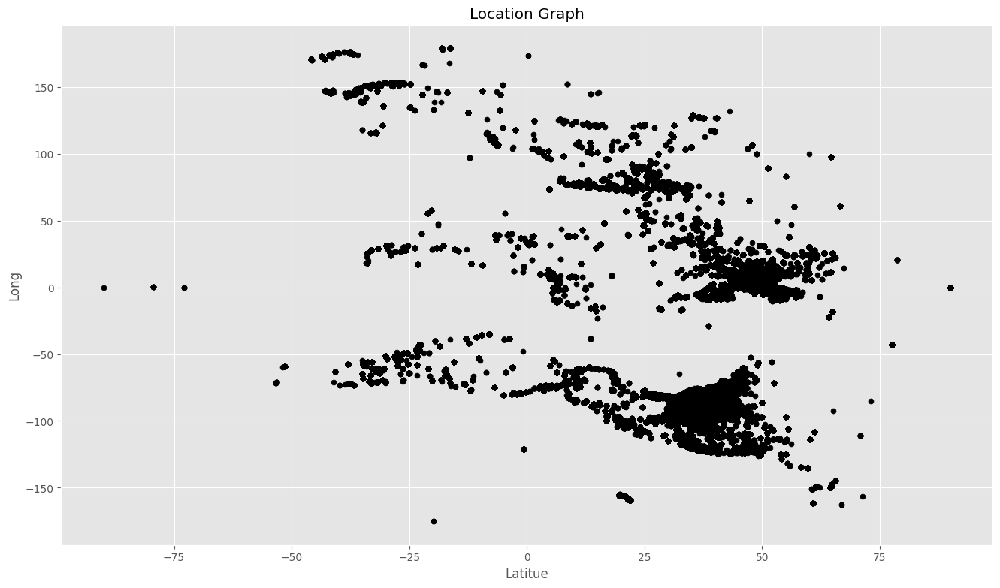

In [ ]:
plt.scatter(hash_tag['lat'], hash_tag['long'], c='black', s=25)
plt.ylabel("Long")
plt.xlabel("Latitue")
plt.title("Location Graph")
plt.show()

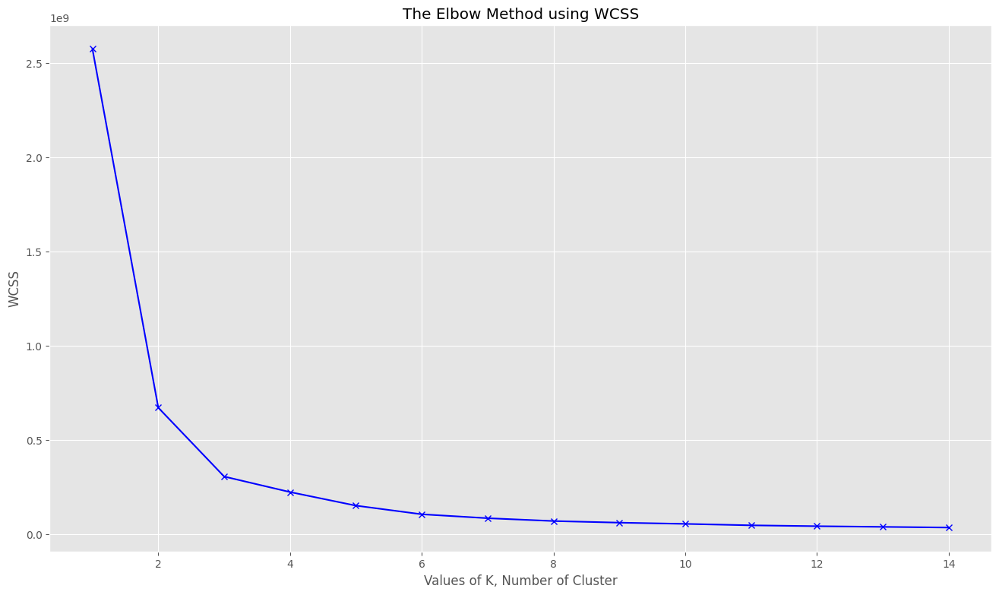

In [ ]:
wcss = [] ### for storing wcss number

## your code goes here

# Hint: intertia_ is an attribute that has the wcss number
X = np.array(list(zip(hash_tag['lat'], hash_tag['long'])))
K = range(1, 15)
for i in K : 
    kmeans = KMeans(n_clusters = i, init = 'k-means++',  random_state = 20)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)

### your code goes here...
plt.plot(K, wcss, 'bx-')
plt.xlabel('Values of K, Number of Cluster')
plt.ylabel('WCSS')
plt.title('The Elbow Method using WCSS')
plt.show()

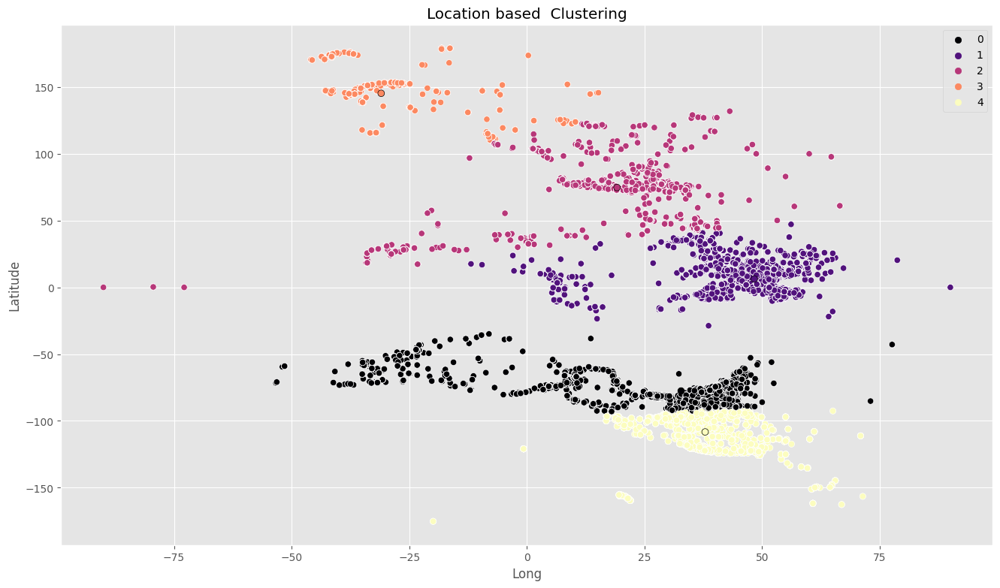

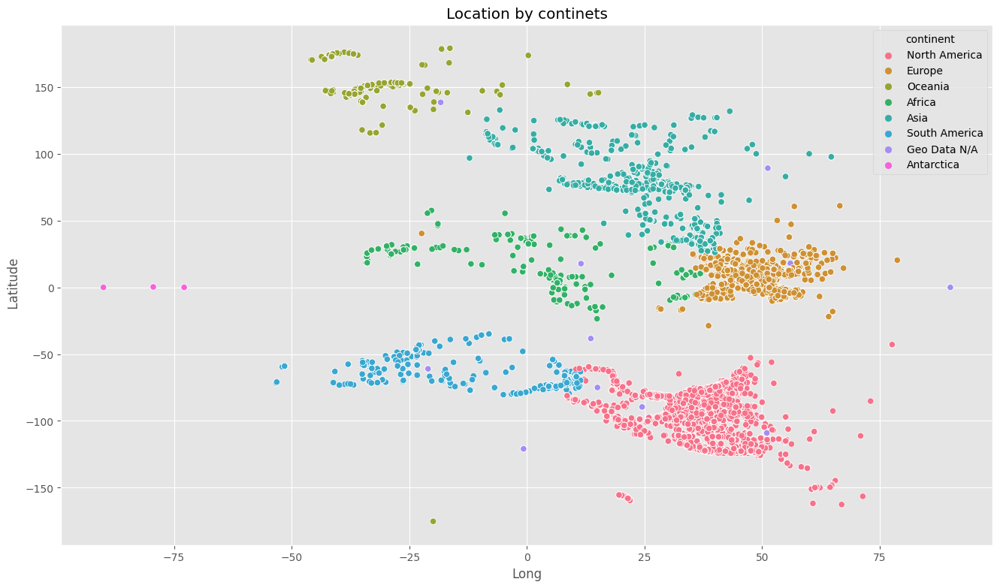

In [ ]:
# your code goes here....
# Value 5 creats elebow shape
k=5
kmeans = KMeans(n_clusters = k, init = "k-means++", random_state = 20)
labels = kmeans.fit_predict(X)

hash_tag['labels']=labels
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 3, len(set(labels))+1)]

ax =sns.scatterplot(data=hash_tag, x="lat", y="long", hue="labels",   palette="magma")
ax = sns.scatterplot(x=kmeans.cluster_centers_[:, 0], y=kmeans.cluster_centers_[:, 1], hue=range(k),  palette="magma", s=40, ec='black', legend=False, ax=ax)
plt.title('Location based  Clustering')
plt.xlabel('Long')
plt.ylabel('Latitude')
plt.legend() 
plt.show()


# create a barplot plotting the average area of properties in each province
plt.figure(figsize=(16, 9))
sns.scatterplot(data=hash_tag, x="lat", y="long", hue="continent")
plt.title('Location by continets')
plt.xlabel("Long")
plt.ylabel(" Latitude")
plt.show()


In [ ]:
hash_tag['sent-cand'] = hash_tag['Candidate']+hash_tag['sentiment_overall']
col =[ 'Candidate', 'splited_days','source' ,'country','continent','sentiment_overall']
for x in col:
  hash_tag[x+'_cat']=hash_tag[x].astype('category')
  hash_tag[x+'_cat'] = hash_tag[x+'_cat'].cat.codes

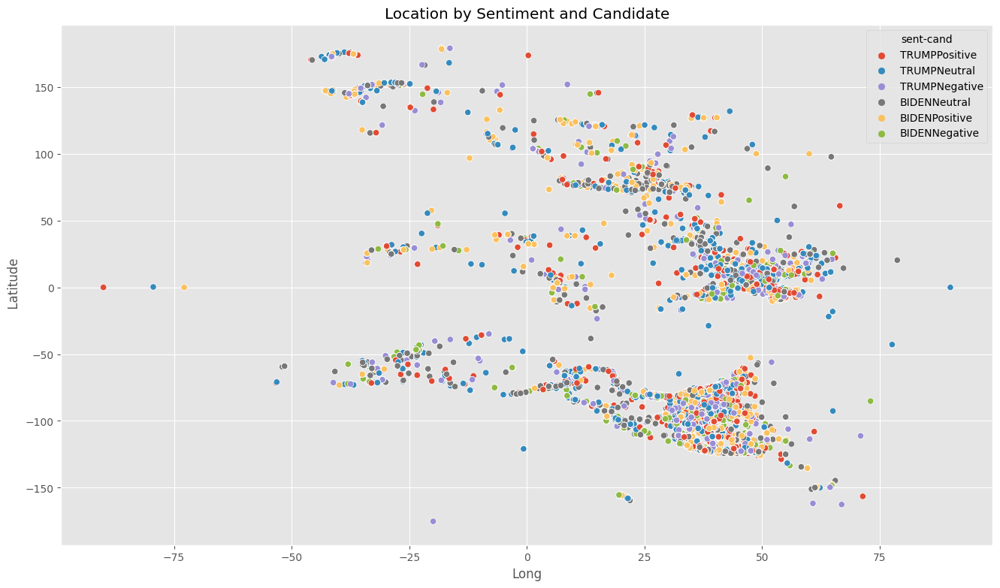

In [ ]:
# create a barplot plotting the average area of properties in each province
plt.figure(figsize=(16, 9))
sns.scatterplot(data=hash_tag, x="lat", y="long", hue="sent-cand")
plt.title('Location by Sentiment and Candidate')
plt.xlabel("Long")
plt.ylabel(" Latitude")
plt.show()


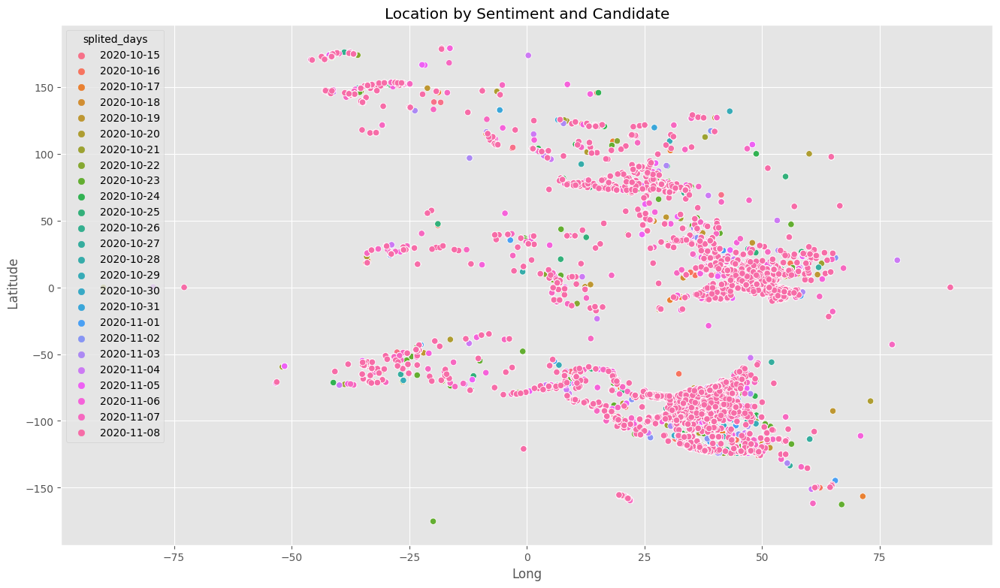

In [ ]:
# create a barplot plotting the average area of properties in each province
plt.figure(figsize=(16, 9))
sns.scatterplot(data=hash_tag, x="lat", y="long", hue="splited_days")
plt.title('Location by Sentiment and Candidate')
plt.xlabel("Long")
plt.ylabel(" Latitude")
plt.show()

In [ ]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

viridis = cm.get_cmap('viridis', 26)
color= viridis(np.linspace(0, 1, 25))

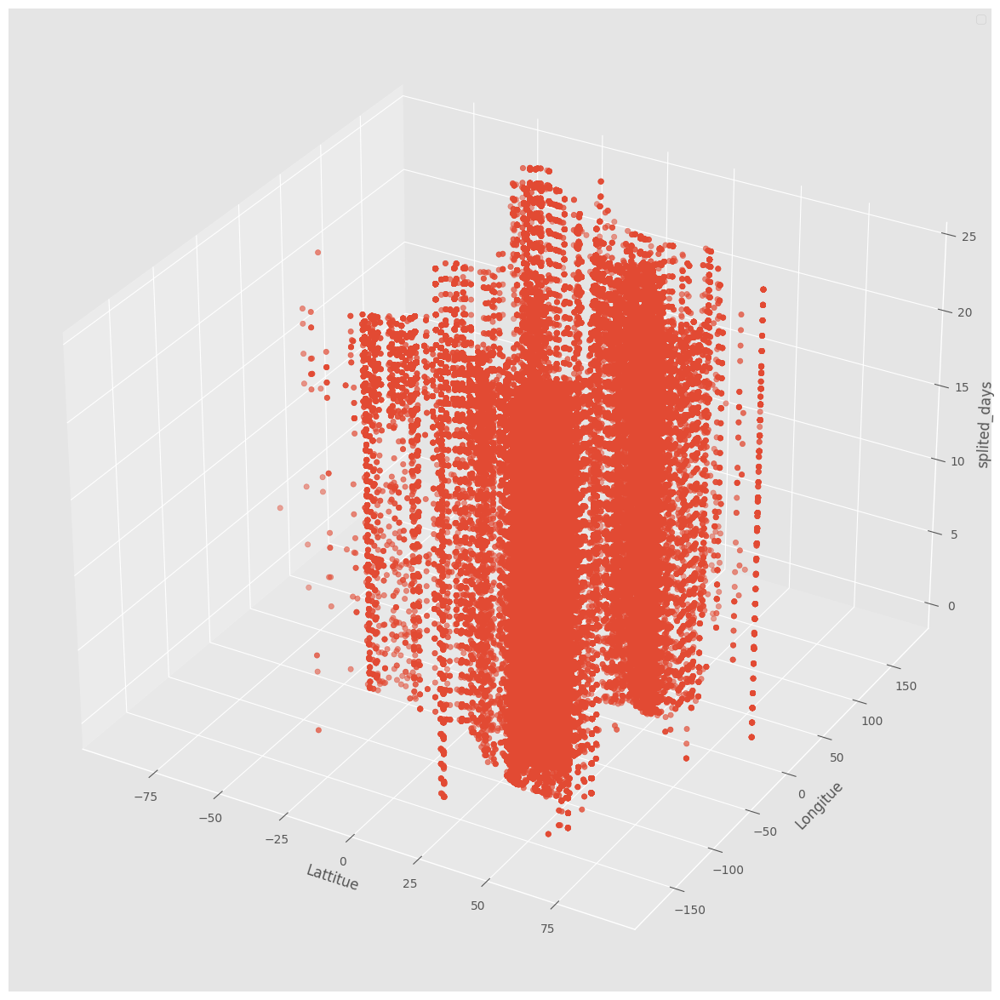

In [ ]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
x=hash_tag['lat'].tolist()
y=hash_tag[ 'long'].tolist()
z=hash_tag[ 'splited_days_cat'].tolist()
ax.scatter(x,y,z)
ax.set_xlabel('Lattitue')
ax.set_ylabel('Longitue')
ax.set_zlabel('splited_days')
ax.legend()
plt.show()

In [ ]:
map_d= hash_tag[['splited_days_cat', 'splited_days']].drop_duplicates()
split_day= dict(zip(map_d['splited_days_cat'], map_d[ 'splited_days']))
del map_d

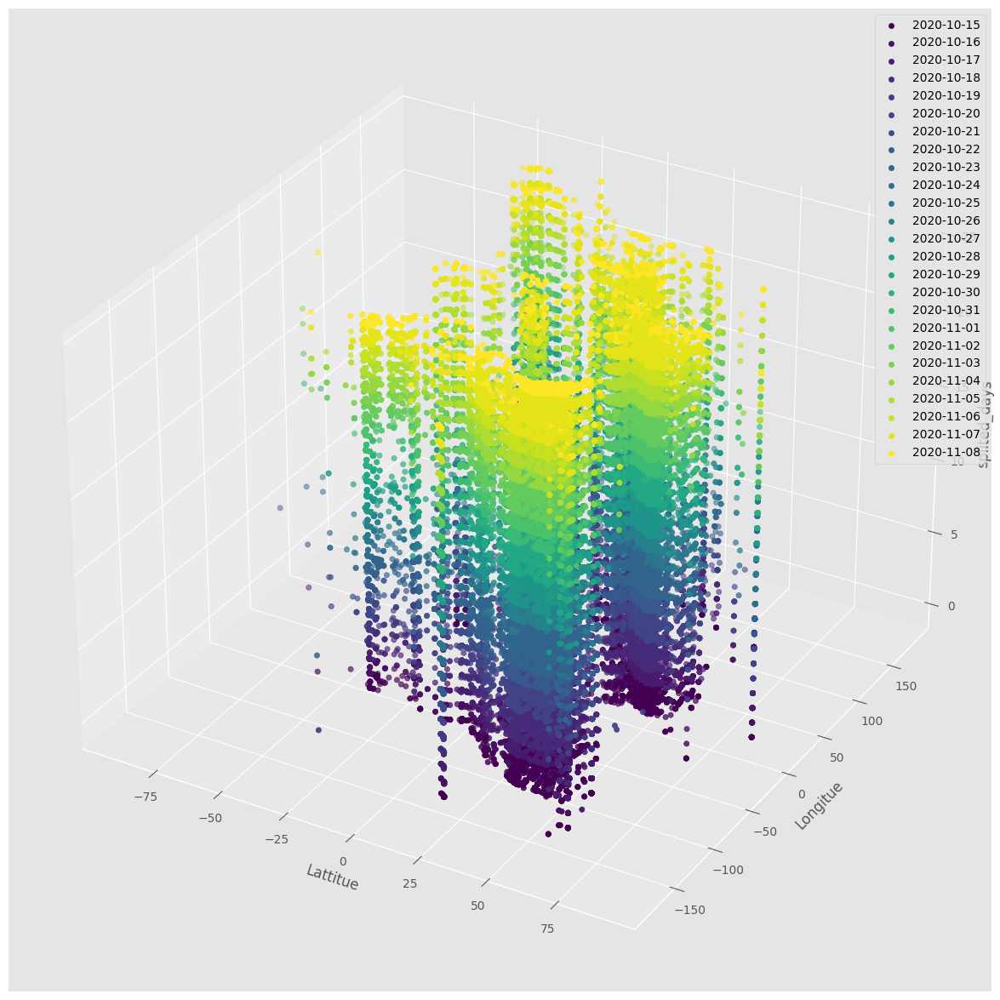

In [ ]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

viridis = cm.get_cmap('viridis', 12)
X = np.array(list(zip(x, y,z)))
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
for count, val in enumerate(set(hash_tag['splited_days_cat'])):
  ax.scatter(X[hash_tag['splited_days_cat'] == val, 0], X[hash_tag['splited_days_cat'] == val, 1] , X[hash_tag['splited_days_cat'] == val, 2],c=color[val],label = split_day[val])
ax.set_xlabel('Lattitue')
ax.set_ylabel('Longitue')
ax.set_zlabel('splited_days')
ax.legend()
plt.show()

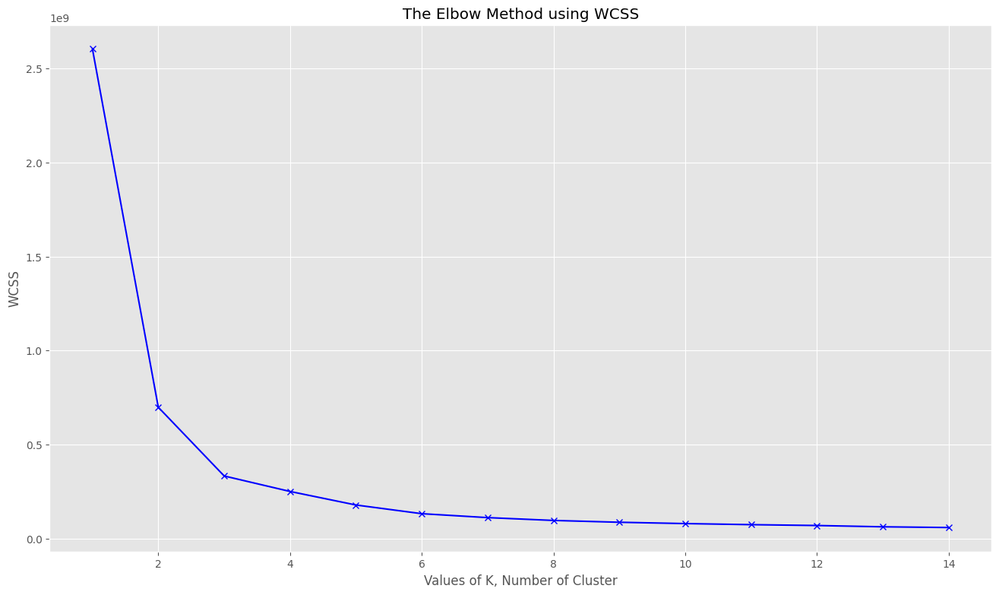

In [ ]:
K = range(1, 15)
wcss=[]
for i in K : 
    kmeans = KMeans(n_clusters = i, init = 'k-means++',  random_state = 20)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)
### your code goes here...
plt.plot(K, wcss, 'bx-')
plt.xlabel('Values of K, Number of Cluster')
plt.ylabel('WCSS')
plt.title('The Elbow Method using WCSS')
plt.show()

In [ ]:
k=3
kmeans = KMeans(n_clusters = k, init = "k-means++", random_state = 20)
labels = kmeans.fit_predict(X)


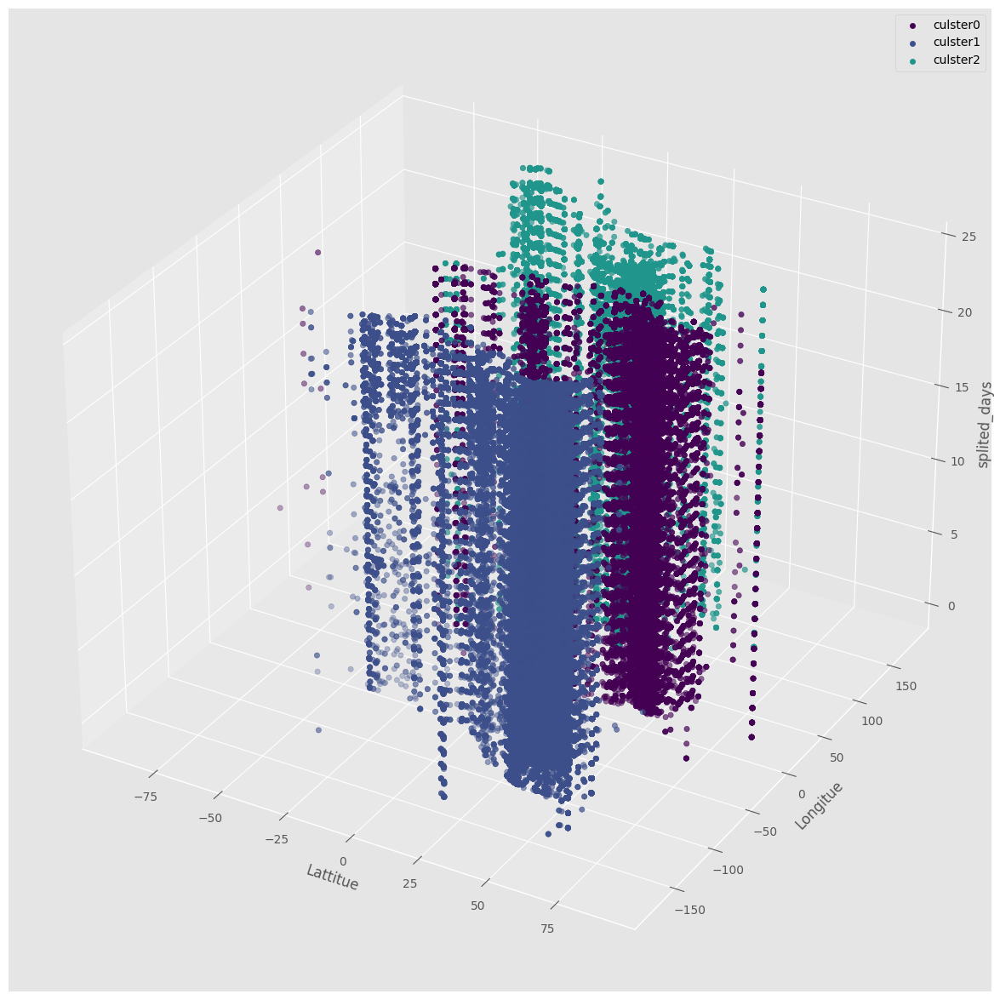

In [ ]:

fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
l=0
for count, val in enumerate(set(labels)):

  ax.scatter(X[labels == val, 0], X[labels == val, 1] , X[labels == val, 2],c=color[val+l],label = 'culster'+ str(val))
  l+=5
ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:,2], marker='*', s=200, c='#050505')

ax.set_xlabel('Lattitue')
ax.set_ylabel('Longitue')
ax.set_zlabel('splited_days')
ax.legend()
plt.show()

In [ ]:
hashes= tweets[tweets['hash_tags_len']!=0][['popular_hastags','long', 'lat']].dropna()
hashes= hashes.explode('popular_hastags').reset_index(drop=True)
hashes['freq'] =hashes['popular_hastags'].apply(lambda x:resultDictionary[x])   
hashes

,popular_hastags,long,lat,freq
0,Trump,-122.674195,45.520247,501797
1,Trump,-77.036558,38.894992,501797
2,Trump,-117.228648,33.782519,501797
3,Trump,-82.688140,40.225357,501797
4,Biden,-109.171431,46.304036,263362
...,...,...,...,...
1086529,DonaldTrump,-100.445882,39.783730,75838
1086530,Trump,-71.619675,-33.045846,501797
1086531,Biden,1.888334,46.603354,263362
1086532,Election2020,1.888334,46.603354,86070


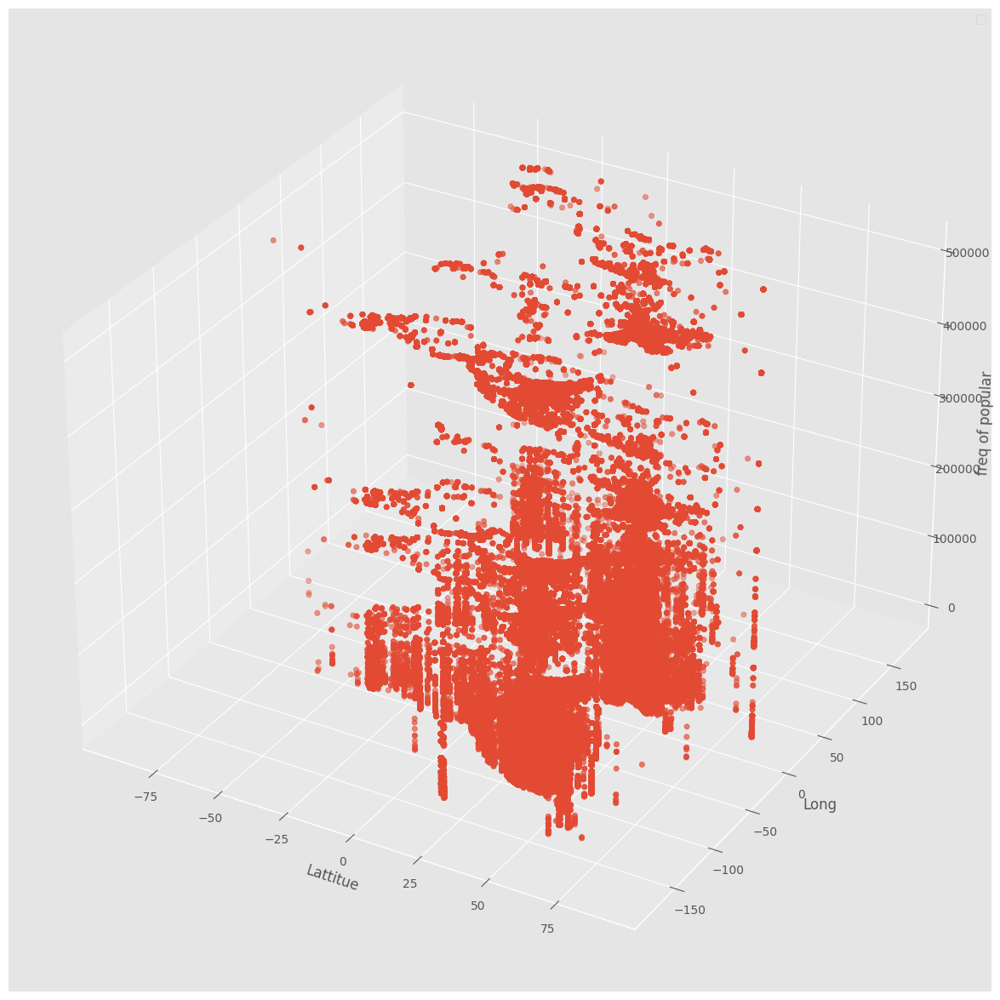

In [ ]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
x=hashes['lat'].tolist()
y=hashes[ 'long'].tolist()
z=hashes[ 'freq'].tolist()

ax.scatter(x,y,z)
ax.set_xlabel('Lattitue')
ax.set_ylabel('Long')
ax.set_zlabel('freq of popular')
ax.legend()
plt.show()

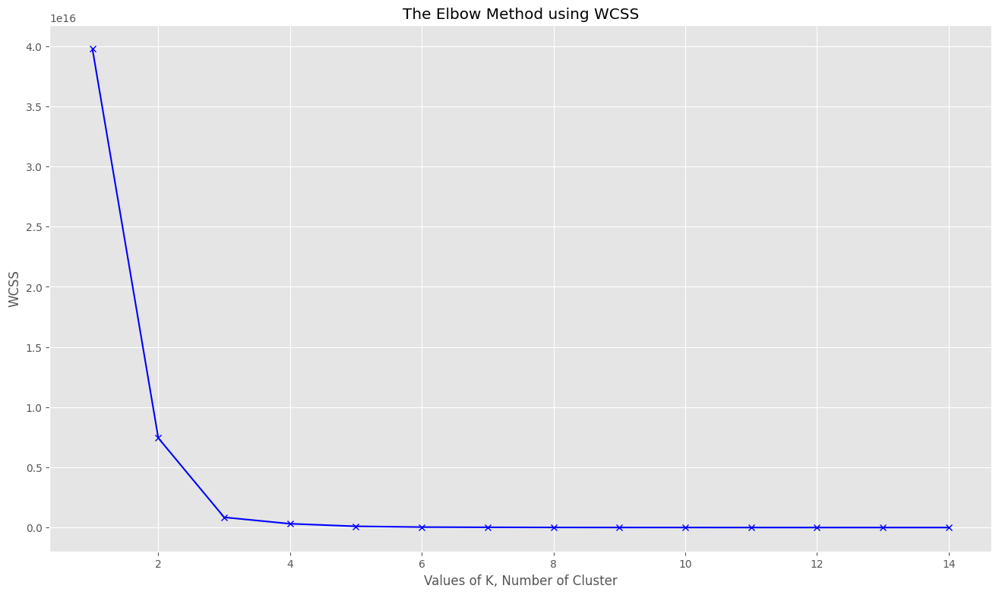

In [ ]:
K = range(1, 15)
X = np.array(list(zip(x, y,z)))
wcss=[]
for i in K : 
    kmeans = KMeans(n_clusters = i, init = 'k-means++',  random_state = 20)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)
### your code goes here...
plt.plot(K, wcss, 'bx-')
plt.xlabel('Values of K, Number of Cluster')
plt.ylabel('WCSS')
plt.title('The Elbow Method using WCSS')
plt.show()

In [ ]:
k=3
kmeans = KMeans(n_clusters = k, init = "k-means++", random_state = 20)
labels = kmeans.fit_predict(X)


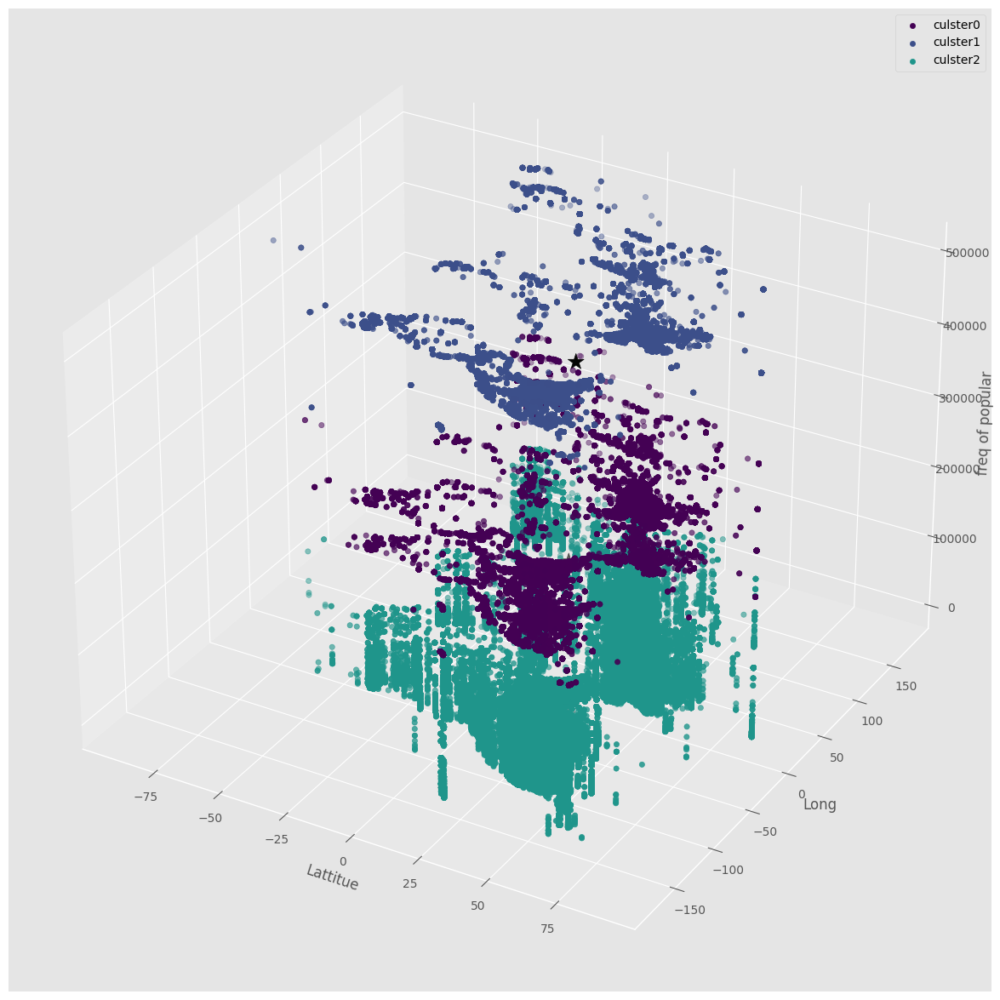

In [ ]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
l=0
for count, val in enumerate(set(labels)):

  ax.scatter(X[labels == val, 0], X[labels == val, 1] , X[labels == val, 2],c=color[val+l],label = 'culster'+ str(val))
  l+=5
ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:,2], marker='*', s=200, c='#050505')

ax.set_xlabel('Lattitue')
ax.set_ylabel('Long')
ax.set_zlabel('freq of popular')
ax.legend()
plt.show()

Text(0, 0.5, 'WCSS')

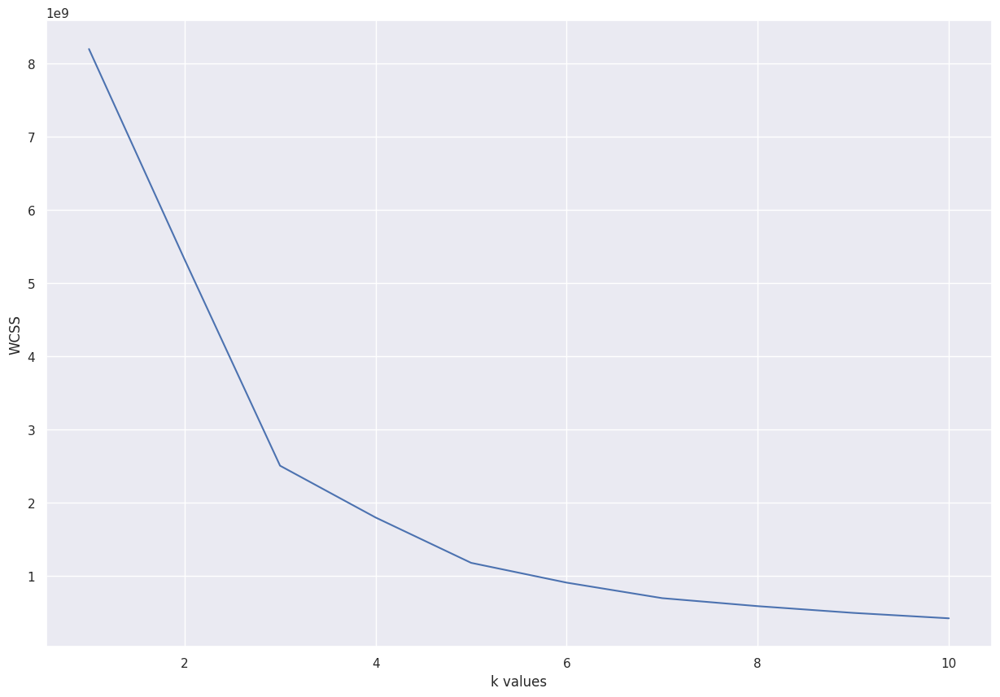

In [ ]:

temp = tweets.loc[:, ['state', 'likes']]
temp = temp.apply(lambda x: pd.factorize(x)[0]).to_numpy()
wcss = []

for k in range(1,11):
    km = KMeans(n_clusters=k, random_state=0)
    km.fit(temp)
    wcss.append(km.inertia_)

plt.plot( range(1,11),wcss)
plt.xlabel("k values")
plt.ylabel("WCSS")

Text(0, 0.5, 'likes')

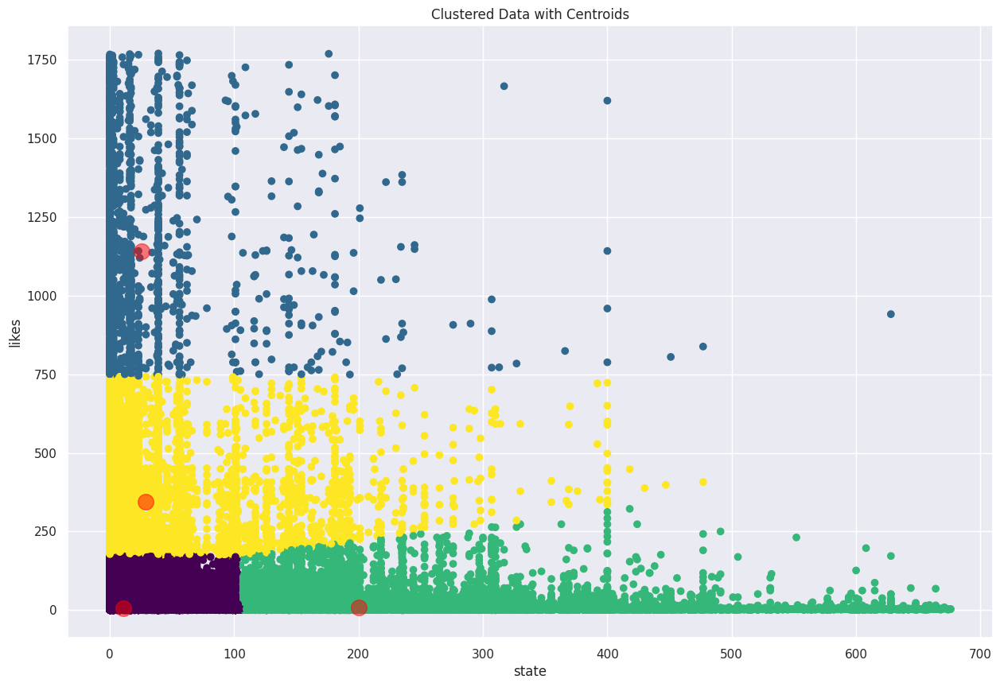

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=0, max_iter=300, n_init=10)
kmeans.fit(temp)
labels = kmeans.predict(temp)

X = pd.DataFrame(temp)

centers = kmeans.cluster_centers_
plt.scatter(X.iloc[:,0], X.iloc[:,1], c=labels, cmap='viridis')
plt.scatter(centers[:,0], centers[:,1], c='red', s=200, alpha=0.5)
plt.title('Clustered Data with Centroids')
plt.xlabel("state")
plt.ylabel("likes")

In [ ]:
tweets.columns

Index(['tweet_id', 'user_screen_name', 'lat', 'long', 'Candidate', 'country',
       'state', 'continent', 'city', 'hash_tags', 'at', 'likes',
       'retweet_count', 'source', 'user_followers_count', 'tweet',
       'created_at', 'splited_days', 'clean_tweet', 'tokens',
       'sentiment_overall', 'days_count', 'source_count', 'country_coun',
       'popular_hastags', 'popular_tokens', 'hash_tags_len', 'join_hastags',
       'join_tok', 'token_tags_len'],
      dtype='object')

In [ ]:
#data = df['tweet'].iloc[1:20000].to_list()
data = tweets[tweets['token_tags_len']!=0]['clean_tweet'].to_list()
# data[1]

from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(data)
wcss = []
for i in range(1,20):
    km = KMeans(n_clusters=i,init='k-means++', max_iter=300, n_init=10, random_state=0)
    km.fit(X)
    wcss.append(km.inertia_)


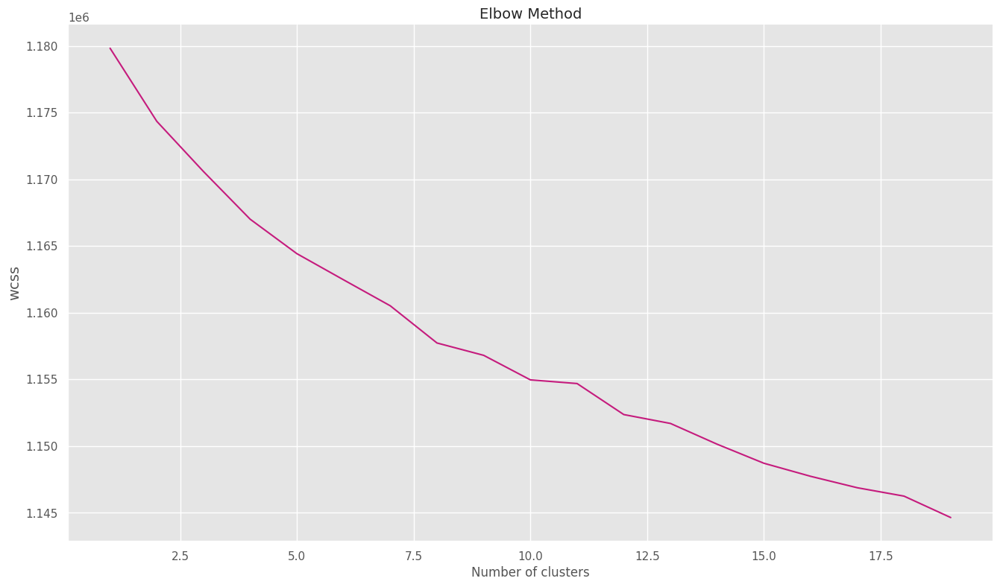

In [ ]:
plt.plot(range(1,20),wcss, c="#c51b7d")
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.title('Elbow Method', size=14)
plt.xlabel('Number of clusters', size=12)
plt.ylabel('wcss', size=14)
plt.show()

Cluster: 0
Titles


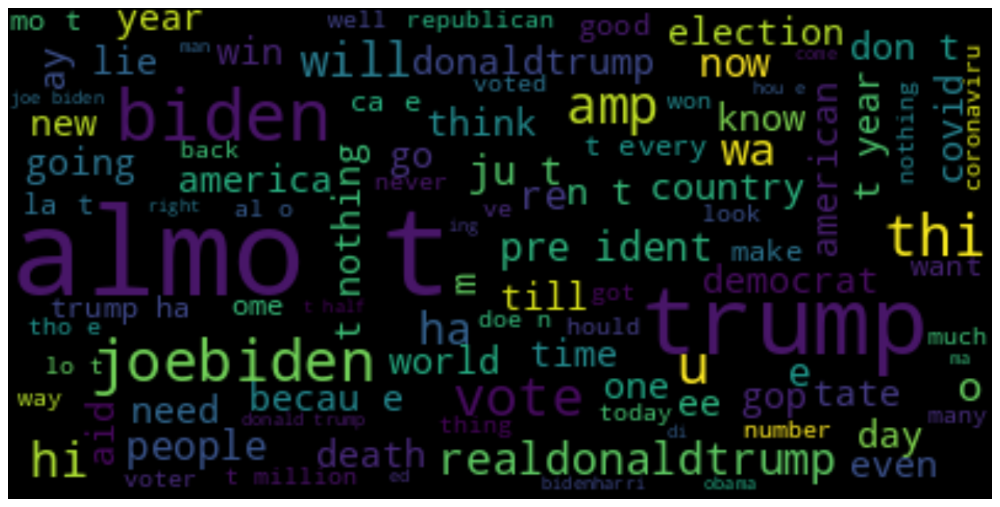

Cluster: 1
Titles


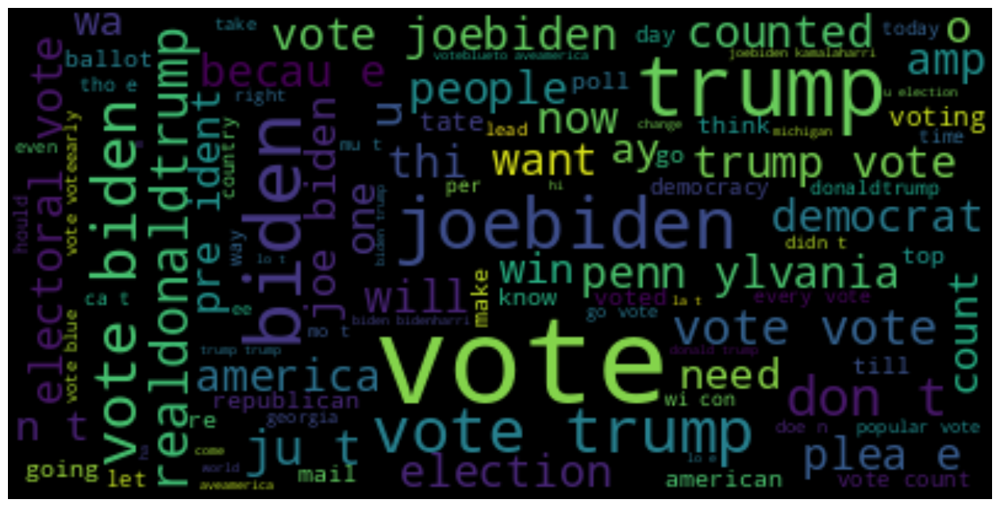

Cluster: 2
Titles


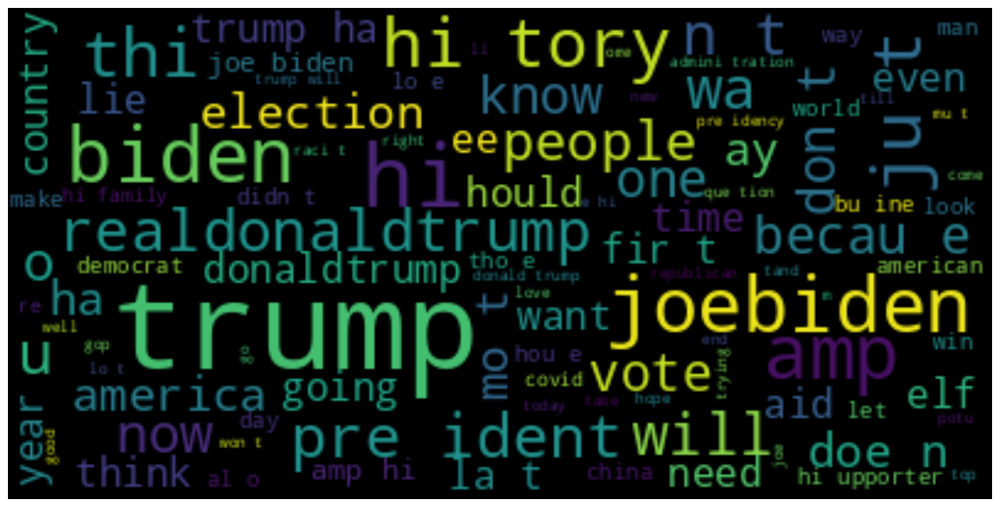

Cluster: 3
Titles


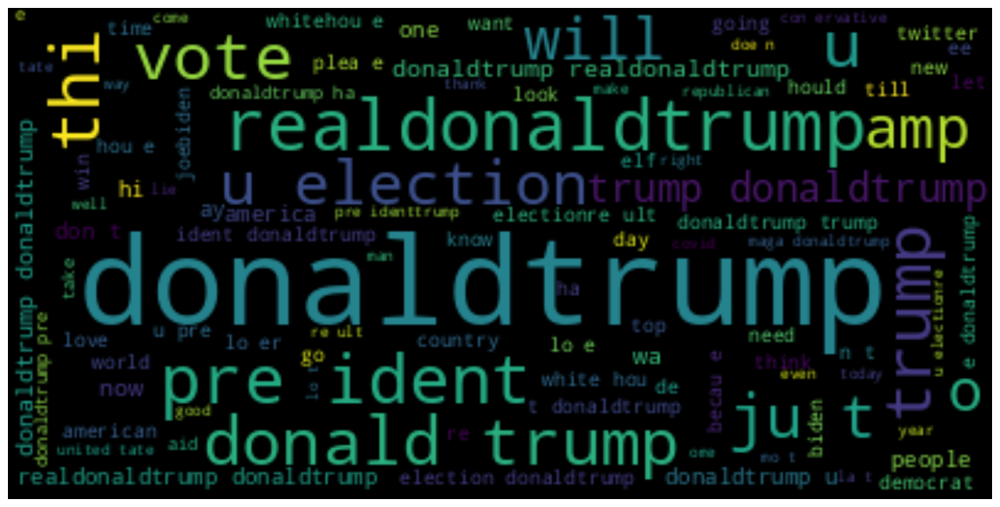

Cluster: 4
Titles


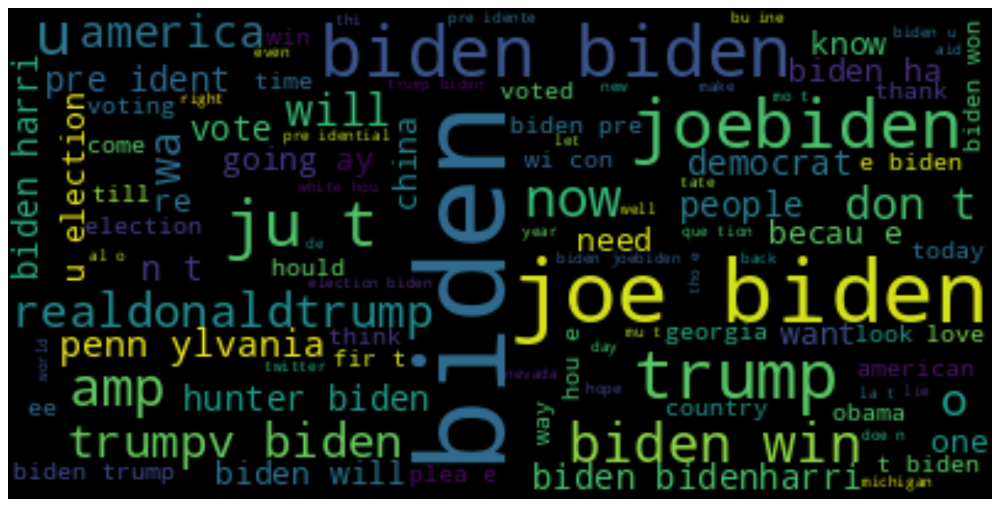

Cluster: 5
Titles


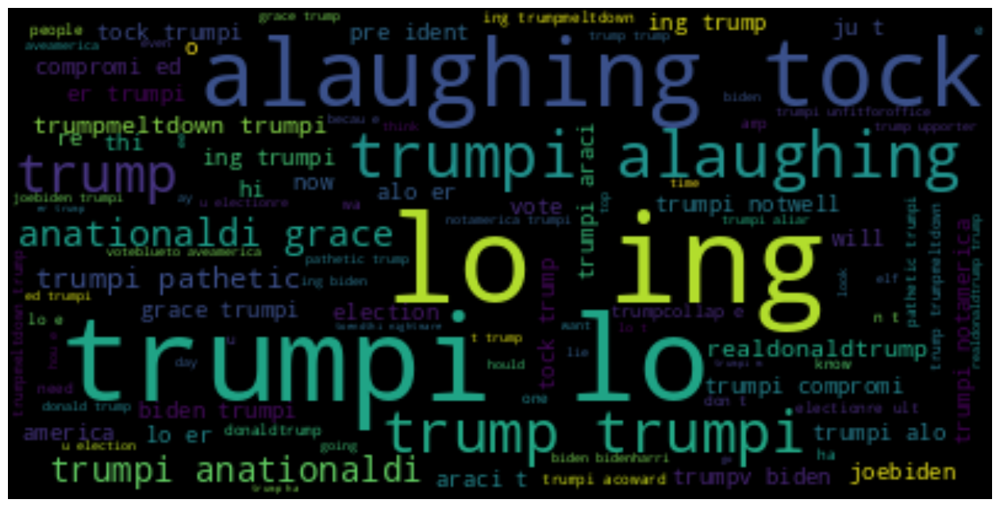

Cluster: 6
Titles


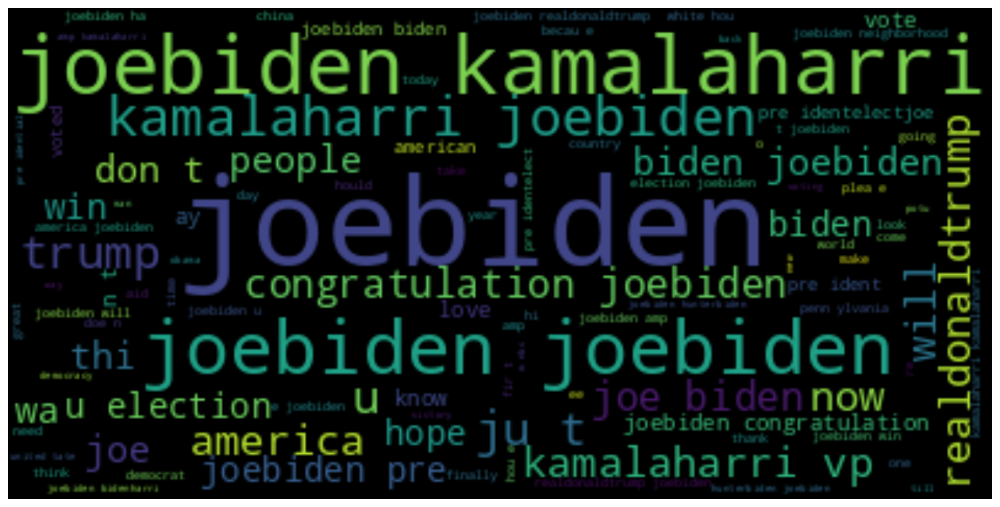

Cluster: 7
Titles


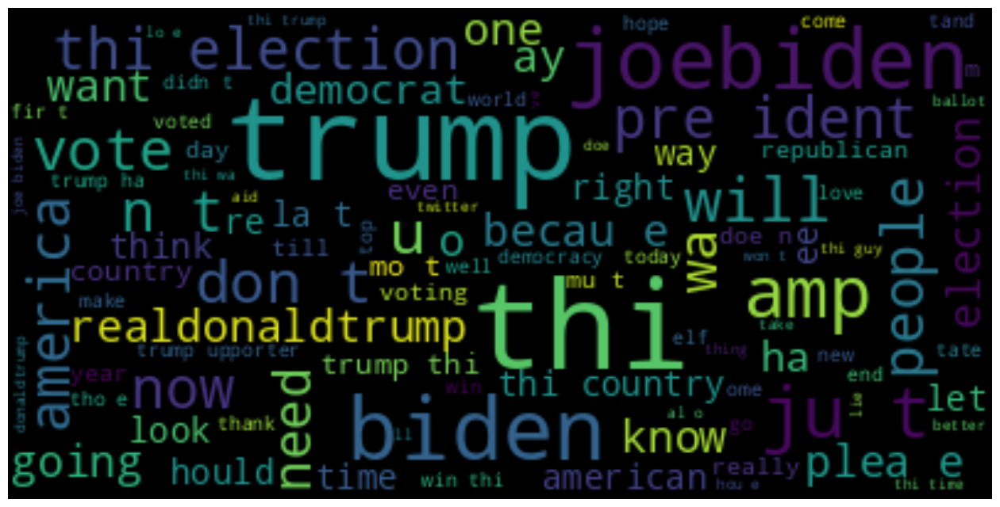

Cluster: 8
Titles


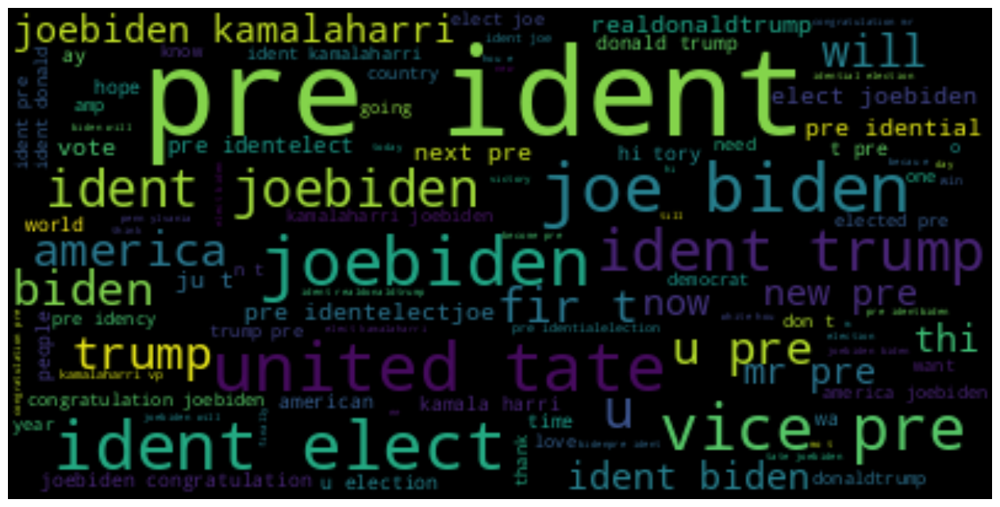

Cluster: 9
Titles


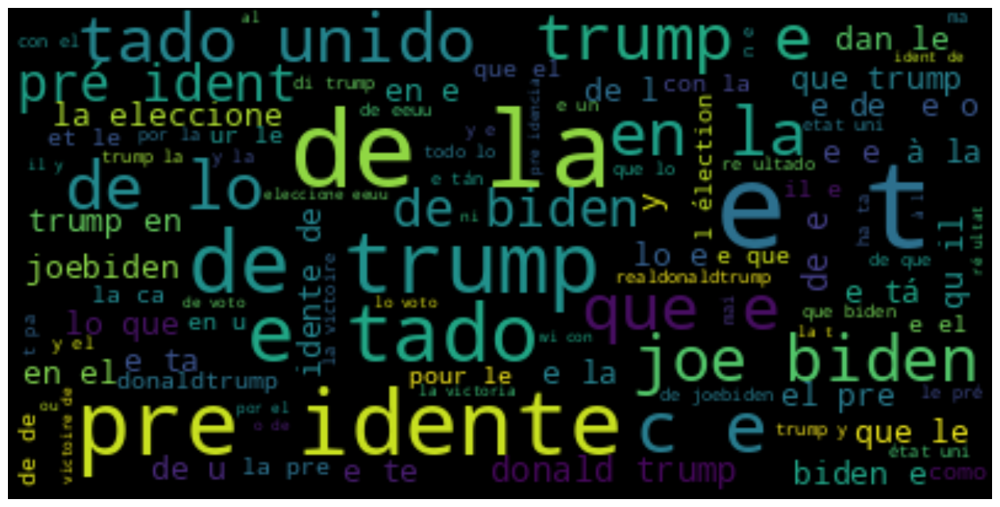

Cluster: 10
Titles


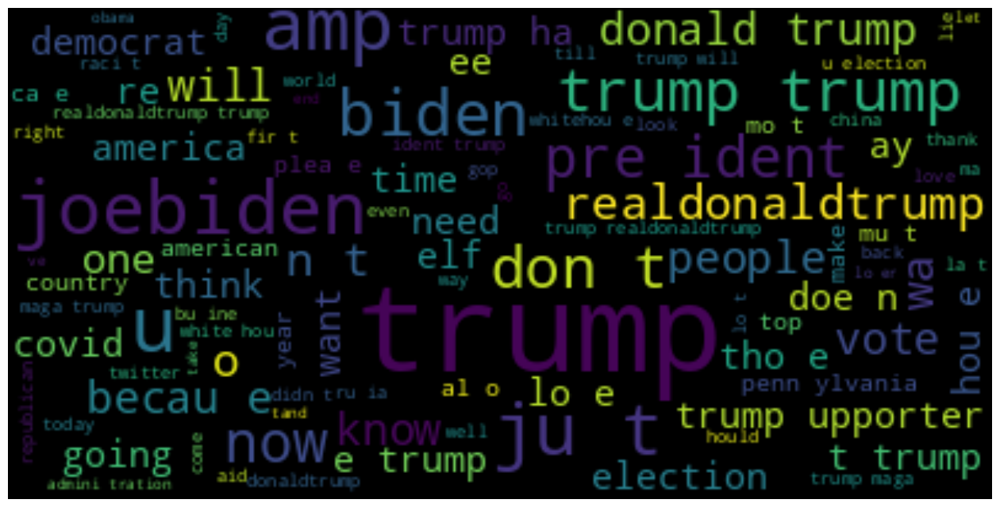

In [ ]:
true_k = 11
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=300, n_init=10)
model.fit(X)
labels=model.labels_
from wordcloud import WordCloud
result={'cluster':labels,'wiki':data}
result=pd.DataFrame(result)
for k in range(0,true_k):
   s=result[result.cluster==k]
   text=s['wiki'].str.cat(sep=' ')
   text=text.lower()
   text=' '.join([word for word in text.split()])
   wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(text)
   print('Cluster: {}'.format(k))
   print('Titles')
   plt.figure()
   plt.imshow(wordcloud, interpolation="bilinear")
   plt.axis("off")
   plt.show()
   

Text(0, 0.5, 'WCSS')

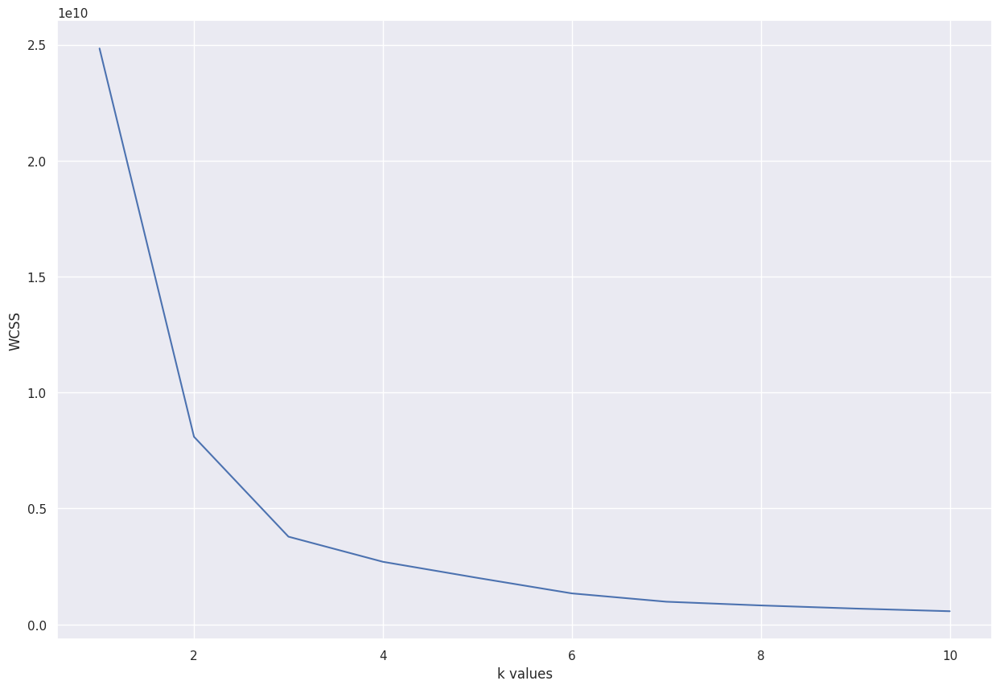

In [ ]:
temp = tweets.loc[:, ['city', 'source']]
temp = temp.apply(lambda x: pd.factorize(x)[0]).to_numpy()

wcss = []

for k in range(1,11):
    km = KMeans(n_clusters=k, random_state=0)
    km.fit(temp)
    wcss.append(km.inertia_)
plt.plot(range(1,11),wcss)
plt.xlabel("k values")
plt.ylabel("WCSS")

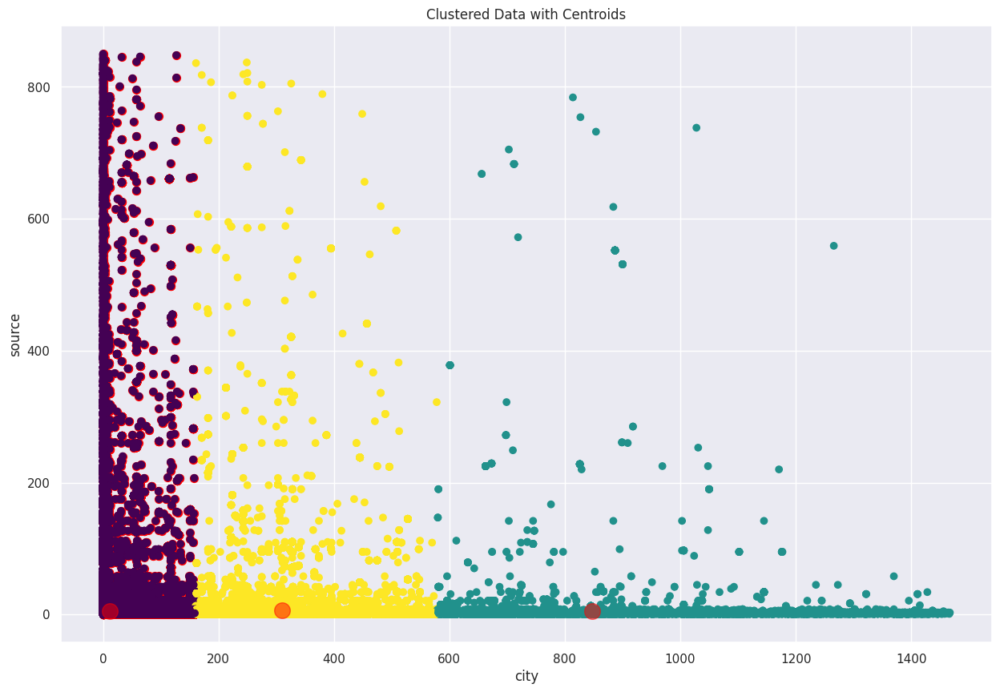

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=0, max_iter=300, n_init=10)
kmeans.fit(temp)
labels = kmeans.predict(temp)

X = temp
del temp
plt.scatter(X[labels == 0,0], X[labels == 0,1], s = 50, c = 'red', label = 'Country')

X = pd.DataFrame(X)

centers = kmeans.cluster_centers_
plt.scatter(X.iloc[:,0], X.iloc[:,1], c=labels, cmap='viridis')
plt.scatter(centers[:,0], centers[:,1], c='red', s=200, alpha=0.5)
plt.title('Clustered Data with Centroids')
plt.xlabel("city")
plt.ylabel("source")
plt.show()
del X

Text(0, 0.5, 'WCSS')

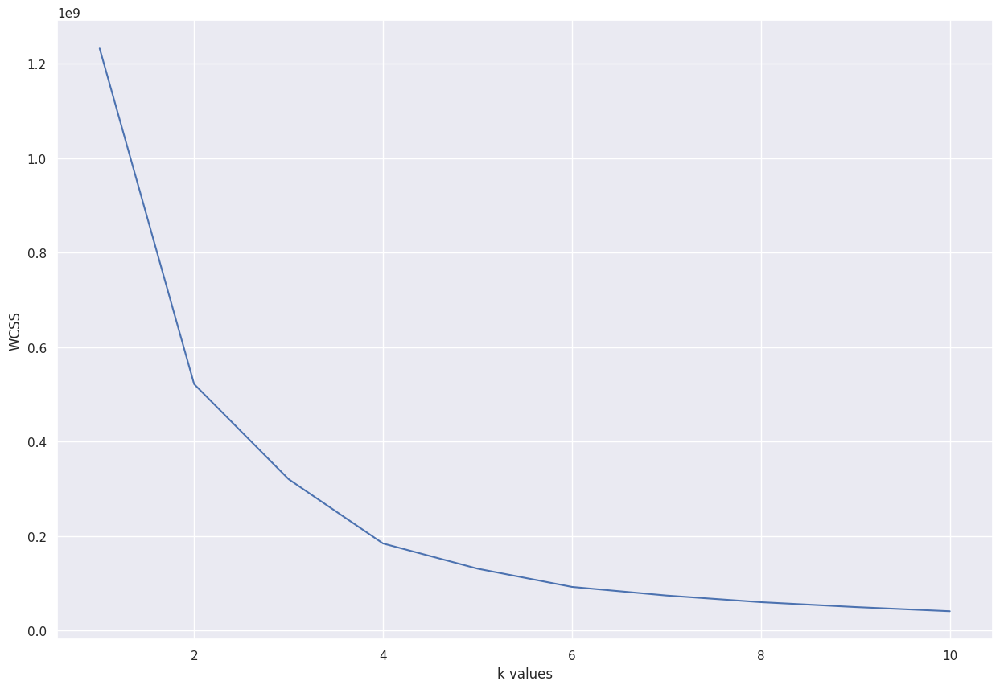

In [ ]:
temp = tweets.loc[:, ['country', 'source']]
temp = temp.apply(lambda x: pd.factorize(x)[0]).to_numpy()
wcss = []

for k in range(1,11):
    km = KMeans(n_clusters=k, random_state=0)
    km.fit(temp)
    wcss.append(km.inertia_)
plt.plot(range(1,11),wcss)
plt.xlabel("k values")
plt.ylabel("WCSS")

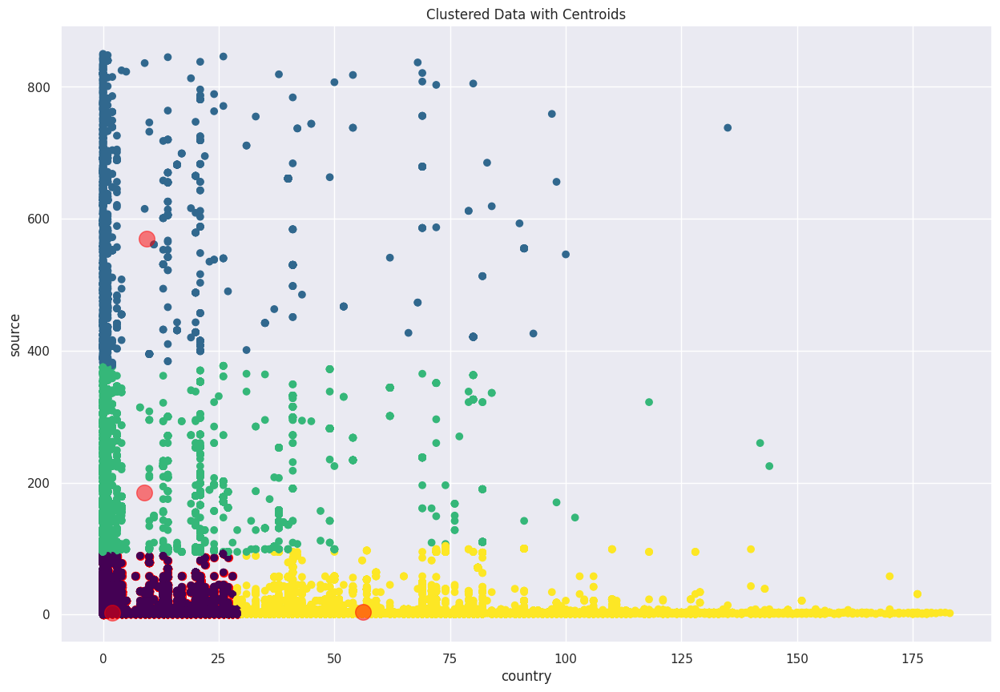

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=0, max_iter=300, n_init=10)
kmeans.fit(temp)
labels = kmeans.predict(temp)

X = temp
del temp
plt.scatter(X[labels == 0,0], X[labels == 0,1], s = 50, c = 'red', label = 'Country')

X = pd.DataFrame(X)

centers = kmeans.cluster_centers_
plt.scatter(X.iloc[:,0], X.iloc[:,1], c=labels, cmap='viridis')
plt.scatter(centers[:,0], centers[:,1], c='red', s=200, alpha=0.5)
plt.title('Clustered Data with Centroids')
plt.xlabel("country")
plt.ylabel("source")
del X

In [ ]:
data = tweets['popular_tokens'].iloc[1:20000].to_list()
# data = df['tweet'].to_list()
# data[1]

from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(data)
wcss = []
for i in range(1,25):
    km = KMeans(n_clusters=i,init='k-means++', max_iter=300, n_init=10, random_state=0)
    km.fit(X)
    wcss.append(km.inertia_)
plt.plot(range(1,25),wcss, c="#c51b7d")
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.title('Elbow Method', size=14)
plt.xlabel('Number of clusters', size=12)
plt.ylabel('wcss', size=14)
plt.show()

##DB_SCAN

Outliers:  394
Outliers:  394


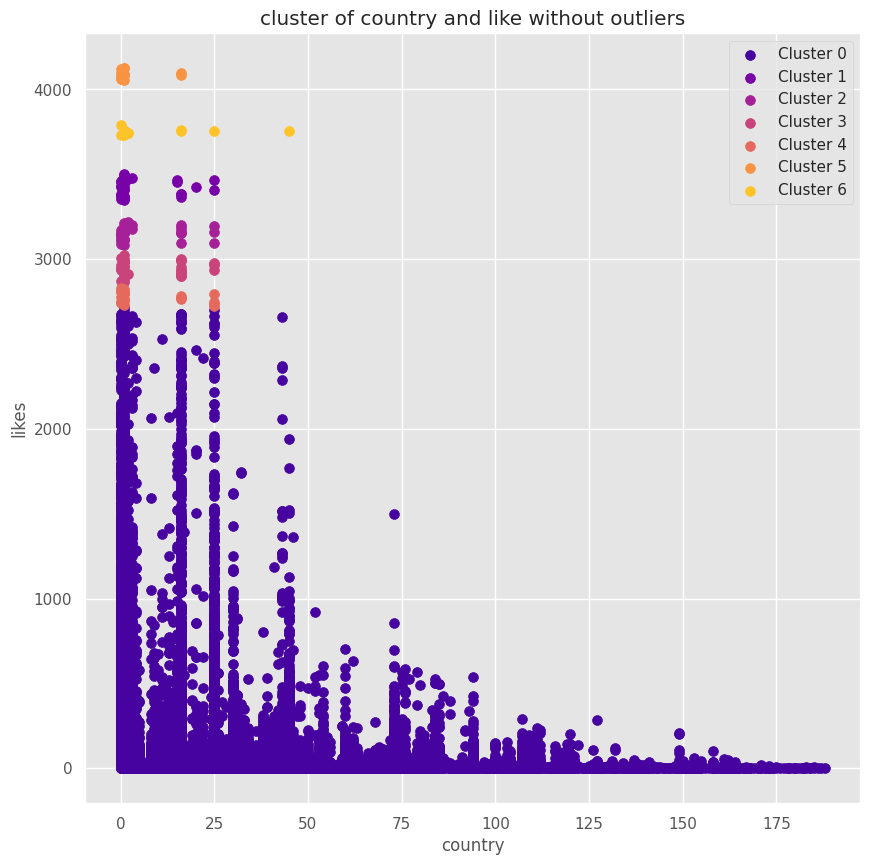

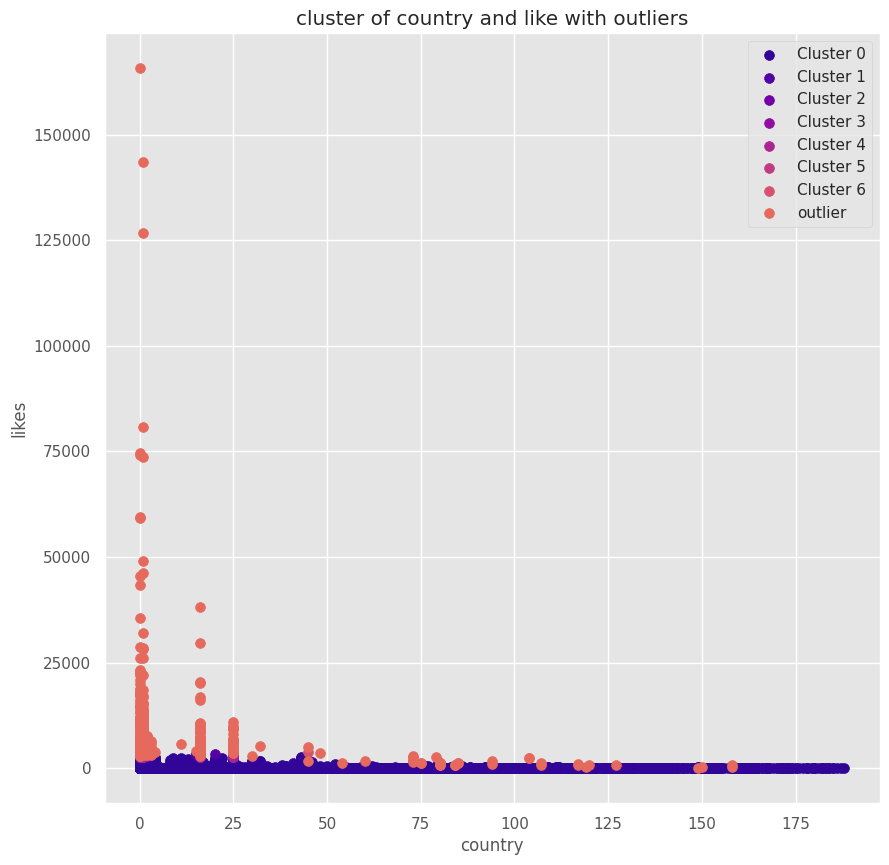

In [ ]:
from sklearn.cluster import DBSCAN 
import seaborn as sns
from sklearn.preprocessing import StandardScaler

#temp = tweets.loc[:, ['country', 'likes']].iloc[1:20000]
temp = df.loc[:, ['country', 'likes']].drop_duplicates()
factorized_name = pd.factorize(temp['country'])[0]
temp = pd.DataFrame({'factorized_name': factorized_name, 'likes': temp['likes']}).to_numpy()


X = temp
dbscan = DBSCAN(eps=30,min_samples=10,metric='euclidean')
# dbscan.fit(temp.reshape(-1, 1))
dbscan.fit(temp)
labels = dbscan.labels_

print("Outliers: ",labels.tolist().count(-1))


print("Outliers: ",labels.tolist().count(-1))



viridis = cm.get_cmap('plasma', len(set(labels))*8)
color= viridis(np.linspace(0, 1,  len(set(labels))*8))
plt.figure(figsize=(10,10))


l=0
for count, x in enumerate(set(labels)):
  l+=7

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))


plt.legend()
plt.xlabel('country')
plt.ylabel('likes')
plt.title('cluster of country and like without outliers')
plt.show()

l=0
plt.figure(figsize=(10,10))
for count, x in enumerate(set(labels)):
  l+=4

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))
  else:
         plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'outlier')




plt.xlabel('country')
plt.ylabel('likes')
plt.title('cluster of country and like with outliers')
plt.legend()
plt.show()

In [ ]:
del temp
del X

Outliers:  39030


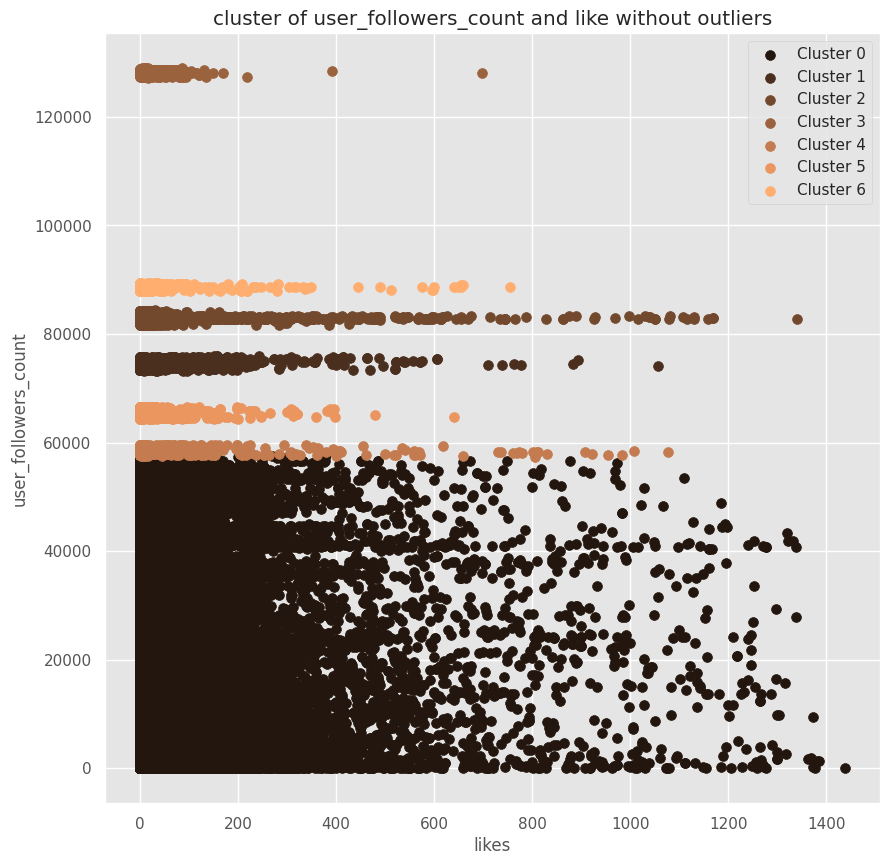

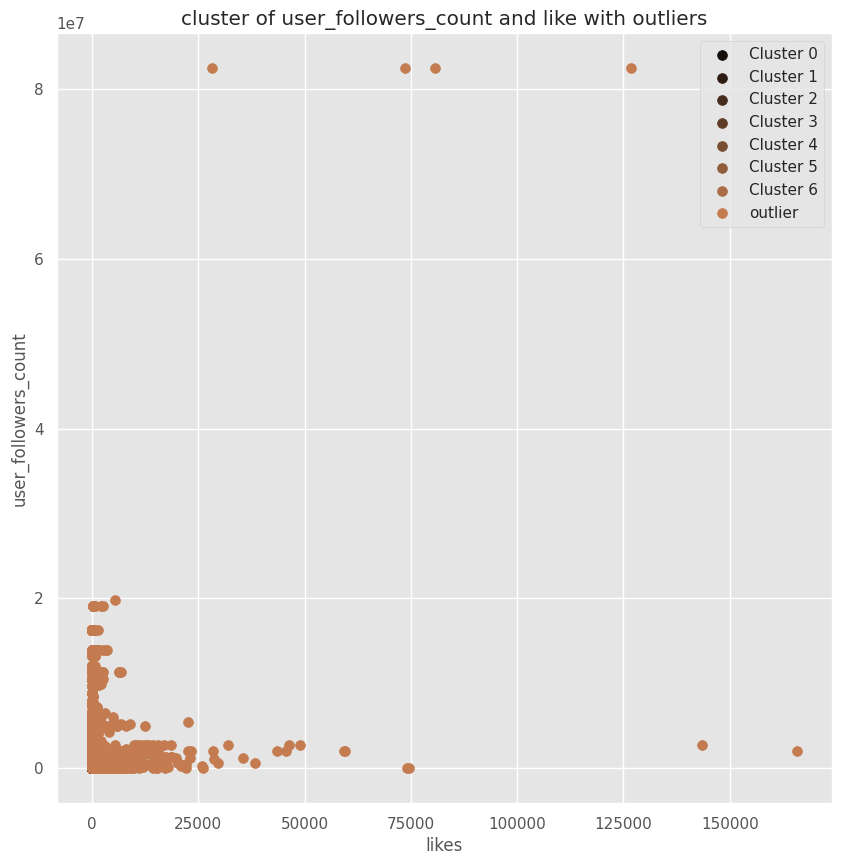

In [ ]:
from sklearn.cluster import DBSCAN 
import seaborn as sns
from sklearn.preprocessing import StandardScaler

#temp = df.loc[1:20000, ['likes', 'user_followers_count']].to_numpy()
temp = df.loc[:, ['likes', 'user_followers_count']].drop_duplicates().to_numpy()

X = temp
dbscan = DBSCAN(eps=700,min_samples=500,metric='euclidean')
dbscan.fit(temp)
labels = dbscan.labels_

print("Outliers: ",labels.tolist().count(-1))



viridis = cm.get_cmap('copper', len(set(labels))*8)
color= viridis(np.linspace(0, 1,  len(set(labels))*8))
plt.figure(figsize=(10,10))


l=0
for count, x in enumerate(set(labels)):
  l+=7

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))


plt.legend()
plt.xlabel('likes')
plt.ylabel('user_followers_count')
plt.title('cluster of user_followers_count and like without outliers')
plt.show()

l=0
plt.figure(figsize=(10,10))
for count, x in enumerate(set(labels)):
  l+=4

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))
  else:
         plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'outlier')


plt.legend()
plt.xlabel('likes')
plt.ylabel('user_followers_count')
plt.title('cluster of user_followers_count and like with outliers')
plt.show()


del temp
del X

Outliers:  2009


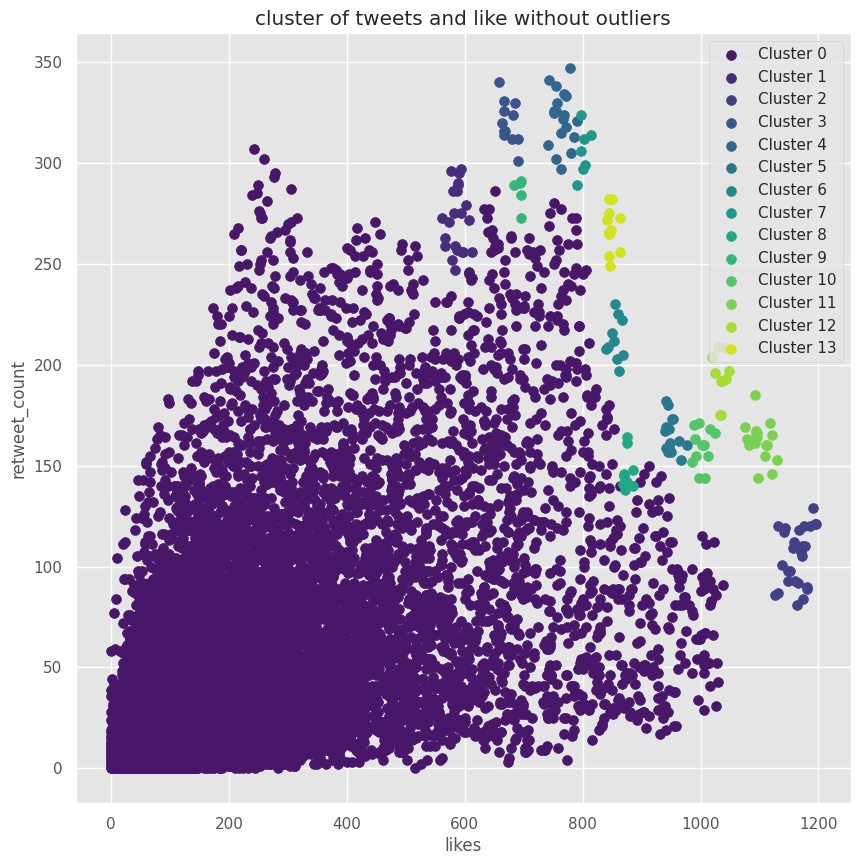

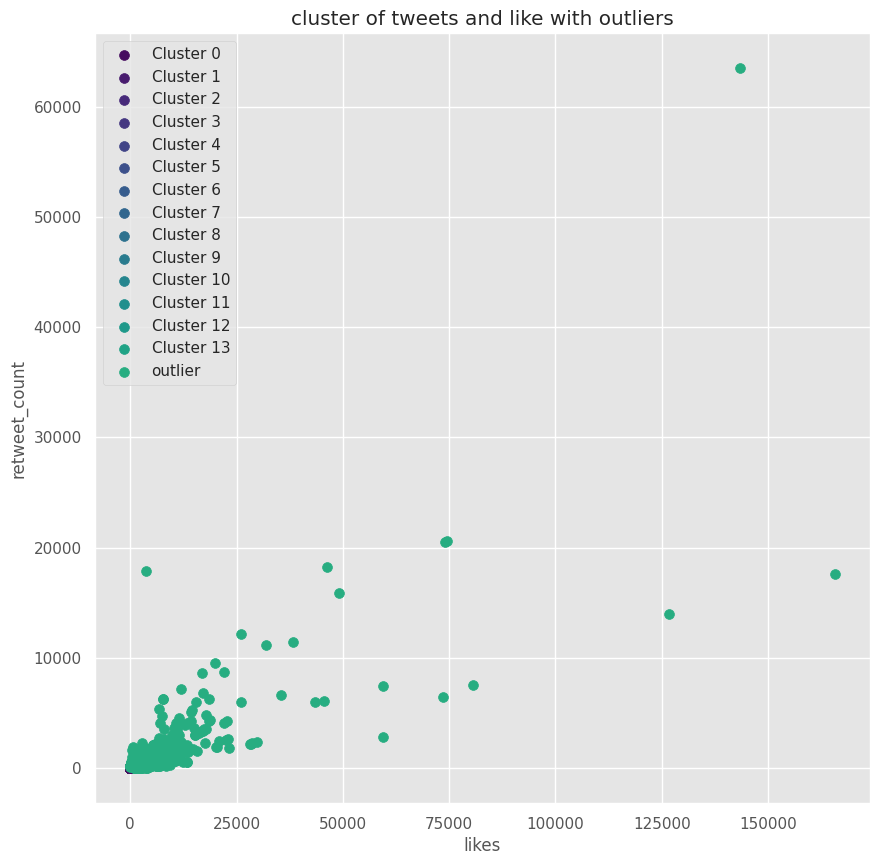

In [ ]:
from sklearn.cluster import DBSCAN 
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# temp = df.loc[1:20000, ['likes', 'retweet_count']].to_numpy()
temp = df.loc[:, ['likes', 'retweet_count']].drop_duplicates().to_numpy()

X = temp
dbscan = DBSCAN(eps=20,min_samples=10,metric='euclidean')
dbscan.fit(temp)
labels = dbscan.labels_


print("Outliers: ",labels.tolist().count(-1))
viridis = cm.get_cmap('viridis', len(set(labels))*8)
color= viridis(np.linspace(0, 1,  len(set(labels))*8))
plt.figure(figsize=(10,10))


l=0
for count, x in enumerate(set(labels)):
  l+=7

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))


plt.legend()
plt.xlabel('likes')
plt.ylabel('retweet_count')
plt.title('cluster of tweets and like without outliers')
plt.show()

l=0
plt.figure(figsize=(10,10))
for count, x in enumerate(set(labels)):
  l+=4

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))
  else:
         plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'outlier')


plt.legend()
plt.xlabel('likes')
plt.ylabel('retweet_count')
plt.title('cluster of tweets and like with outliers')
plt.show()

Outliers:  31435


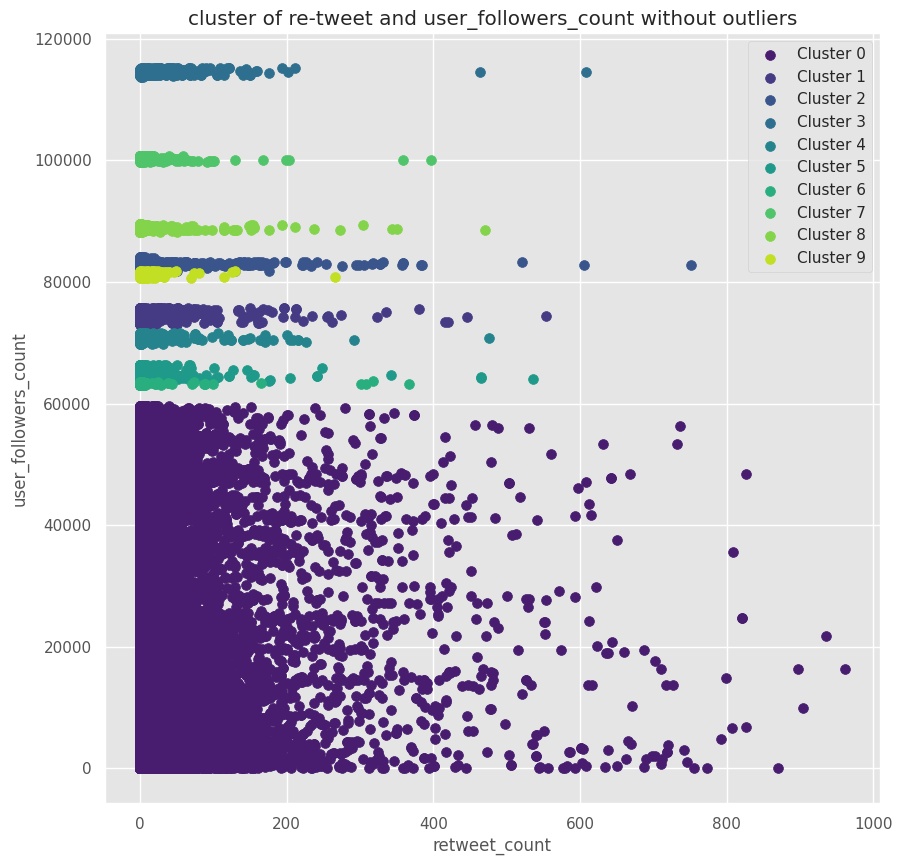

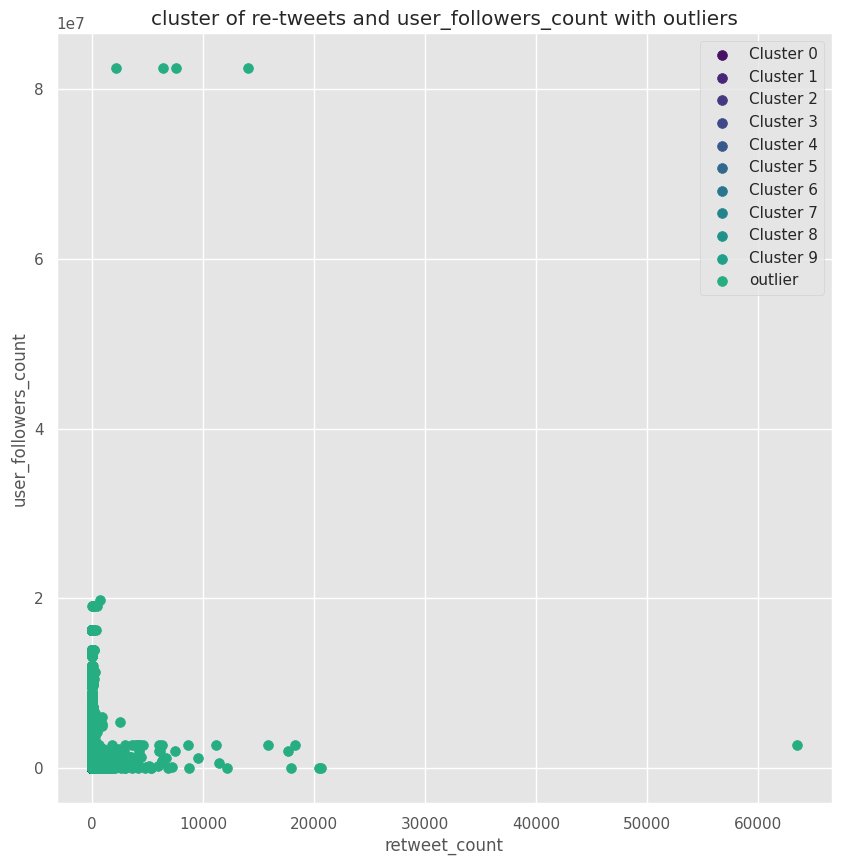

In [ ]:

# temp = df.loc[1:20000, ['retweet_count', 'user_followers_count']].to_numpy()
temp = df.loc[:, ['retweet_count', 'user_followers_count']].drop_duplicates().to_numpy()

X = temp
dbscan = DBSCAN(eps=500,min_samples=270,metric='euclidean')
dbscan.fit(temp)
labels = dbscan.labels_

print("Outliers: ",labels.tolist().count(-1))
viridis = cm.get_cmap('viridis', len(set(labels))*8)
color= viridis(np.linspace(0, 1,  len(set(labels))*8))
plt.figure(figsize=(10,10))


l=0
for count, x in enumerate(set(labels)):
  l+=7

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))


plt.legend()
plt.ylabel('user_followers_count')
plt.xlabel('retweet_count')
plt.title('cluster of re-tweet and user_followers_count without outliers')
plt.show()

l=0
plt.figure(figsize=(10,10))
for count, x in enumerate(set(labels)):
  l+=4

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))
  else:
         plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'outlier')


plt.legend()
plt.ylabel('user_followers_count')
plt.xlabel('retweet_count')
plt.title('cluster of re-tweets and user_followers_count with outliers')
plt.show()

[0 0 0 ... 0 6 0]
Outliers:  271
Outliers:  271


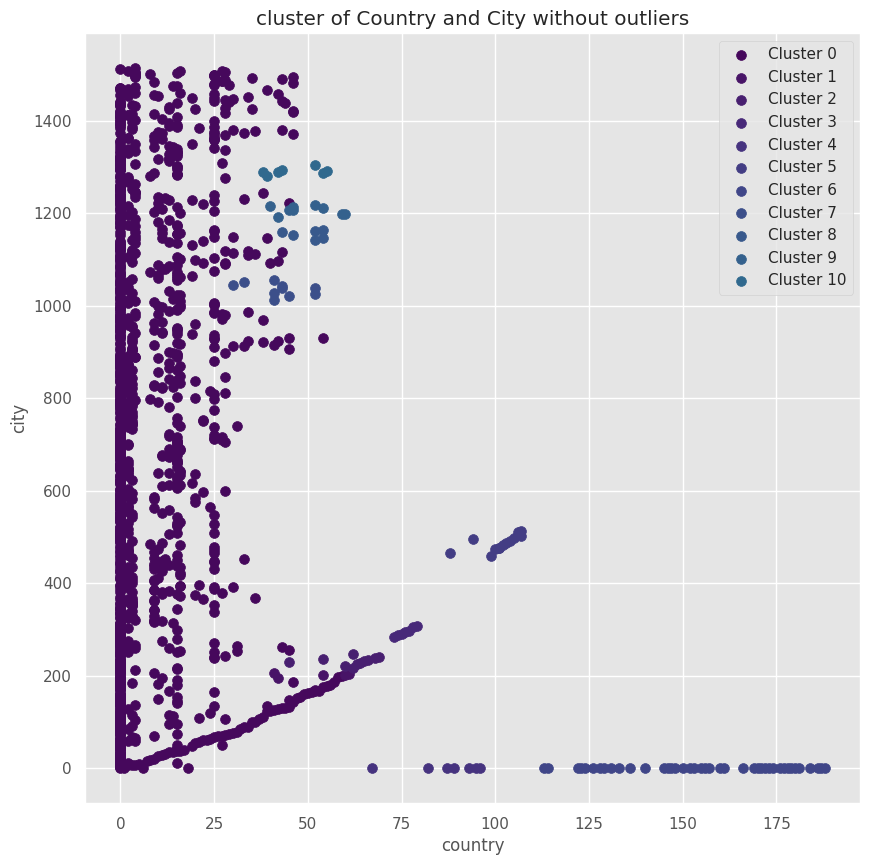

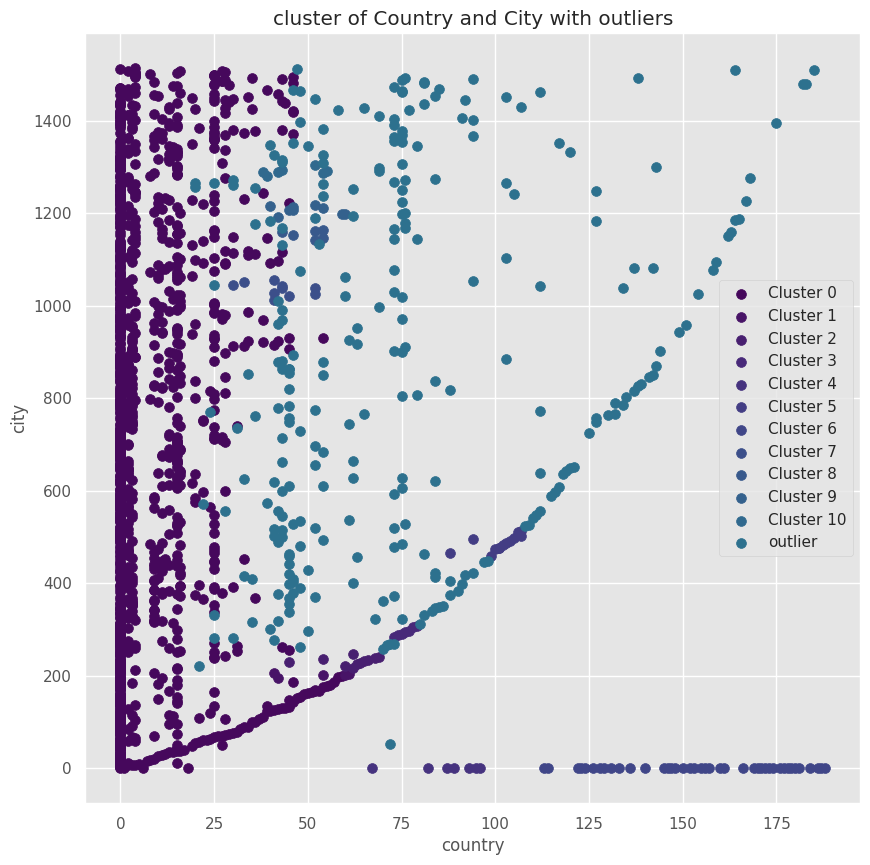

In [ ]:
from sklearn.cluster import DBSCAN 
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# temp = df.loc[1:20000, ['country', 'city']]
temp = df.loc[:, ['country', 'city']].drop_duplicates()
temp = temp.apply(lambda x: pd.factorize(x)[0]).to_numpy()

X = temp
dbscan = DBSCAN(eps=15,min_samples=7,metric='euclidean')
dbscan.fit(temp)
labels = dbscan.labels_

print(labels)
print("Outliers: ",labels.tolist().count(-1))



print("Outliers: ",labels.tolist().count(-1))
viridis = cm.get_cmap('viridis', len(set(labels))*8)
color= viridis(np.linspace(0, 1,  len(set(labels))*8))
plt.figure(figsize=(10,10))


l=0
for count, x in enumerate(set(labels)):
  l+=2

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))


plt.legend()
plt.xlabel('country')
plt.ylabel('city')
plt.title('cluster of Country and City without outliers')
plt.show()

l=0
plt.figure(figsize=(10,10))
for count, x in enumerate(set(labels)):
  l+=2

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))
  else:
         plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'outlier')


plt.legend()
plt.xlabel('country')
plt.ylabel('city')
plt.title('cluster of Country and City with outliers')
plt.show()


[ 0  0  0 ... -1 -1 -1]
Outliers:  943
Outliers:  943


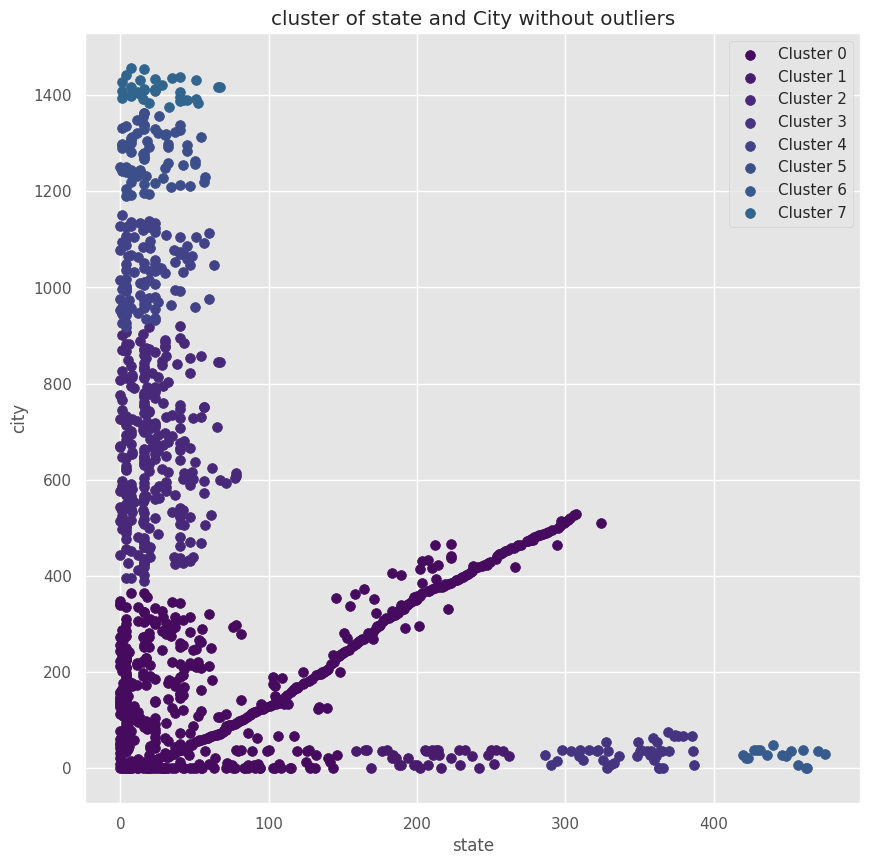

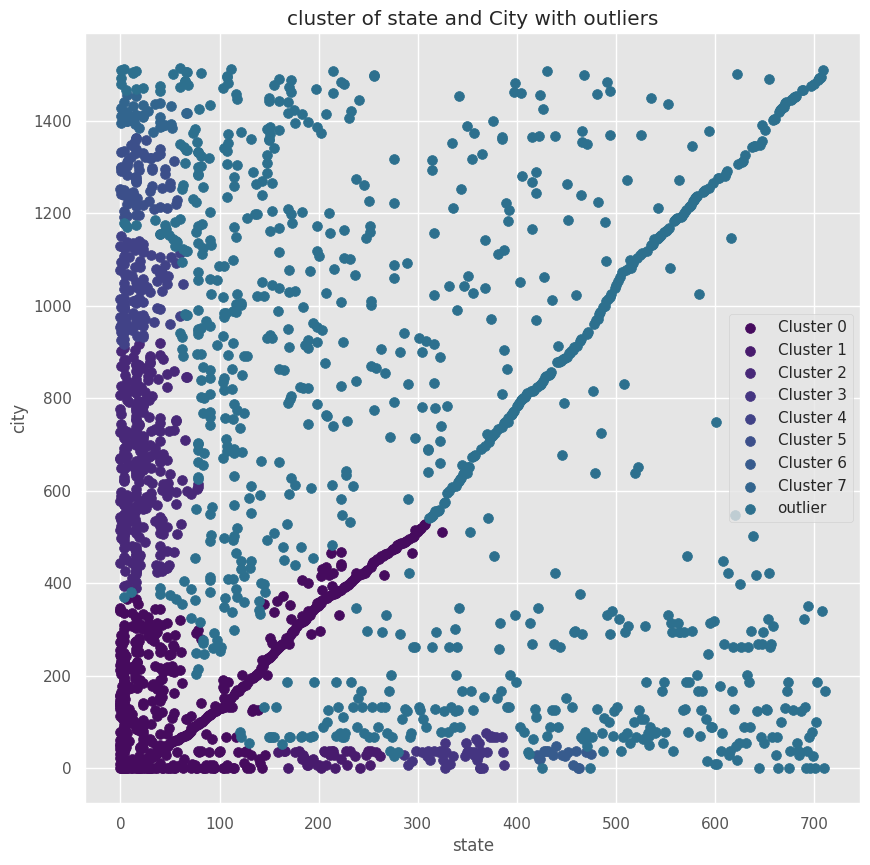

In [ ]:


# temp = df.loc[1:20000, ['country', 'city']]
temp = df.loc[:, ['state', 'city']].drop_duplicates()
temp = temp.apply(lambda x: pd.factorize(x)[0]).to_numpy()

X = temp
dbscan = DBSCAN(eps=30,min_samples=17,metric='euclidean')
dbscan.fit(temp)
labels = dbscan.labels_

print(labels)
print("Outliers: ",labels.tolist().count(-1))



print("Outliers: ",labels.tolist().count(-1))
viridis = cm.get_cmap('viridis', len(set(labels))*8)
color= viridis(np.linspace(0, 1,  len(set(labels))*8))
plt.figure(figsize=(10,10))


l=0
for count, x in enumerate(set(labels)):
  l+=2

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))


plt.legend()
plt.xlabel('state')
plt.ylabel('city')
plt.title('cluster of state and City without outliers')
plt.show()

l=0
plt.figure(figsize=(10,10))
for count, x in enumerate(set(labels)):
  l+=2

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))
  else:
         plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'outlier')


plt.legend()
plt.xlabel('state')
plt.ylabel('city')
plt.title('cluster of state and City with outliers')
plt.show()


Outliers:  474


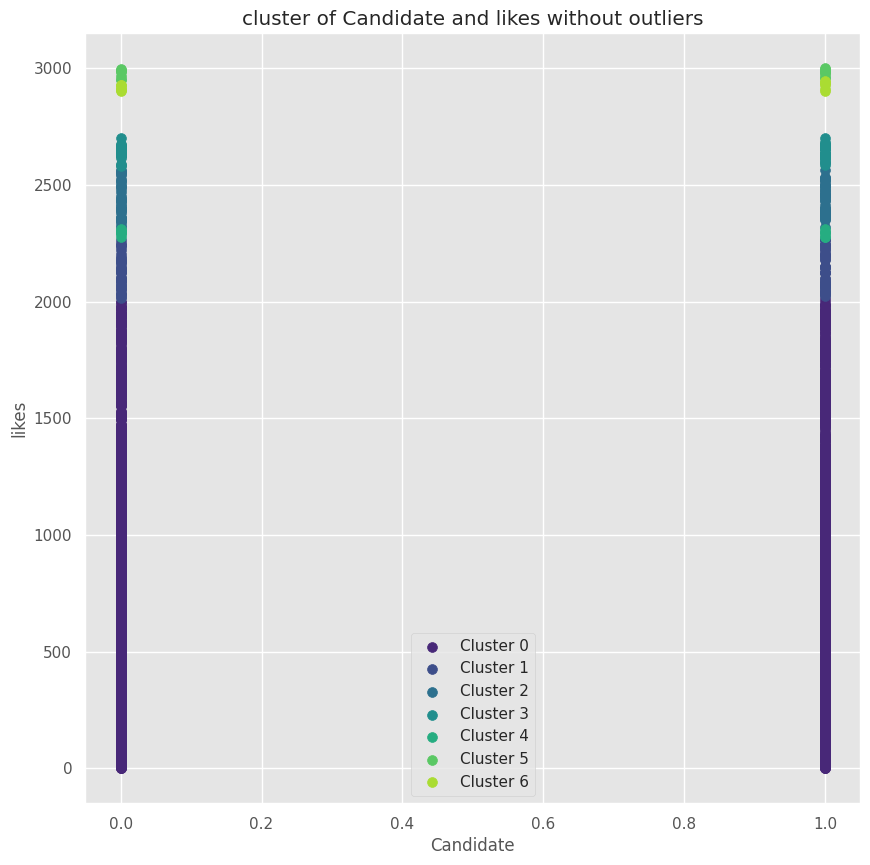

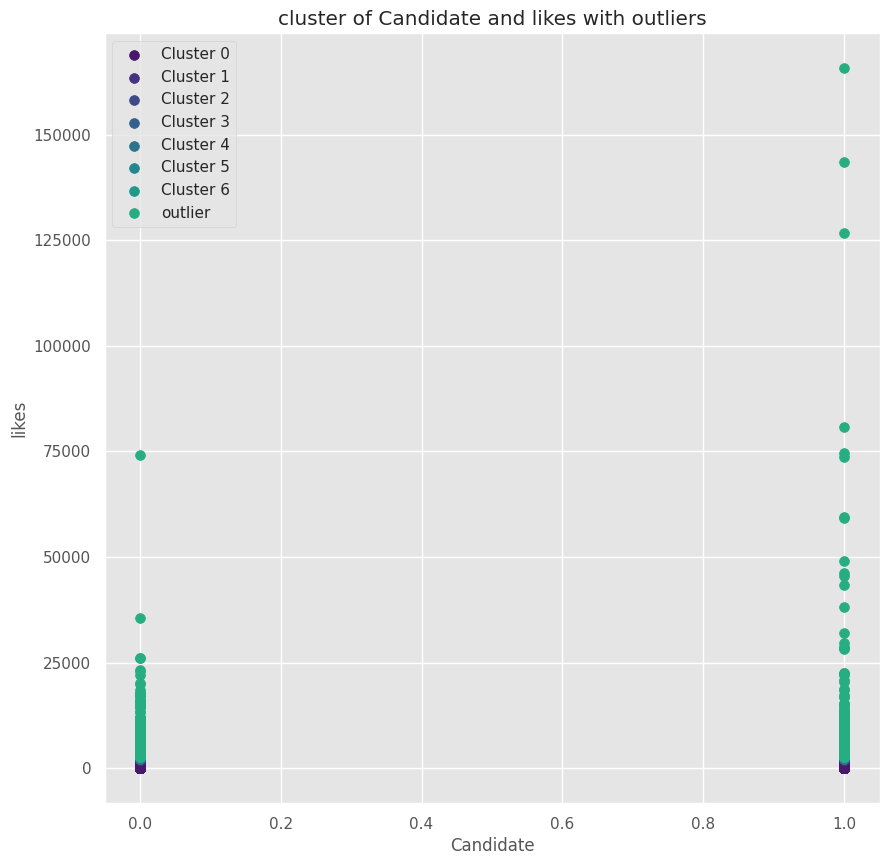

In [ ]:
from sklearn.cluster import DBSCAN 
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# temp = df.loc[1:20000, ['likes', 'Candidate']]
temp = df.loc[:, ['likes', 'Candidate']].drop_duplicates()
factorized_name = pd.factorize(temp['Candidate'])[0]
temp = pd.DataFrame({'factorized_name': factorized_name, 'likes': temp['likes']}).to_numpy()

X = temp
dbscan = DBSCAN(eps=25,min_samples=14,metric='euclidean')
dbscan.fit(temp)
labels = dbscan.labels_

print("Outliers: ",labels.tolist().count(-1))
viridis = cm.get_cmap('viridis', len(set(labels))*8)
color= viridis(np.linspace(0, 1,  len(set(labels))*8))
plt.figure(figsize=(10,10))


l=0
for count, x in enumerate(set(labels)):
  l+=7

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))


plt.legend()
plt.xlabel('Candidate')
plt.ylabel('likes')
plt.title('cluster of Candidate and likes without outliers')
plt.show()

l=0
plt.figure(figsize=(10,10))
for count, x in enumerate(set(labels)):
  l+=4

  if x != -1:
       plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'Cluster '+str(count))
  else:
         plt.scatter(X[labels == x, 0], X[labels == x, 1], s = 50, c = color[count+l], label = 'outlier')


plt.legend()
plt.xlabel('Candidate')
plt.ylabel('likes')
plt.title('cluster of Candidate and likes with outliers')
plt.show()


## frequent paattren

### anylasis on top hastags
## hastags by source

## top source by countroy
##  top source by days



## frequent pattren by countty and source

In [ ]:
del df

In [ ]:
del hashes

In [174]:
%pip install mlxtend --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 17.2 MB/s eta 0:00:00
  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.14.0
    Uninstalling mlxtend-0.14.0:
      Successfully uninstalled mlxtend-0.14.0


In [175]:
import mlxtend
from mlxtend.frequent_patterns import apriori, association_rules, fpgrowth, fpmax, fpcommon 
from mlxtend.preprocessing import TransactionEncoder

In [176]:
tweets.columns

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['tweet_id', 'user_screen_name', 'lat', 'long', 'Candidate', 'country',
       'state', 'continent', 'city', 'hash_tags', 'at', 'likes',
       'retweet_count', 'source', 'user_followers_count', 'tweet',
       'created_at', 'splited_days', 'clean_tweet', 'tokens',
       'sentiment_overall', 'days_count', 'source_count', 'country_coun',
       'popular_hastags', 'popular_tokens', 'hash_tags_len', 'join_hastags',
       'join_tok', 'token_tags_len'],
      dtype='object')

In [177]:
col =[ 'source_count', 'country_coun']
for x in col:
  tweets[x+'_per'] = tweets[x]/len(tweets)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [178]:
len(tweets['source'].unique())

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


851

In [179]:
len(tweets[(0.00001>=tweets['country_coun_per'])]['country'].unique())

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


37

In [180]:
top_source= tweets[tweets['source_count']>= 500]['source'].unique()
top_con=tweets[tweets['country_coun_per']>=0.01]['country'].unique()
les2_con =tweets[(0.00001>=tweets['country_coun_per'])]['country'].unique()

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [181]:
kl = tweets[(tweets.country.isin(top_con)) & (tweets.source.isin(top_source))][['country','source' ]]
kl

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,country,source
3,United States of America,Twitter Web App
5,United States of America,Twitter for iPhone
6,United States of America,Twitter for Android
7,Geo Data N/A,Twitter for iPhone
8,United States of America,Twitter for iPhone
...,...,...
1753158,Geo Data N/A,Twitter Web App
1753159,Geo Data N/A,Twitter for iPad
1753160,Geo Data N/A,Twitter Web App
1753161,United States of America,Twitter for iPhone


In [182]:
arr=[]
for x in kl['source'].unique():
  lkl= kl[kl['source']==x]['country']
  arr.append(list(set(lkl)))

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [183]:
src_coun=pd.DataFrame(arr)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
src_coun

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,0,1,2,3,4,5,6,7
0,Germany,Canada,United Kingdom,France,Geo Data N/A,Italy,United States of America,India
1,Canada,Germany,United Kingdom,France,Geo Data N/A,Italy,United States of America,India
2,Canada,Germany,United Kingdom,France,Geo Data N/A,Italy,United States of America,India
3,Canada,Germany,United Kingdom,France,Geo Data N/A,Italy,United States of America,India
4,Canada,Germany,United Kingdom,France,Geo Data N/A,Italy,United States of America,India
5,Canada,Germany,United Kingdom,France,Geo Data N/A,Italy,United States of America,India
6,Canada,Germany,United Kingdom,France,Geo Data N/A,Italy,United States of America,India
7,Geo Data N/A,None,None,None,None,None,None,None
8,Germany,Canada,United Kingdom,France,Geo Data N/A,Italy,United States of America,India
9,Canada,Germany,United Kingdom,France,Geo Data N/A,United States of America,India,None


In [ ]:
from mlxtend.preprocessing import TransactionEncoder
te = TransactionEncoder()
te_ary = te.fit(arr).transform(arr)
src_coun_df= pd.DataFrame(te_ary, columns=te.columns_)
src_coun_df

,Canada,France,Geo Data N/A,Germany,India,Italy,United Kingdom,United States of America
0,True,True,True,True,True,True,True,True
1,True,True,True,True,True,True,True,True
2,True,True,True,True,True,True,True,True
3,True,True,True,True,True,True,True,True
4,True,True,True,True,True,True,True,True
5,True,True,True,True,True,True,True,True
6,True,True,True,True,True,True,True,True
7,False,False,True,False,False,False,False,False
8,True,True,True,True,True,True,True,True
9,True,True,True,True,True,False,True,True


## select algo

In [ ]:
from timeit import repeat
rep_count= 5
tests= 3
ap_algo =np.zeros((tests, rep_count))
fp_growth = np.zeros((tests, rep_count))

In [ ]:

testcases = [''' 
def fn(): 
    return apriori(src_coun_df, min_support = 0.1, use_colnames=True)
''',
''' 
def fn(): 
    return fpgrowth(src_coun_df, min_support = 0.1, use_colnames=True)
''']
ap_algo[0]=repeat(stmt= testcases[0], repeat=rep_count)
fp_growth[0]=repeat(stmt= testcases[1], repeat=rep_count)

In [ ]:

testcases = [''' 
def fn(): 
    return apriori(src_coun_df, min_support = 0.5, use_colnames=True)
''',
''' 
def fn(): 
    return fpgrowth(src_coun_df, min_support = 0.5, use_colnames=True)
''']
ap_algo[1]=repeat(stmt= testcases[0], repeat=rep_count)
fp_growth[1]=repeat(stmt= testcases[1], repeat=rep_count)

In [ ]:

testcases = [''' 
def fn(): 
    return apriori(src_coun_df, min_support = 0.8, use_colnames=True)
''',
''' 
def fn(): 
    return fpgrowth(src_coun_df, min_support = 0.8, use_colnames=True)
''']
ap_algo[2]=repeat(stmt= testcases[0], repeat=rep_count)
fp_growth[2]=repeat(stmt= testcases[1], repeat=rep_count)

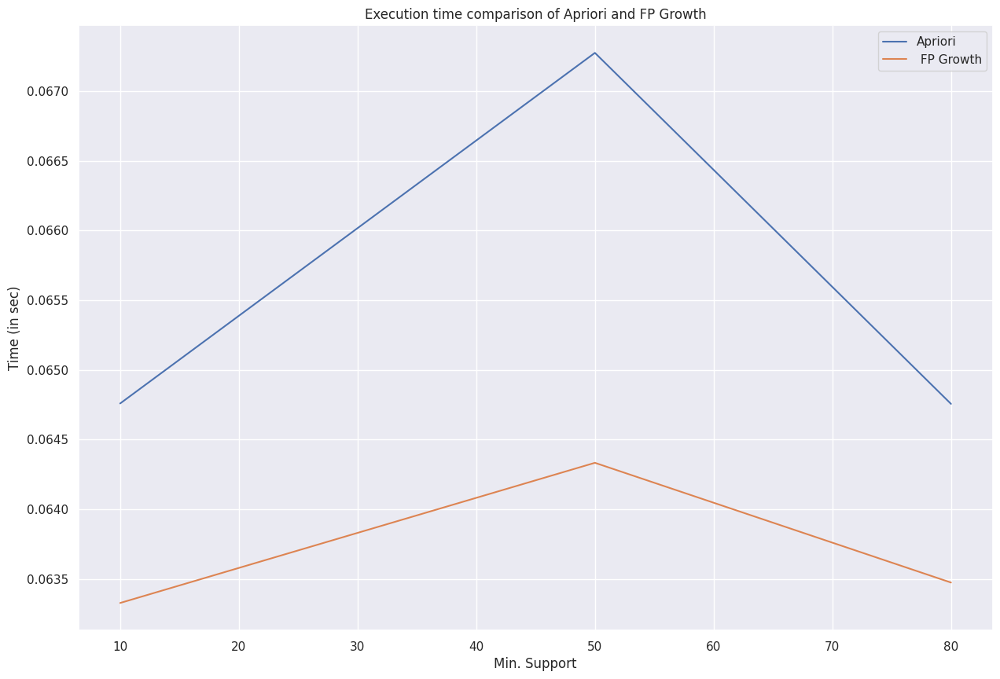

In [ ]:
## Overall Comparison "1%","3%","5%" for both Apriori and FP Growth
## Execution time comparison of Apriori and FP Growth
## plt.xlabel("Min. Support")
## plt.ylabel("Time (in sec)")

import matplotlib.pyplot as plt

x_axis = [10, 50, 80]
y_axis = [np.mean(ap_algo[0]),np.mean(ap_algo[1]),np.mean(ap_algo[2])]
y_axis2 = [np.mean(fp_growth[0]),np.mean(fp_growth[1]),np.mean(fp_growth[2])]
plt.plot(x_axis, y_axis,  label ='Apriori')
plt.plot(x_axis, y_axis2,  label =' FP Growth')
plt.legend()
plt.title('Execution time comparison of Apriori and FP Growth')
plt.xlabel("Min. Support")
plt.ylabel("Time (in sec)")
plt.show()

## soucer-country

In [ ]:
# fpgrowth
frequent_items = fpgrowth(src_coun_df, min_support=0.5, use_colnames=True)
frequent_items

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.95,(United States of America)
1,0.90,(Geo Data N/A)
2,0.85,(United Kingdom)
3,0.85,(India)
4,0.80,(Germany)
...,...,...
250,0.70,"(India, United States of America, Canada, Geo ..."
251,0.70,"(United States of America, United Kingdom, Can..."
252,0.70,"(India, United States of America, United Kingd..."
253,0.70,"(India, United States of America, United Kingd..."


In [ ]:
fp_growth_frq_pattren_3 = frequent_items[frequent_items['support']>=0.85]
fp_growth_frq_pattren_3['len']= fp_growth_frq_pattren_3.itemsets.apply(lambda x: len(x))  
fp_growth_frq_pattren_3.reset_index(inplace= True)
fp_growth_frq_pattren_3_ass =  fp_growth_frq_pattren_3[fp_growth_frq_pattren_3['len']>=2]
fp_growth_frq_pattren_3_ass

,index,support,itemsets,len
4,8,0.85,"(United States of America, Geo Data N/A)",2
5,9,0.85,"(United Kingdom, Geo Data N/A)",2
6,10,0.85,"(United States of America, United Kingdom)",2
7,11,0.85,"(United States of America, United Kingdom, Geo...",3
8,12,0.85,"(United Kingdom, India)",2
9,13,0.85,"(India, Geo Data N/A)",2
10,14,0.85,"(United States of America, India)",2
11,15,0.85,"(United Kingdom, India, Geo Data N/A)",3
12,16,0.85,"(United States of America, United Kingdom, India)",3
13,17,0.85,"(United States of America, India, Geo Data N/A)",3


In [ ]:
fp_growth_rules3 = association_rules(fp_growth_frq_pattren_3, metric="confidence", min_threshold=0.2)

fp_growth_rules3 [fp_growth_rules3['confidence']>=1][['antecedents', 'consequents', 'antecedent support',
       'consequent support', 'support', 'confidence', 'lift']]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift
2,(United Kingdom),(Geo Data N/A),0.85,0.90,0.85,1.0,1.111111
5,(United Kingdom),(United States of America),0.85,0.95,0.85,1.0,1.052632
6,"(United States of America, United Kingdom)",(Geo Data N/A),0.85,0.90,0.85,1.0,1.111111
7,"(United States of America, Geo Data N/A)",(United Kingdom),0.85,0.85,0.85,1.0,1.176471
8,"(United Kingdom, Geo Data N/A)",(United States of America),0.85,0.95,0.85,1.0,1.052632
10,(United Kingdom),"(United States of America, Geo Data N/A)",0.85,0.85,0.85,1.0,1.176471
12,(United Kingdom),(India),0.85,0.85,0.85,1.0,1.176471
13,(India),(United Kingdom),0.85,0.85,0.85,1.0,1.176471
14,(India),(Geo Data N/A),0.85,0.90,0.85,1.0,1.111111
17,(India),(United States of America),0.85,0.95,0.85,1.0,1.052632


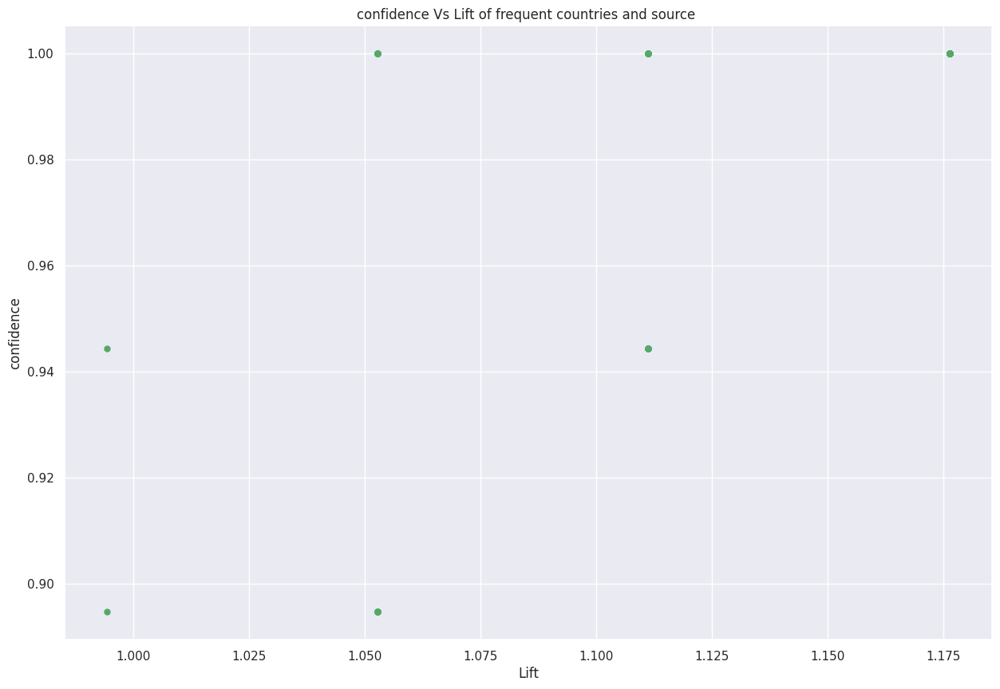

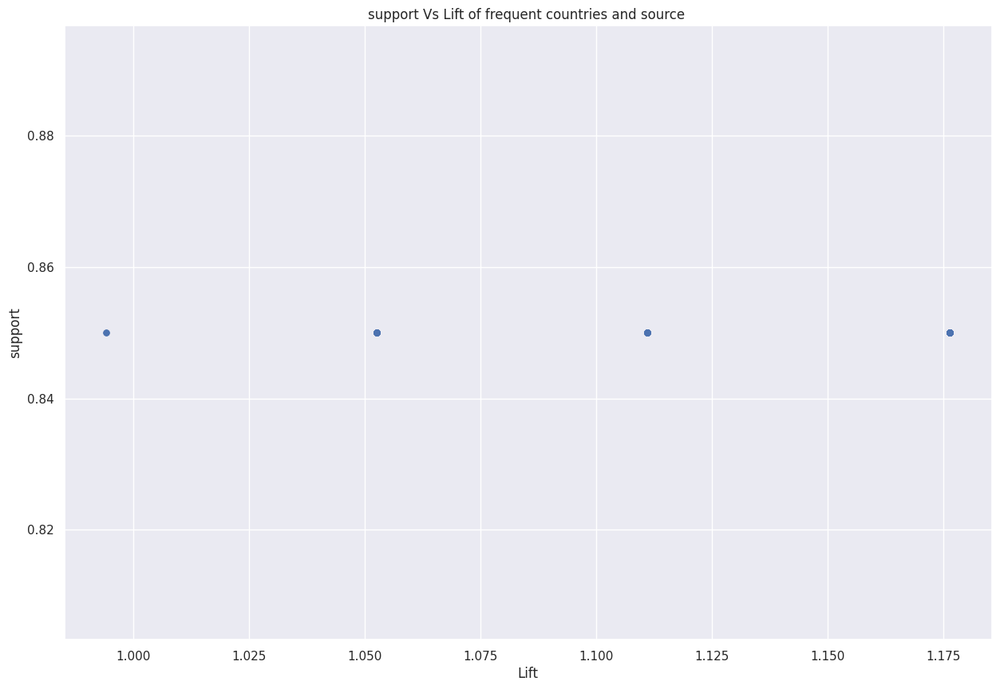

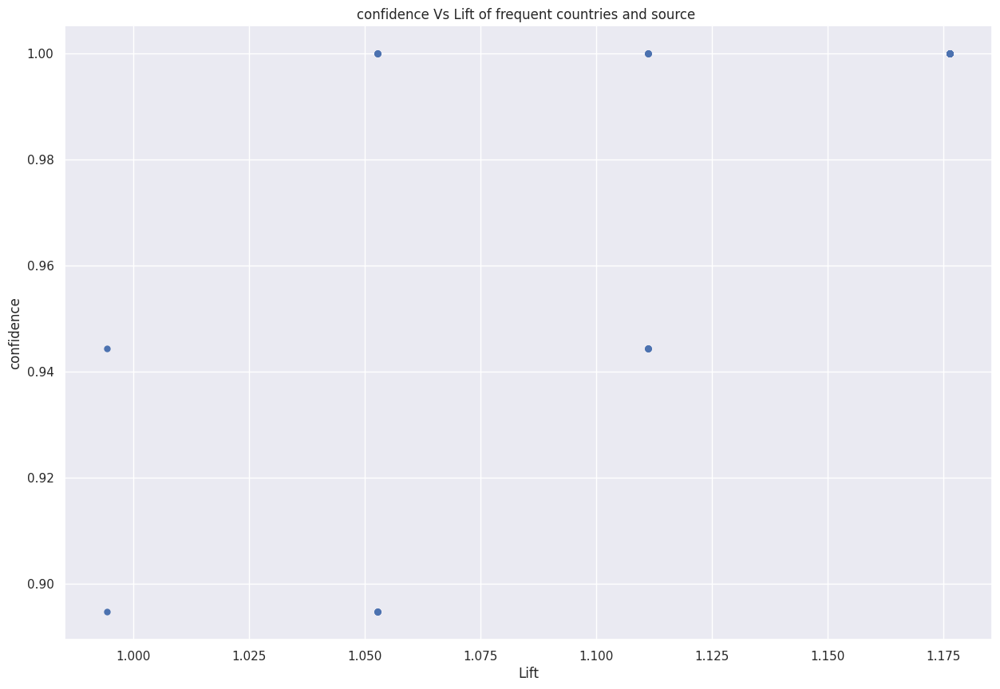

In [ ]:
plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['confidence'], c='g', s=25)
plt.ylabel("confidence")
plt.xlabel("Lift")
plt.title("confidence Vs Lift of frequent countries and source ")
plt.show()


plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['support'], c='b', s=25)
plt.ylabel("support")
plt.xlabel("Lift")
plt.title("support Vs Lift of frequent countries and source ")
plt.show()



plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['confidence'], c='b', s=25)
plt.ylabel("confidence")
plt.xlabel("Lift")
plt.title("confidence Vs Lift of frequent countries and source ")
plt.show()


## day country less commo

In [ ]:
kl2 = tweets[(tweets.country.isin(les2_con)) ][['country','splited_days']].drop_duplicates()
kl2

,country,splited_days
8782,Liechtenstein,2020-10-15
23839,British Virgin Islands,2020-10-15
34876,Cayman Islands,2020-10-16
36121,Seychelles,2020-10-16
50172,Mauritius,2020-10-16
...,...,...
1662903,Congo,2020-11-08
1668508,Benin,2020-11-08
1686025,Turks and Caicos Islands,2020-11-08
1726285,Republic of the Congo,2020-11-08


In [ ]:
arr=[]
len_k=[]
for x in kl2['splited_days'].unique():
  lkl= kl2[kl2['splited_days']==x]['country']
 # print(set(lkl), x, len(set(lkl)))
  arr.append(list(set(lkl)))
  len_k.append(len(set(lkl)))
print(set(len_k))

{2, 3, 4, 5, 6, 9, 11, 14, 17, 20}


In [ ]:
te = TransactionEncoder()
te_ary = te.fit(arr).transform(arr)
src_coun_df= pd.DataFrame(te_ary, columns=te.columns_)
src_coun_df

,Anguilla,Antigua and Barbuda,Belarus,Belize,Benin,British Virgin Islands,Cape Verde,Cayman Islands,Congo,Democratic Republic of the Congo,...,Puerto Rico,Republic of the Congo,Saint Kitts and Nevis,Saint Lucia,Seychelles,South Sudan,Tajikistan,Tonga,Turks and Caicos Islands,Vanuatu
0,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,True,False,False,False,False,False
2,False,False,False,False,False,True,False,True,False,False,...,False,True,True,False,False,False,True,False,False,False
3,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,True,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5,True,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8,False,True,False,True,False,True,True,False,False,False,...,True,False,False,False,False,False,False,True,False,False
9,False,False,False,True,True,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False


In [ ]:
# fpgrowth
frequent_items3 = fpgrowth(src_coun_df, min_support=0.1, use_colnames=True)
frequent_items3

,support,itemsets
0,0.36,(British Virgin Islands)
1,0.16,(Liechtenstein)
2,0.24,(Mauritius)
3,0.20,(Cayman Islands)
4,0.12,(Madagascar)
...,...,...
226,0.12,"(Belarus, Montenegro, Guinea, Puerto Rico, Nor..."
227,0.12,"(Belarus, Democratic Republic of the Congo, Gu..."
228,0.12,"(Belarus, Democratic Republic of the Congo, No..."
229,0.12,"(Belarus, Democratic Republic of the Congo, Mo..."


In [ ]:
fp_growth_frq_pattren_4 = frequent_items3
fp_growth_frq_pattren_4['len']= fp_growth_frq_pattren_4.itemsets.apply(lambda x: len(x))  
fp_growth_frq_pattren_4[fp_growth_frq_pattren_4['len']>2]

,level_0,index,support,itemsets,len
29,29,29,0.12,"(North Macedonia, Mauritius, Saint Kitts and N...",3
30,30,30,0.12,"(Mauritius, Saint Kitts and Nevis, Belize)",3
31,31,31,0.12,"(North Macedonia, Mauritius, Belize)",3
32,32,32,0.12,"(North Macedonia, Mauritius, Saint Kitts and N...",4
43,43,43,0.12,"(Belize, North Macedonia, Democratic Republic ...",3
...,...,...,...,...,...
226,226,226,0.12,"(Belarus, Montenegro, Guinea, Puerto Rico, Nor...",6
227,227,227,0.12,"(Belarus, Democratic Republic of the Congo, Gu...",6
228,228,228,0.12,"(Belarus, Democratic Republic of the Congo, No...",6
229,229,229,0.12,"(Belarus, Democratic Republic of the Congo, Mo...",6


In [ ]:
fp_growth_rules3 = association_rules(fp_growth_frq_pattren_4, metric="confidence", min_threshold=0.2)

fp_growth_rules3[['antecedents', 'consequents', 'antecedent support',
       'consequent support', 'support', 'confidence', 'lift']]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift
0,(British Virgin Islands),(Liechtenstein),0.36,0.16,0.16,0.444444,2.777778
1,(Liechtenstein),(British Virgin Islands),0.16,0.36,0.16,1.000000,2.777778
2,(North Macedonia),(Mauritius),0.28,0.24,0.16,0.571429,2.380952
3,(Mauritius),(North Macedonia),0.24,0.28,0.16,0.666667,2.380952
4,(British Virgin Islands),(Mauritius),0.36,0.24,0.12,0.333333,1.388889
...,...,...,...,...,...,...,...
2697,(North Macedonia),"(Belarus, Democratic Republic of the Congo, Gu...",0.28,0.12,0.12,0.428571,3.571429
2698,(Guinea),"(Belarus, Democratic Republic of the Congo, No...",0.24,0.12,0.12,0.500000,4.166667
2699,(Puerto Rico),"(Belarus, Democratic Republic of the Congo, No...",0.20,0.12,0.12,0.600000,5.000000
2700,(Montenegro),"(Belarus, Democratic Republic of the Congo, Gu...",0.16,0.12,0.12,0.750000,6.250000


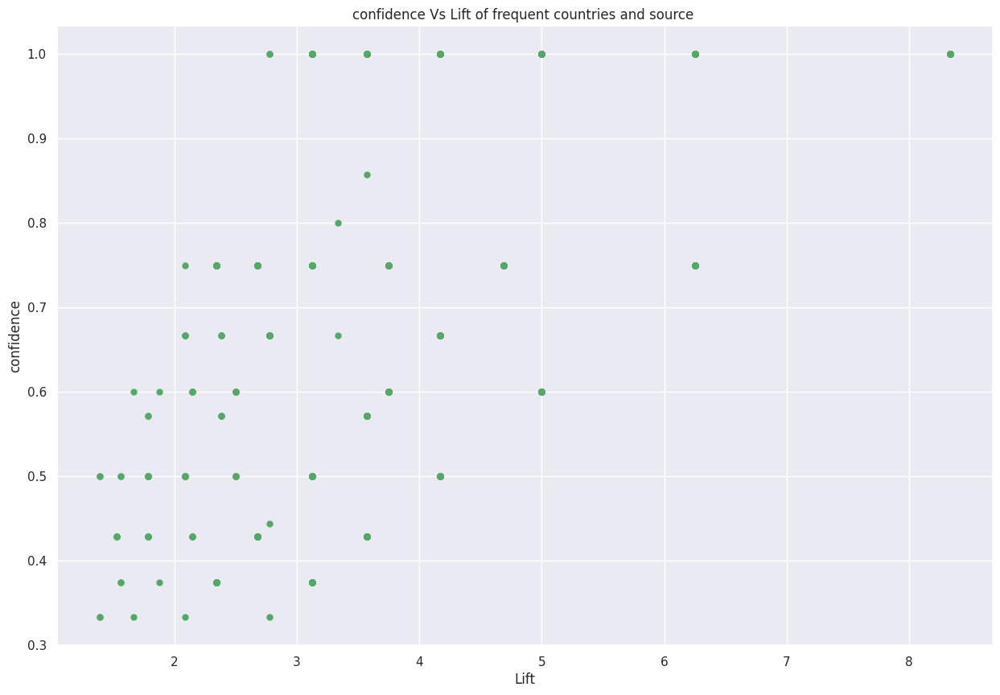

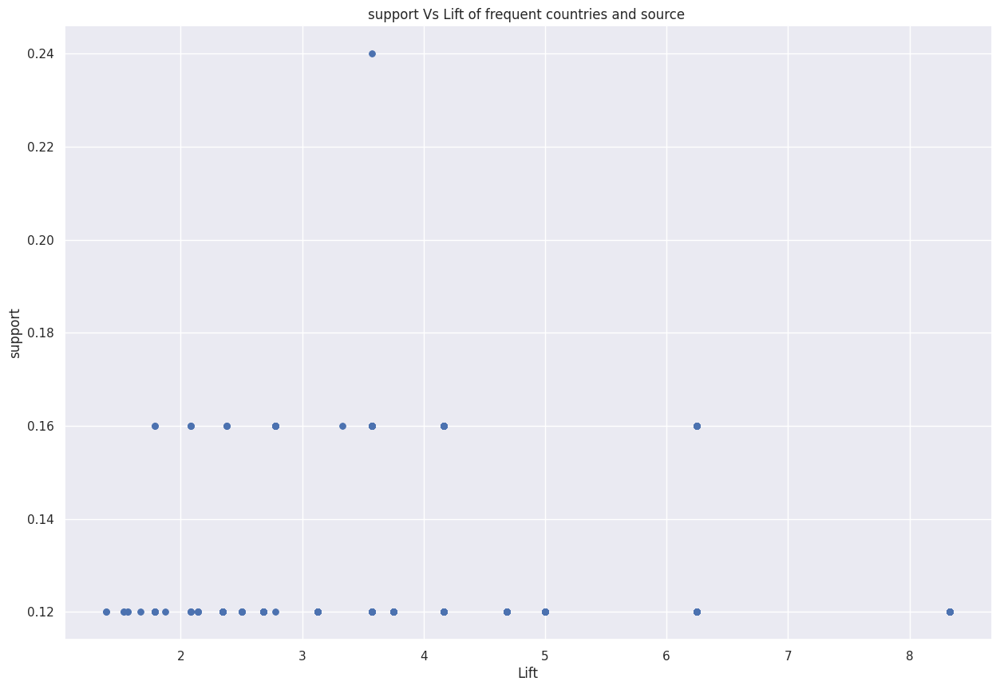

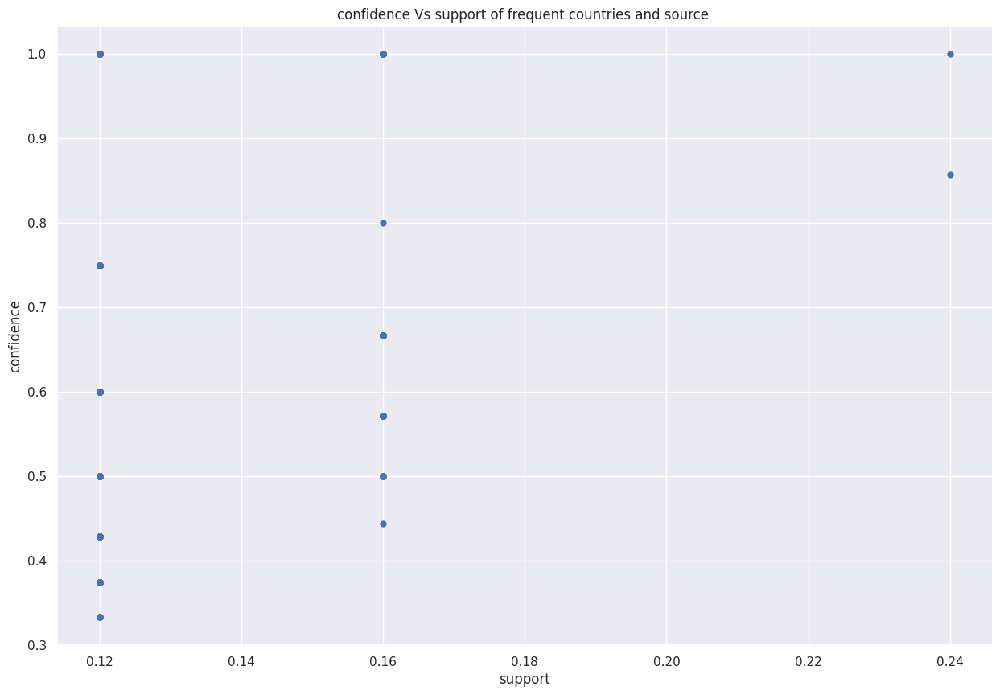

In [ ]:
plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['confidence'], c='g', s=25)
plt.ylabel("confidence")
plt.xlabel("Lift")
plt.title("confidence Vs Lift of frequent countries and source ")
plt.show()


plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['support'], c='b', s=25)
plt.ylabel("support")
plt.xlabel("Lift")
plt.title("support Vs Lift of frequent countries and source ")
plt.show()



plt.scatter(fp_growth_rules3['support'], fp_growth_rules3['confidence'], c='b', s=25)
plt.ylabel("confidence")
plt.xlabel("support")
plt.title("confidence Vs support of frequent countries and source ")
plt.show()

#Hastags

In [ ]:
te2 = TransactionEncoder()
te2_ary = te2.fit(hash_tag['popular_hastags'].tolist()).transform(hash_tag['popular_hastags'].tolist())
hash_df= pd.DataFrame(te2_ary, columns=te2.columns_)
hash_df

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,2020Election,2020Elections,4MoreYears,America,AmericaDecides2020,AmericaFirst,AmericaOrTrump,American,Americans,Arizona,...,maga,news,politics,president,realDonaldTrump,tRump,trump,trump2020,usa,vote
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1187088,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1187089,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1187090,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1187091,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# fpgrowth
frequent_items2 = fpgrowth(hash_df, min_support=0.001, use_colnames=True)
frequent_items2

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.004978,(donaldtrump)
1,0.413920,(Trump)
2,0.083373,(trump)
3,0.218623,(Biden)
4,0.001824,(TrumpIsNotAmerica)
...,...,...
707,0.001010,"(Election2020, Election2020results, JoeBiden)"
708,0.001452,"(Biden, PresidentElectJoe)"
709,0.002809,"(JoeBiden, PresidentElectJoe)"
710,0.001057,"(BidenHarris2020, PresidentElectJoe)"


In [ ]:
fp_growth_frq_pattren_4 = frequent_items2
fp_growth_frq_pattren_4['len']= fp_growth_frq_pattren_4.itemsets.apply(lambda x: len(x))  
fp_growth_frq_pattren_4[fp_growth_frq_pattren_4['len']>2]

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
217,0.001120,"(Trump, BidenHarris2020, Trump2020)",3
218,0.003452,"(Election2020, Trump, Trump2020)",3
219,0.001293,"(Biden, Trump2020, Election2020)",3
220,0.001136,"(Biden, Trump2020, Elections2020)",3
221,0.001788,"(Trump, Trump2020, Elections2020)",3
...,...,...,...
641,0.001114,"(Election2020, ElectionDay, Trump2020, Electio...",4
690,0.001559,"(Election2020, Trump, ElectionResults2020)",3
691,0.001130,"(Biden, ElectionResults2020, Election2020)",3
706,0.001001,"(Biden, Election2020results, Election2020)",3


In [ ]:
fp_growth_rules3 = association_rules(fp_growth_frq_pattren_4, metric="confidence", min_threshold=0.2)

fp_growth_rules3[fp_growth_rules3['confidence']>0.4][['antecedents', 'consequents', 'antecedent support',
       'consequent support', 'support', 'confidence', 'lift']]

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift
1,(WhiteHouse),(Trump),0.003896,0.413920,0.001993,0.511568,1.235911
5,(HunterBiden),(JoeBiden),0.008708,0.166679,0.005257,0.603657,3.621681
6,(Trump2020),(Trump),0.034868,0.413920,0.019645,0.563394,1.361119
7,"(BidenHarris2020, Trump2020)",(Trump),0.002488,0.413920,0.001120,0.450389,1.088109
8,"(Election2020, Trump2020)",(Trump),0.005810,0.413920,0.003452,0.594171,1.435476
...,...,...,...,...,...,...,...
612,(USWahlen2020),(Trump),0.001703,0.413920,0.001055,0.619189,1.495916
613,(USAElections2020),(Trump),0.009425,0.413920,0.003776,0.400608,0.967840
615,(ElectionResults2020),(Trump),0.012960,0.413920,0.005364,0.413910,0.999976
626,(USElectionResults2020),(JoeBiden),0.005831,0.166679,0.002889,0.495522,2.972916


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


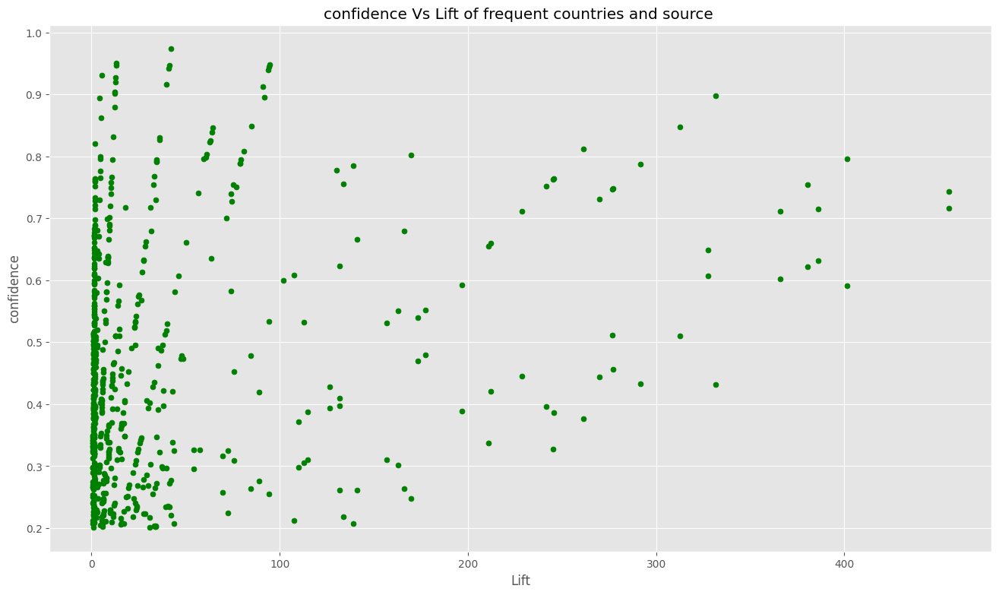

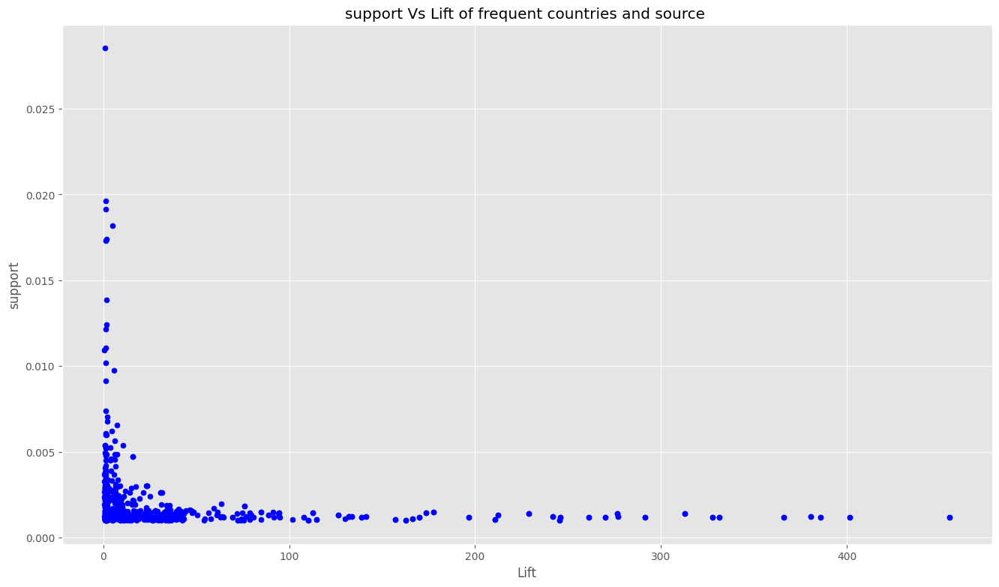

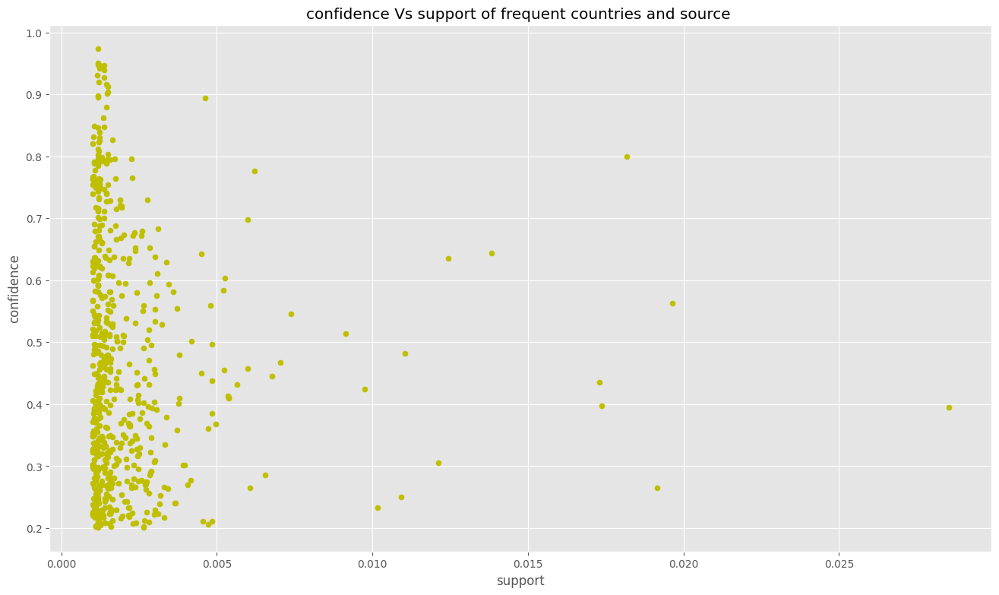

In [ ]:
plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['confidence'], c='g', s=25)
plt.ylabel("confidence")
plt.xlabel("Lift")
plt.title("confidence Vs Lift of frequent countries and source ")
plt.show()


plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['support'], c='b', s=25)
plt.ylabel("support")
plt.xlabel("Lift")
plt.title("support Vs Lift of frequent countries and source ")
plt.show()



plt.scatter(fp_growth_rules3['support'], fp_growth_rules3['confidence'], c='y', s=25)
plt.ylabel("confidence")
plt.xlabel("support")
plt.title("confidence Vs support of frequent countries and source ")
plt.show()

In [ ]:
top_source[:10]

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


array(['Twitter Web App', 'Twitter for iPhone', 'Twitter for Android',
       'dlvr.it', 'Twitter for iPad', 'Instagram', 'TweetDeck',
       'RSS Post Syndication', 'Buffer', 'Twitter Media Studio'],
      dtype=object)

In [ ]:
hash_source = hash_tag[hash_tag.source.isin(top_source[:10])][['popular_hastags', 'source']].dropna()
hash_source= hash_source.explode('popular_hastags').reset_index(drop=True).drop_duplicates()
hash_source

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,popular_hastags,source
0,Trump,Twitter Web App
1,Trump,Twitter for iPhone
2,Trump,Twitter for Android
3,trump,Twitter for iPhone
5,Biden,Twitter Web App
...,...,...
2340257,democrats,dlvr.it
2366838,BIDEN,dlvr.it
2375265,TRUMP,Twitter Media Studio
2382911,PresidentElect,Buffer


In [248]:
tokes_lis= hash_tag[hash_tag['likes']>1500]['popular_hastags']
te4= TransactionEncoder()
te4_ary = te4.fit(tokes_lis).transform(tokes_lis)
tah_df2= pd.DataFrame(te4_ary, columns=te4.columns_)
# fpgrowth
frequent_items4 = fpgrowth(tah_df2, min_support=0.01, use_colnames=True)
frequent_items4

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.279801,(Biden)
1,0.438742,(Trump)
2,0.043046,(Trump2020)
3,0.137417,(Election2020)
4,0.044702,(DonaldTrump)
...,...,...
73,0.011589,"(ElectionDay2020, Election2020)"
74,0.013245,"(ElectionDay2020, Trump, Trump2020)"
75,0.011589,"(ElectionDay2020, Election2020, Trump)"
76,0.013245,"(Biden, Harris)"


In [249]:
fp_growth_frq_pattren_6 = frequent_items4
fp_growth_frq_pattren_6['len']= fp_growth_frq_pattren_6.itemsets.apply(lambda x: len(x))  
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']>2]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']>2]

26


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
30,0.019868,"(Trump, Election2020, Trump2020)",3
31,0.014901,"(Trump, ElectionDay, Trump2020)",3
32,0.013245,"(Election2020, ElectionDay, Trump2020)",3
33,0.013245,"(Trump, Election2020, ElectionDay, Trump2020)",4
34,0.016556,"(Trump, Elections2020, Trump2020)",3
42,0.014901,"(Trump, Election2020, Elections2020)",3
48,0.021523,"(Trump, Election2020, ElectionDay)",3
49,0.019868,"(Trump, Elections2020, ElectionDay)",3
50,0.011589,"(Election2020, Elections2020, ElectionDay)",3
51,0.011589,"(Trump, Election2020, Elections2020, ElectionDay)",4


In [250]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]

26


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
26,0.033113,"(Trump, Trump2020)",2
27,0.019868,"(Election2020, Trump2020)",2
28,0.014901,"(ElectionDay, Trump2020)",2
29,0.016556,"(Elections2020, Trump2020)",2
35,0.038079,"(Election2020, Biden)",2
36,0.023179,"(Election2020, JoeBiden)",2
37,0.067881,"(Trump, Election2020)",2
38,0.011589,"(Biden, Biden2020)",2
39,0.049669,"(Trump, Elections2020)",2
40,0.014901,"(Election2020, Elections2020)",2


In [251]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]

26


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
0,0.279801,(Biden),1
1,0.438742,(Trump),1
2,0.043046,(Trump2020),1
3,0.137417,(Election2020),1
4,0.044702,(DonaldTrump),1
5,0.178808,(JoeBiden),1
6,0.024834,(trump),1
7,0.019868,(VOTE),1
8,0.018212,(Biden2020),1
9,0.067881,(Elections2020),1


In [245]:
fp_growth_rules3 = association_rules(fp_growth_frq_pattren_6, metric="confidence", min_threshold=0.2)

fp_growth_rules3[fp_growth_rules3['confidence']>0.4][['antecedents', 'consequents', 'antecedent support',
       'consequent support', 'support', 'confidence', 'lift']]

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift
1,(right),(biden),0.034768,0.364238,0.023179,0.666667,1.830303
2,(right),(trump),0.034768,0.536424,0.014901,0.428571,0.798942
4,(il),(trump),0.057947,0.536424,0.028146,0.485714,0.905467
5,(il),(biden),0.057947,0.364238,0.026490,0.457143,1.255065
6,(di),(trump),0.057947,0.536424,0.036424,0.628571,1.171781
...,...,...,...,...,...,...,...
385,"(electionnight, ident)",(trump),0.011589,0.536424,0.011589,1.000000,1.864198
387,(nevada),(biden),0.019868,0.364238,0.013245,0.666667,1.830303
388,(trumpv),(biden),0.011589,0.364238,0.011589,1.000000,2.745455
389,(क),(म),0.013245,0.011589,0.011589,0.875000,75.500000


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


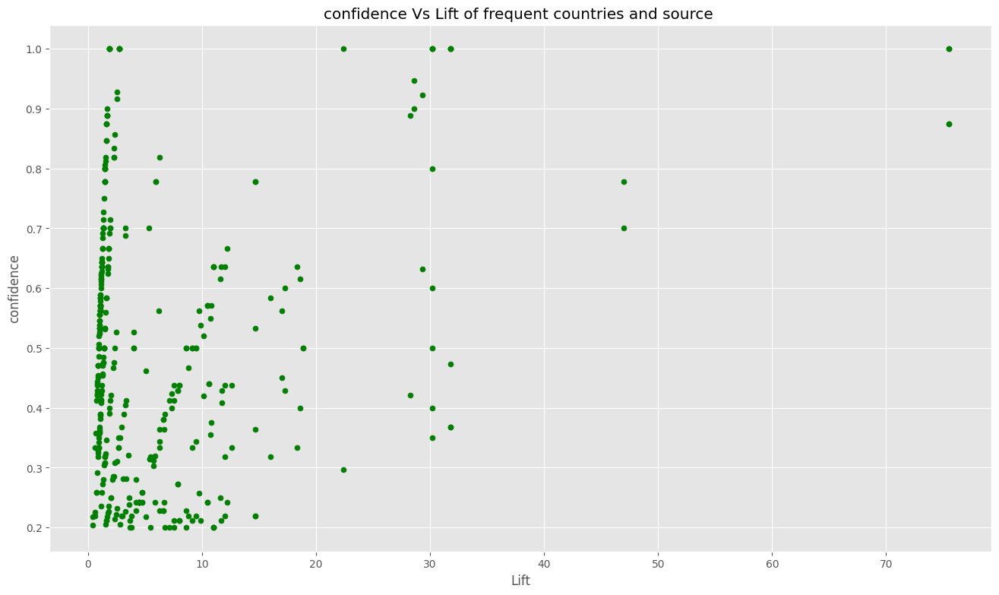

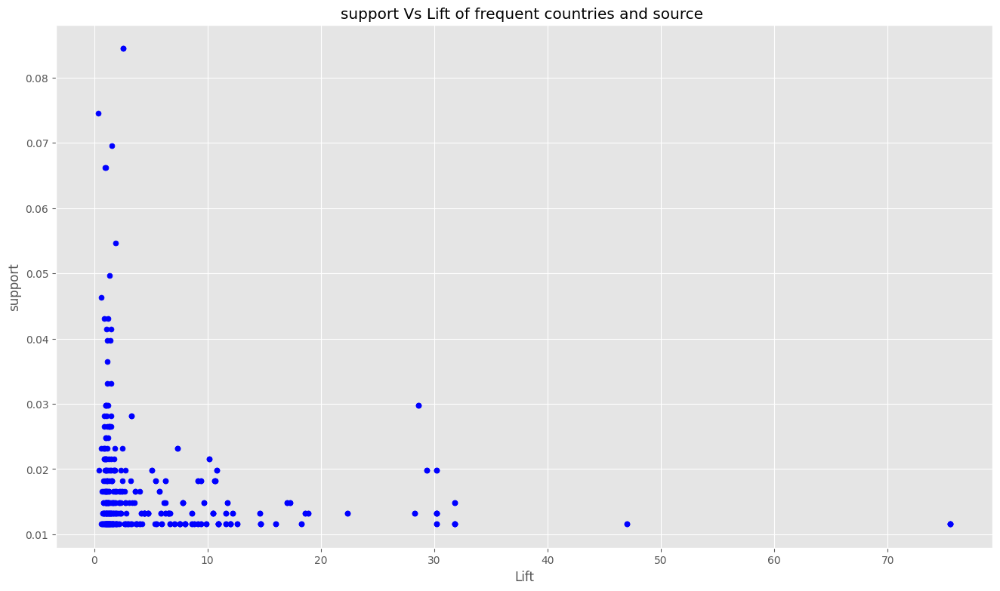

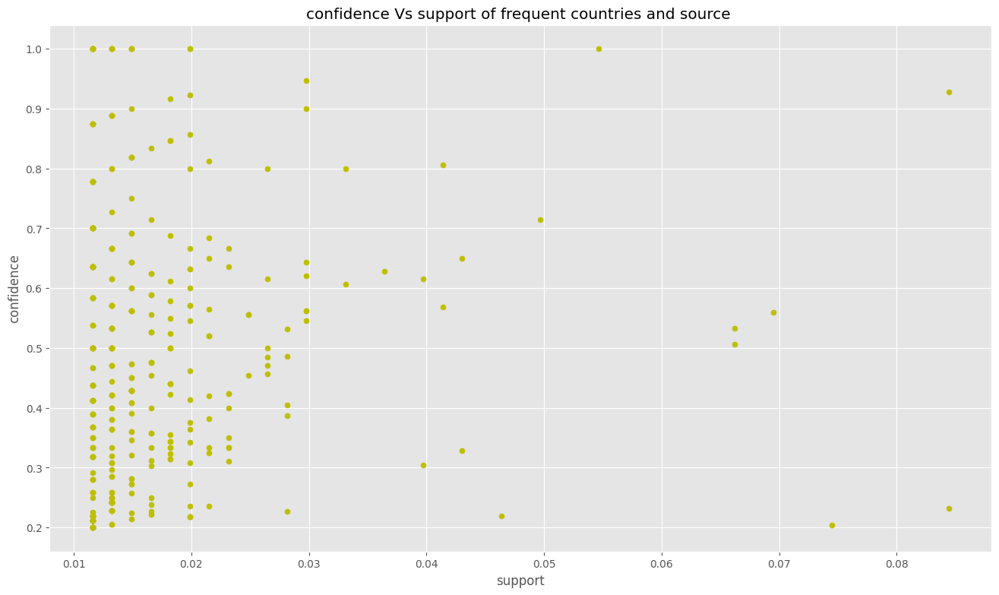

In [252]:
plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['confidence'], c='g', s=25)
plt.ylabel("confidence")
plt.xlabel("Lift")
plt.title("confidence Vs Lift of frequent countries and source ")
plt.show()


plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['support'], c='b', s=25)
plt.ylabel("support")
plt.xlabel("Lift")
plt.title("support Vs Lift of frequent countries and source ")
plt.show()



plt.scatter(fp_growth_rules3['support'], fp_growth_rules3['confidence'], c='y', s=25)
plt.ylabel("confidence")
plt.xlabel("support")
plt.title("confidence Vs support of frequent countries and source ")
plt.show()

#Tweets

In [184]:
tweets

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,tweet_id,user_screen_name,lat,long,Candidate,country,state,continent,city,hash_tags,...,source_count,country_coun,popular_hastags,popular_tokens,hash_tags_len,join_hastags,join_tok,token_tags_len,source_count_per,country_coun_per
2,1.316529e+18,MediasetTgcom24,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,[donaldtrump],...,21,645117,[donaldtrump],"[trump, twitter, biden, donaldtrump]",1,donaldtrump,trump twitter biden donaldtrump,4,0.000018,0.541612
3,1.316529e+18,snarke,45.520247,-122.674195,TRUMP,United States of America,Oregon,North America,Portland,[Trump],...,374070,295253,[Trump],"[trump, ed, hear, year, ten, year, china, know...",1,Trump,trump ed hear year ten year china know many ma...,15,0.314053,0.247881
5,1.316529e+18,Ranaabtar,38.894992,-77.036558,TRUMP,United States of America,District of Columbia,North America,Washington,"[Trump, Iowa]",...,378386,295253,[Trump],"[get, get, trump, rally]",1,Trump,get get trump rally,4,0.317676,0.247881
6,1.316529e+18,FarrisFlagg,33.782519,-117.228648,TRUMP,United States of America,California,North America,New York,"[TheReidOut, Trump]",...,334405,295253,[Trump],"[long, time, never, black, trump, job]",1,Trump,long time never black trump job,6,0.280752,0.247881
7,1.316529e+18,wilsonfire9,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,[trump],...,378386,645117,[trump],"[got, hou, trump]",1,trump,got hou trump,3,0.317676,0.541612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1753158,1.325589e+18,wilke_tobias,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,"[AfD, Trump]",...,374070,645117,[Trump],"[auf, die, von, trump, für, ie, er, die, ten, ...",1,Trump,auf die von trump für ie er die ten mit der au...,20,0.314053,0.541612
1753159,1.325589e+18,drdeblk,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,[Trump],...,46017,645117,[Trump],"[fir, would, need, election, ince, many, peopl...",1,Trump,fir would need election ince many people vote ...,19,0.038634,0.541612
1753160,1.325589e+18,DunkenKBliths,NaN,NaN,TRUMP,Geo Data N/A,Geo Data N/A,Geo Data N/A,Geo Data N/A,"[Trump, CatapultTrump]",...,374070,645117,[Trump],"[ju, trump]",1,Trump,ju trump,2,0.314053,0.541612
1753161,1.325589e+18,DiannaMaria,39.783730,-100.445882,TRUMP,United States of America,California,North America,New York,"[FirstDogs, SoreLoser, DonaldTrump]",...,378386,295253,[DonaldTrump],"[doe, n, like, love, trump, trump, aid, would,...",1,DonaldTrump,doe n like love trump trump aid would never ju...,19,0.317676,0.247881


In [185]:
tokes= tweets[tweets['token_tags_len']!=0]

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [186]:
te3= TransactionEncoder()
te3_ary = te3.fit(tokes['popular_tokens'].tolist()).transform(tokes['popular_tokens'].tolist())
tah_df= pd.DataFrame(te3_ary, columns=te3.columns_)
tah_df

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,ab,actually,ad,admini,age,aid,alaughing,already,alway,ame,...,क,त,न,म,य,र,ल,स,ह,க
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1191051,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1191052,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1191053,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1191054,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# fpgrowth
frequent_items2 = fpgrowth(tah_df, min_support=0.001, use_colnames=True)
frequent_items2

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.563943,(trump)
1,0.304540,(biden)
2,0.069469,(donaldtrump)
3,0.014966,(twitter)
4,0.044593,(like)
...,...,...
6974,0.002108,"(identelectjoe, biden)"
6975,0.003079,"(joebiden, identelectjoe)"
6976,0.001029,"(identelectjoe, ident)"
6977,0.001171,"(identelectjoe, trump)"


In [ ]:
# fpgrowth
frequent_items3 = fpgrowth(tah_df, min_support=0.0001, use_colnames=True)
frequent_items3

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.563943,(trump)
1,0.304540,(biden)
2,0.069469,(donaldtrump)
3,0.014966,(twitter)
4,0.044593,(like)
...,...,...
316505,0.000144,"(identelectjoe, biden, vp)"
316506,0.000331,"(joebiden, identelectjoe, kamalaharri, vp)"
316507,0.000133,"(biden, identelectjoe, kamalaharri, vp)"
316508,0.000105,"(identelectjoe, ident, vice)"


In [ ]:
len(tokes[tokes['likes']>1500])

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


606

In [187]:
tokes_lis=tokes[tokes['likes']>1500]['popular_tokens']

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [188]:
te4= TransactionEncoder()
te4_ary = te4.fit(tokes_lis).transform(tokes_lis)
tah_df2= pd.DataFrame(te4_ary, columns=te4.columns_)
tah_df2

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,ab,actually,ad,admini,age,aid,alaughing,already,ame,america,...,क,त,न,म,य,र,ल,स,ह,க
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
601,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
602,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
603,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
604,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [205]:
# fpgrowth
frequent_items4 = fpgrowth(tah_df2, min_support=0.008, use_colnames=True)
frequent_items4

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.363036,(biden)
1,0.034653,(right)
2,0.008251,(watch)
3,0.534653,(trump)
4,0.057756,(di)
...,...,...
1023,0.008251,"(क, य)"
1024,0.008251,"(म, र, य)"
1025,0.008251,"(क, र, य)"
1026,0.008251,"(क, म, य)"


In [206]:
fp_growth_frq_pattren_6 = frequent_items4
fp_growth_frq_pattren_6['len']= fp_growth_frq_pattren_6.itemsets.apply(lambda x: len(x))  
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]

514


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
300,0.074257,"(trump, biden)",2
301,0.023102,"(biden, right)",2
302,0.014851,"(trump, right)",2
303,0.008251,"(right, joebiden)",2
304,0.011551,"(right, vote)",2
...,...,...,...
1019,0.009901,"(biden, identelectjoe)",2
1020,0.008251,"(joe, identelectjoe)",2
1021,0.008251,"(र, य)",2
1022,0.008251,"(म, य)",2


In [209]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==4]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==4]

37


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
341,0.008251,"(biden, joe, h, et)",4
354,0.008251,"(biden, et, h, pour)",4
752,0.009901,"(biden, ylvania, penn, vote)",4
785,0.008251,"(er, die, trump, da)",4
801,0.008251,"(biden, et, à, pour)",4
802,0.008251,"(biden, et, à, h)",4
806,0.008251,"(biden, joe, à, pour)",4
807,0.008251,"(biden, joe, à, et)",4
846,0.008251,"(realdonaldtrump, electionday, trump, ident)",4
887,0.008251,"(क, म, र, joebiden)",4


In [208]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==3]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==3]

172


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
306,0.008251,"(biden, right, joebiden)",3
307,0.008251,"(biden, right, vote)",3
314,0.011551,"(trump, di, il)",3
315,0.009901,"(biden, joe, il)",3
321,0.009901,"(trump, per, di)",3
...,...,...,...
1013,0.008251,"(न, म, joebiden)",3
1014,0.008251,"(न, त, joebiden)",3
1024,0.008251,"(म, र, य)",3
1025,0.008251,"(क, र, य)",3


In [207]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]

300


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
0,0.363036,(biden),1
1,0.034653,(right),1
2,0.008251,(watch),1
3,0.534653,(trump),1
4,0.057756,(di),1
...,...,...,...
295,0.009901,(त),1
296,0.009901,(न),1
297,0.008251,(mai),1
298,0.014851,(identelectjoe),1


In [198]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]

239


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
219,0.074257,"(trump, biden)",2
220,0.023102,"(biden, right)",2
221,0.014851,"(trump, right)",2
222,0.011551,"(right, vote)",2
223,0.028053,"(trump, il)",2
...,...,...,...
481,0.014851,"(biden, electionnight)",2
482,0.011551,"(electionnight, ident)",2
485,0.013201,"(biden, nevada)",2
486,0.011551,"(trumpv, biden)",2


In [210]:
fp_growth_rules3 = association_rules(fp_growth_frq_pattren_6, metric="confidence", min_threshold=0.2)

fp_growth_rules3[fp_growth_rules3['confidence']>0.4][['antecedents', 'consequents', 'antecedent support',
       'consequent support', 'support', 'confidence', 'lift']]

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift
1,(right),(biden),0.034653,0.363036,0.023102,0.666667,1.836364
2,(right),(trump),0.034653,0.534653,0.014851,0.428571,0.801587
7,"(right, joebiden)",(biden),0.008251,0.363036,0.008251,1.000000,2.754545
10,"(right, vote)",(biden),0.011551,0.363036,0.008251,0.714286,1.967532
12,(di),(trump),0.057756,0.534653,0.036304,0.628571,1.175661
...,...,...,...,...,...,...,...
1832,"(र, य)","(क, म)",0.008251,0.011551,0.008251,1.000000,86.571429
1833,(क),"(म, र, य)",0.013201,0.008251,0.008251,0.625000,75.750000
1834,(म),"(क, र, य)",0.011551,0.008251,0.008251,0.714286,86.571429
1835,(र),"(क, म, य)",0.011551,0.008251,0.008251,0.714286,86.571429


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


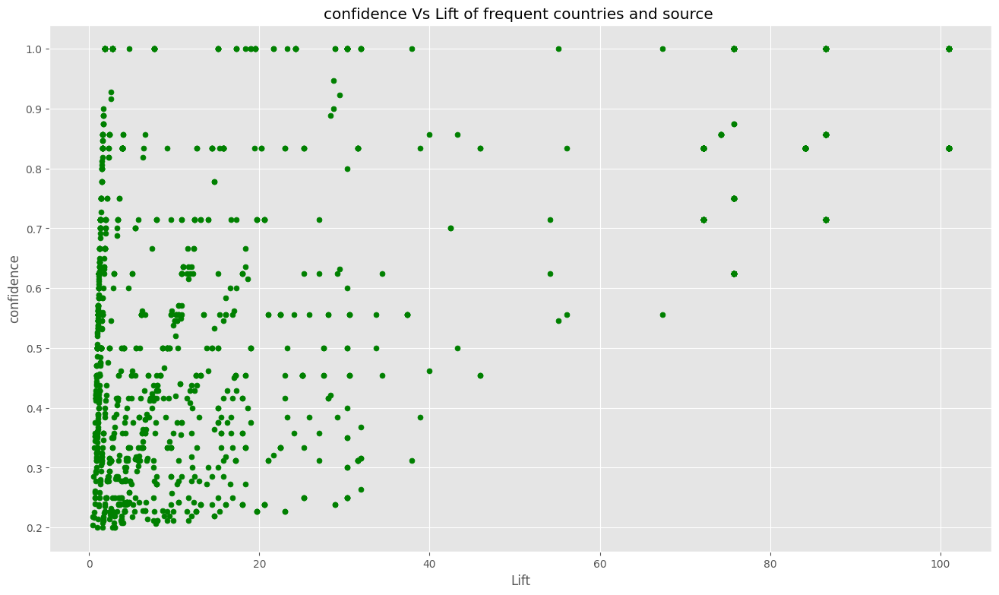

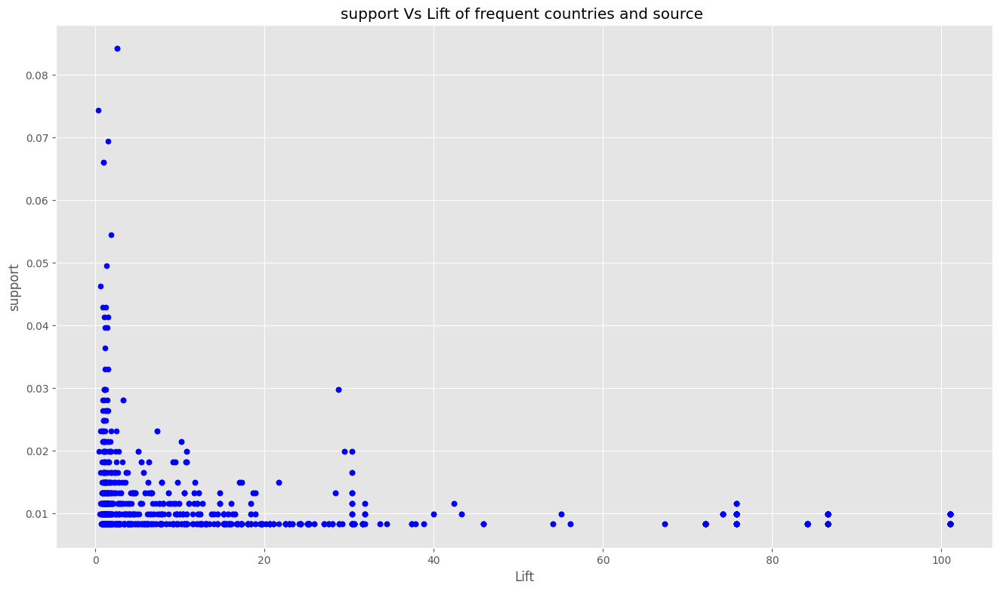

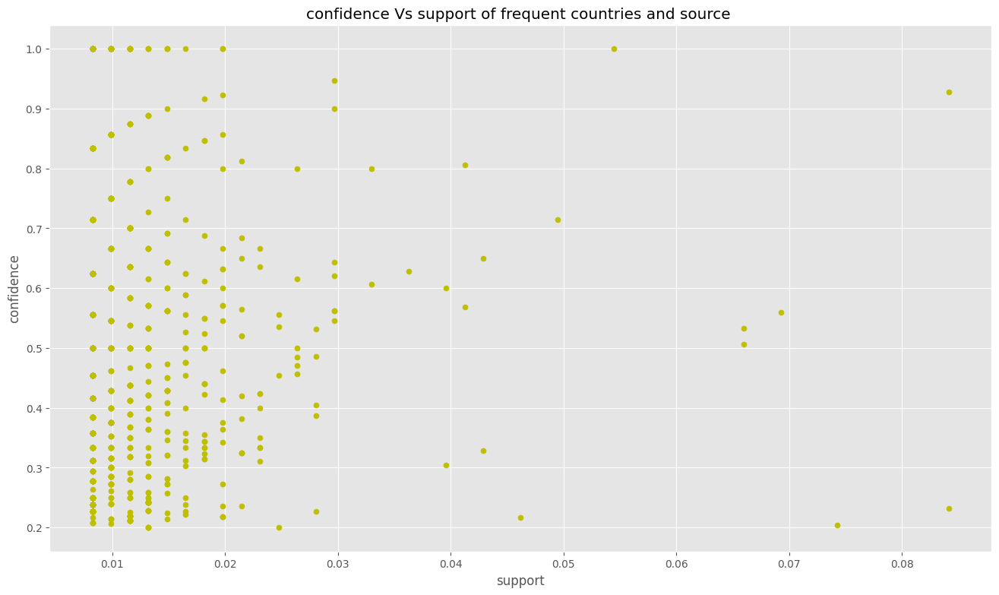

In [211]:
plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['confidence'], c='g', s=25)
plt.ylabel("confidence")
plt.xlabel("Lift")
plt.title("confidence Vs Lift of frequent countries and source ")
plt.show()


plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['support'], c='b', s=25)
plt.ylabel("support")
plt.xlabel("Lift")
plt.title("support Vs Lift of frequent countries and source ")
plt.show()



plt.scatter(fp_growth_rules3['support'], fp_growth_rules3['confidence'], c='y', s=25)
plt.ylabel("confidence")
plt.xlabel("support")
plt.title("confidence Vs support of frequent countries and source ")
plt.show()

### Frequent pattren in tweets by emotions

In [213]:
tokes.sentiment_overall.unique()

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


array(['Neutral', 'Positive', 'Negative'], dtype=object)

In [214]:
tokes_lis=tokes[tokes['sentiment_overall']=='Neutral']['popular_tokens']

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [216]:
te4= TransactionEncoder()
te4_ary = te4.fit(tokes_lis).transform(tokes_lis)
tah_df2= pd.DataFrame(te4_ary, columns=te4.columns_)
tah_df2

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,ab,actually,ad,admini,age,aid,alaughing,already,alway,ame,...,क,त,न,म,य,र,ल,स,ह,க
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
488354,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
488355,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
488356,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
488357,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [219]:
# fpgrowth
frequent_items4 = fpgrowth(tah_df2, min_support=0.008, use_colnames=True)
frequent_items4

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.525761,(trump)
1,0.315006,(biden)
2,0.074384,(donaldtrump)
3,0.012417,(twitter)
4,0.017817,(get)
...,...,...
211,0.010402,"(biden, electionday)"
212,0.008426,"(trump, non)"
213,0.012311,"(trumpv, biden)"
214,0.008129,"(trump, trumpv)"


In [220]:
fp_growth_frq_pattren_6 = frequent_items4
fp_growth_frq_pattren_6['len']= fp_growth_frq_pattren_6.itemsets.apply(lambda x: len(x))  
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']>2]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']>2]

1


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
159,0.012196,"(biden, joe, joebiden)",3


In [225]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]

134


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
0,0.525761,(trump),1
1,0.315006,(biden),1
2,0.074384,(donaldtrump),1
3,0.012417,(twitter),1
4,0.017817,(get),1
...,...,...,...
129,0.012089,(è),1
130,0.008625,(une),1
131,0.009462,(byebyetrump),1
132,0.013066,(trumpv),1


In [224]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]

81


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
134,0.048436,"(trump, biden)",2
135,0.016818,"(trump, donaldtrump)",2
136,0.009485,"(trump, get)",2
137,0.014465,"(trump, trumpi)",2
138,0.038967,"(biden, joebiden)",2
...,...,...,...
211,0.010402,"(biden, electionday)",2
212,0.008426,"(trump, non)",2
213,0.012311,"(trumpv, biden)",2
214,0.008129,"(trump, trumpv)",2


In [221]:
fp_growth_rules3 = association_rules(fp_growth_frq_pattren_6, metric="confidence", min_threshold=0.2)

fp_growth_rules3[fp_growth_rules3['confidence']>0.4][['antecedents', 'consequents', 'antecedent support',
       'consequent support', 'support', 'confidence', 'lift']]

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift
1,(get),(trump),0.017817,0.525761,0.009485,0.532353,1.012538
2,(trumpi),(trump),0.020700,0.525761,0.014465,0.698783,1.329090
3,(wa),(trump),0.029431,0.525761,0.016912,0.574619,1.092929
5,(go),(trump),0.017536,0.525761,0.009258,0.527908,1.004083
6,(people),(trump),0.015102,0.525761,0.008860,0.586712,1.115929
...,...,...,...,...,...,...,...
79,(electionday),(trump),0.030392,0.525761,0.017784,0.585164,1.112985
81,(non),(trump),0.012474,0.525761,0.008426,0.675476,1.284759
82,(trumpv),(biden),0.013066,0.315006,0.012311,0.942172,2.990966
83,(trumpv),(trump),0.013066,0.525761,0.008129,0.622160,1.183351


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


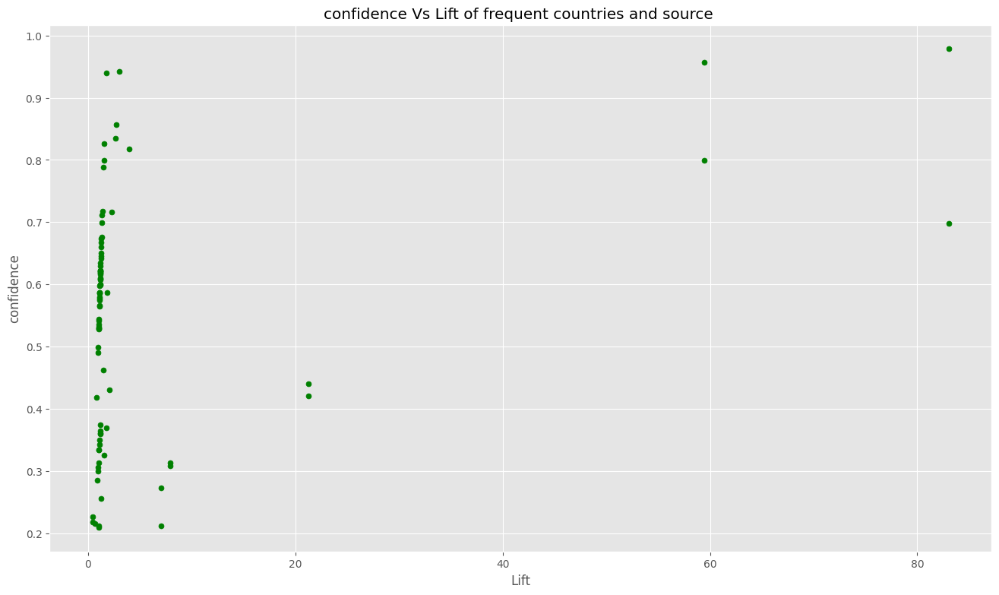

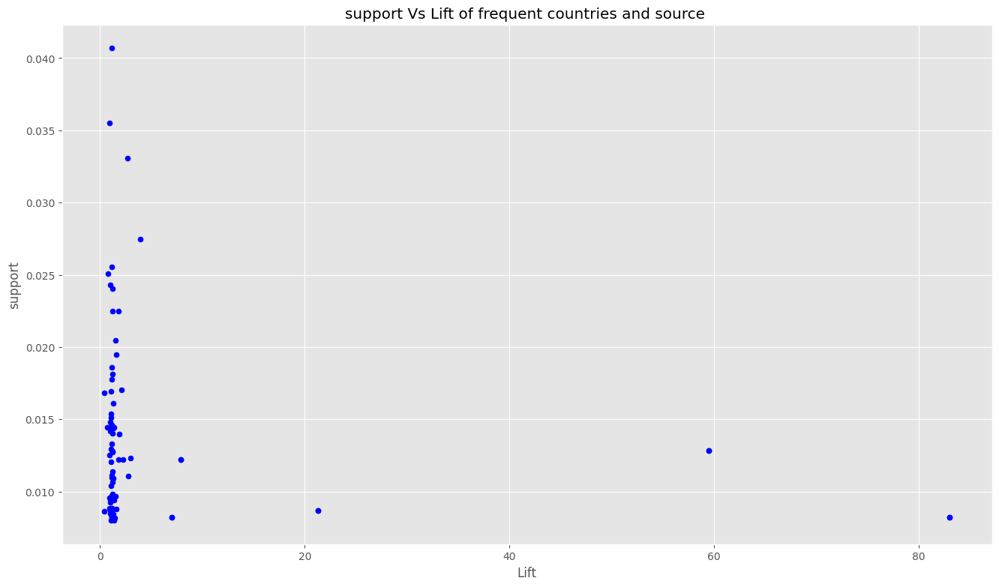

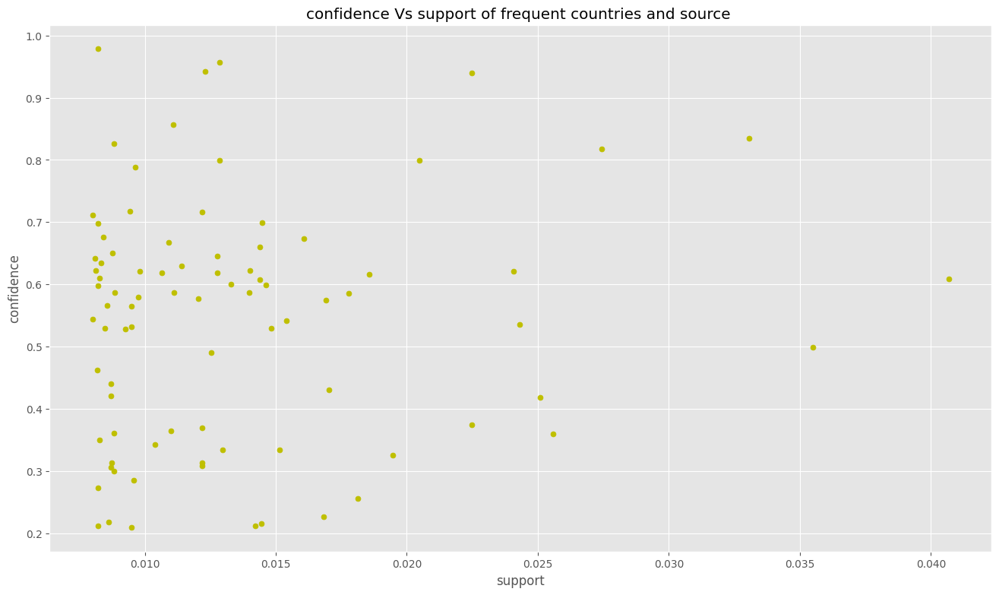

In [222]:
plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['confidence'], c='g', s=25)
plt.ylabel("confidence")
plt.xlabel("Lift")
plt.title("confidence Vs Lift of frequent countries and source ")
plt.show()


plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['support'], c='b', s=25)
plt.ylabel("support")
plt.xlabel("Lift")
plt.title("support Vs Lift of frequent countries and source ")
plt.show()



plt.scatter(fp_growth_rules3['support'], fp_growth_rules3['confidence'], c='y', s=25)
plt.ylabel("confidence")
plt.xlabel("support")
plt.title("confidence Vs support of frequent countries and source ")
plt.show()

In [223]:
tokes_lis=tokes[tokes['sentiment_overall']=='Positive']['popular_tokens']
te4= TransactionEncoder()
te4_ary = te4.fit(tokes_lis).transform(tokes_lis)
tah_df2= pd.DataFrame(te4_ary, columns=te4.columns_)
# fpgrowth
frequent_items4 = fpgrowth(tah_df2, min_support=0.008, use_colnames=True)
frequent_items4

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.533592,(trump)
1,0.098761,(like)
2,0.040952,(ed)
3,0.040561,(know)
4,0.039638,(year)
...,...,...
616,0.015341,"(congratulation, ident)"
617,0.011237,"(congratulation, kamalaharri)"
618,0.013072,"(congratulation, joebiden, ident)"
619,0.010829,"(congratulation, kamalaharri, joebiden)"


In [226]:
fp_growth_frq_pattren_6 = frequent_items4
fp_growth_frq_pattren_6['len']= fp_growth_frq_pattren_6.itemsets.apply(lambda x: len(x))  
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']>2]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']>2]

32


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
303,0.008666,"(trump, biden, ident)",3
304,0.014453,"(biden, joebiden, ident)",3
312,0.008378,"(trump, realdonaldtrump, ident)",3
313,0.008833,"(trump, realdonaldtrump, vote)",3
330,0.012982,"(trump, biden, vote)",3
338,0.009381,"(joebiden, ident, america)",3
350,0.008716,"(trump, amp, vote)",3
376,0.008139,"(trump, biden, joebiden)",3
391,0.008992,"(biden, kamalaharri, joebiden)",3
392,0.012539,"(kamalaharri, joebiden, ident)",3


In [228]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]

282


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
0,0.533592,(trump),1
1,0.098761,(like),1
2,0.040952,(ed),1
3,0.040561,(know),1
4,0.039638,(year),1
...,...,...,...
277,0.033943,(congratulation),1
278,0.008711,(counting),1
279,0.008251,(nevada),1
280,0.012758,(trumpmeltdown),1


In [227]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]

307


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
282,0.060091,"(like, trump)",2
283,0.028239,"(like, biden)",2
284,0.020839,"(like, joebiden)",2
285,0.012034,"(like, vote)",2
286,0.009157,"(like, ident)",2
...,...,...,...
614,0.010685,"(biden, congratulation)",2
615,0.027432,"(congratulation, joebiden)",2
616,0.015341,"(congratulation, ident)",2
617,0.011237,"(congratulation, kamalaharri)",2


In [229]:
fp_growth_rules3 = association_rules(fp_growth_frq_pattren_6, metric="confidence", min_threshold=0.2)

fp_growth_rules3[fp_growth_rules3['confidence']>0.4][['antecedents', 'consequents', 'antecedent support',
       'consequent support', 'support', 'confidence', 'lift']]

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift
0,(like),(trump),0.098761,0.533592,0.060091,0.608452,1.140294
3,(ed),(trump),0.040952,0.533592,0.024655,0.602042,1.128281
6,(know),(trump),0.040561,0.533592,0.023863,0.588329,1.102582
9,(year),(trump),0.039638,0.533592,0.022756,0.574093,1.075901
12,(aid),(trump),0.023119,0.533592,0.013796,0.596727,1.118321
...,...,...,...,...,...,...,...
356,(congratulation),(ident),0.033943,0.114458,0.015341,0.451972,3.948793
359,"(congratulation, joebiden)",(ident),0.027432,0.114458,0.013072,0.476502,4.163099
360,"(congratulation, ident)",(joebiden),0.015341,0.256362,0.013072,0.852044,3.323603
363,"(congratulation, kamalaharri)",(joebiden),0.011237,0.256362,0.010829,0.963677,3.759053


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


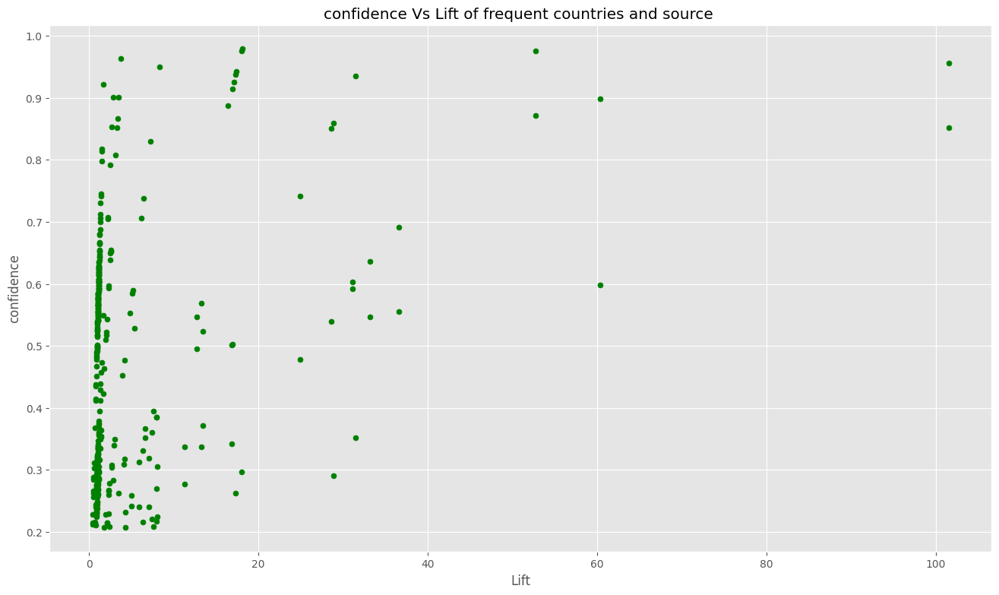

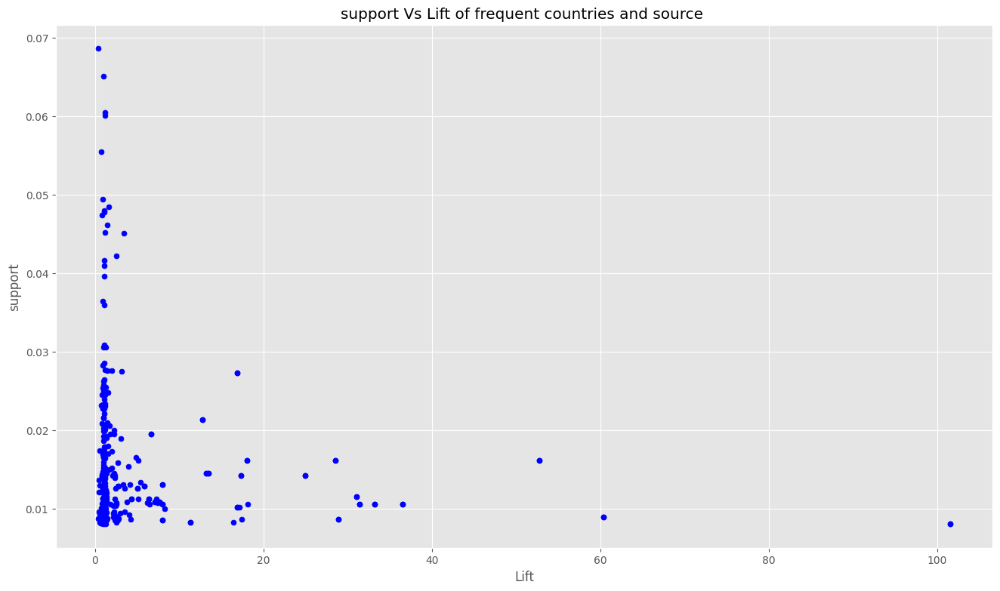

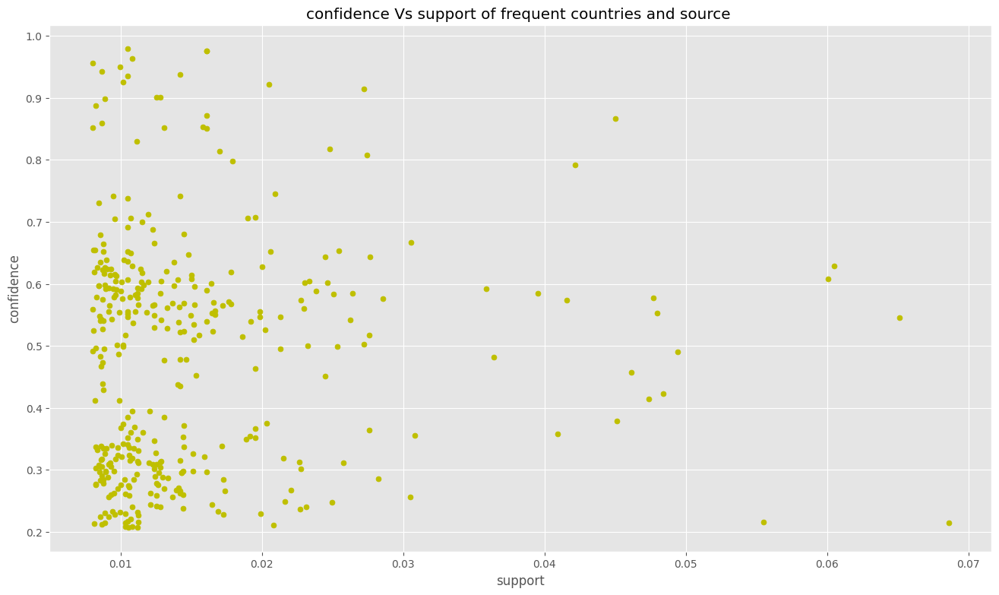

In [230]:
plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['confidence'], c='g', s=25)
plt.ylabel("confidence")
plt.xlabel("Lift")
plt.title("confidence Vs Lift of frequent countries and source ")
plt.show()


plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['support'], c='b', s=25)
plt.ylabel("support")
plt.xlabel("Lift")
plt.title("support Vs Lift of frequent countries and source ")
plt.show()



plt.scatter(fp_growth_rules3['support'], fp_growth_rules3['confidence'], c='y', s=25)
plt.ylabel("confidence")
plt.xlabel("support")
plt.title("confidence Vs support of frequent countries and source ")
plt.show()

In [231]:

tokes_lis=tokes[tokes['sentiment_overall']=='Negative']['popular_tokens']
te4= TransactionEncoder()
te4_ary = te4.fit(tokes_lis).transform(tokes_lis)
tah_df2= pd.DataFrame(te4_ary, columns=te4.columns_)
# fpgrowth
frequent_items4 = fpgrowth(tah_df2, min_support=0.008, use_colnames=True)
frequent_items4

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.666437,(trump)
1,0.034775,(time)
2,0.021797,(never)
3,0.012366,(black)
4,0.011675,(job)
...,...,...
642,0.008119,"(ich, der)"
643,0.014087,"(trump, die, ich)"
644,0.008431,"(die, ich, und)"
645,0.008793,"(die, ich, da)"


In [234]:
fp_growth_frq_pattren_6 = frequent_items4
fp_growth_frq_pattren_6['len']= fp_growth_frq_pattren_6.itemsets.apply(lambda x: len(x))  
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==2]

313


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
299,0.023316,"(trump, time)",2
300,0.008943,"(biden, time)",2
301,0.015078,"(trump, never)",2
302,0.012612,"(trump, hou)",2
303,0.009937,"(white, hou)",2
...,...,...,...
639,0.015560,"(trump, ich)",2
640,0.009149,"(ich, und)",2
641,0.009677,"(ich, da)",2
642,0.008119,"(ich, der)",2


In [237]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==1]

299


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
0,0.666437,(trump),1
1,0.034775,(time),1
2,0.021797,(never),1
3,0.012366,(black),1
4,0.011675,(job),1
...,...,...,...
294,0.018677,(nicht),1
295,0.009820,(wird),1
296,0.020441,(ich),1
297,0.010658,(wahl),1


In [236]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==3]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==3]

32


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
315,0.008697,"(trump, amp, realdonaldtrump)",3
316,0.008554,"(trump, amp, vote)",3
321,0.014207,"(er, die, trump)",3
328,0.008810,"(ing, trump, trumpi)",3
391,0.008770,"(au, die, trump)",3
398,0.012914,"(trump, n, doe)",3
426,0.009046,"(biden, joe, joebiden)",3
427,0.008976,"(trump, biden, joe)",3
456,0.011638,"(trump, biden, vote)",3
457,0.008856,"(trump, realdonaldtrump, vote)",3


In [235]:
print(len(fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==4]))
fp_growth_frq_pattren_6[fp_growth_frq_pattren_6['len']==4]

3


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets,len
594,0.008192,"(trump, die, und, der)",4
597,0.008305,"(trump, die, da, der)",4
625,0.008660,"(trump, die, und, da)",4


In [233]:
fp_growth_rules3 = association_rules(fp_growth_frq_pattren_6, metric="confidence", min_threshold=0.2)

fp_growth_rules3[fp_growth_rules3['confidence']>0.4][['antecedents', 'consequents', 'antecedent support',
       'consequent support', 'support', 'confidence', 'lift']]

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift
0,(time),(trump),0.034775,0.666437,0.023316,0.670489,1.006080
2,(never),(trump),0.021797,0.666437,0.015078,0.691721,1.037939
3,(hou),(trump),0.017560,0.666437,0.012612,0.718206,1.077680
4,(white),(hou),0.019896,0.017560,0.009937,0.499415,28.440308
5,(hou),(white),0.017560,0.019896,0.009937,0.565859,28.440308
...,...,...,...,...,...,...,...
456,(ich),"(die, und)",0.020441,0.025357,0.008431,0.412453,16.266173
458,"(die, ich)",(da),0.018484,0.033778,0.008793,0.475728,14.084109
460,"(ich, da)",(die),0.009677,0.082424,0.008793,0.908654,11.024196
461,(ich),"(die, da)",0.020441,0.025004,0.008793,0.430174,17.204042


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


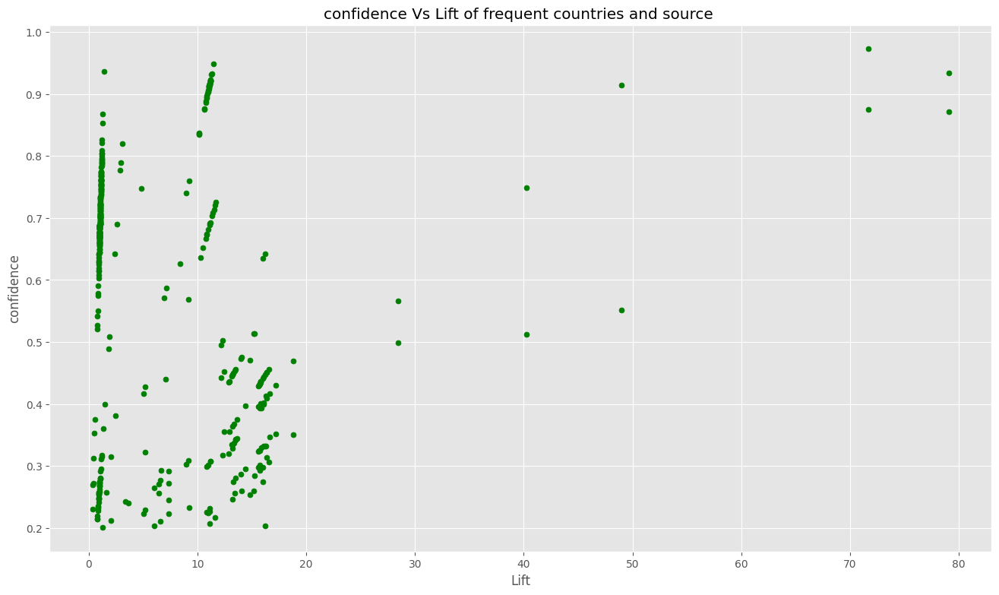

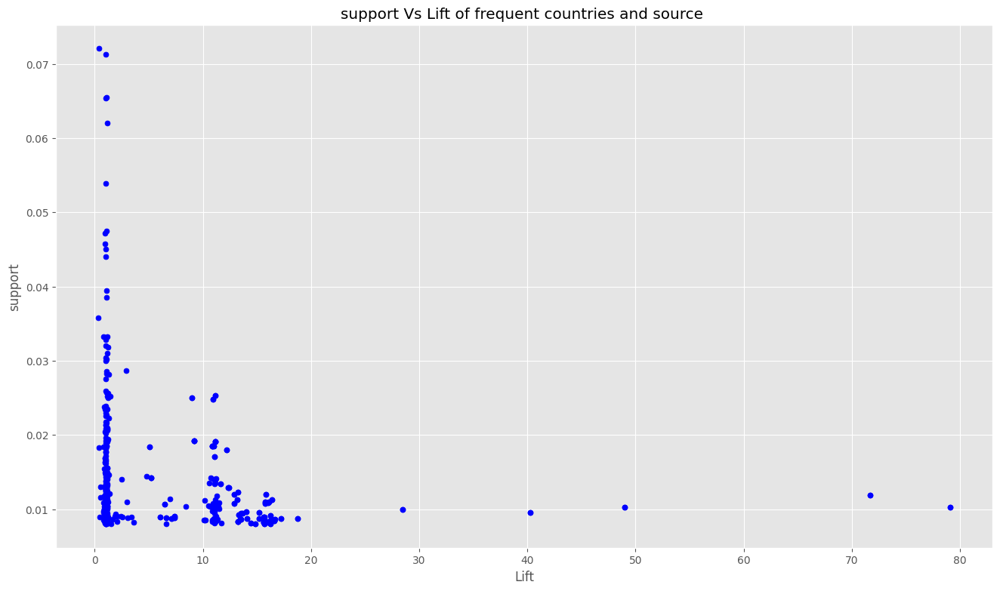

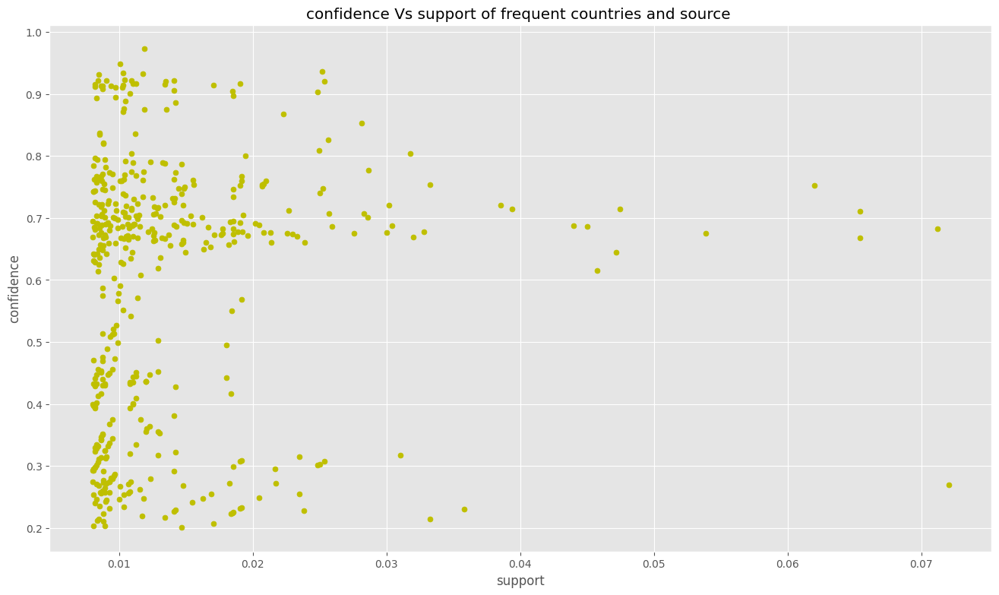

In [238]:
plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['confidence'], c='g', s=25)
plt.ylabel("confidence")
plt.xlabel("Lift")
plt.title("confidence Vs Lift of frequent countries and source ")
plt.show()


plt.scatter(fp_growth_rules3['lift'], fp_growth_rules3['support'], c='b', s=25)
plt.ylabel("support")
plt.xlabel("Lift")
plt.title("support Vs Lift of frequent countries and source ")
plt.show()



plt.scatter(fp_growth_rules3['support'], fp_growth_rules3['confidence'], c='y', s=25)
plt.ylabel("confidence")
plt.xlabel("support")
plt.title("confidence Vs support of frequent countries and source ")
plt.show()